# Setup

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\numpy\_distributor_init.py:32: UserWarning: loaded more than 1 DLL from .libs:
c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\numpy\.libs\libopenblas.2V74HQ3MKNZHDCKJELIPPY7V6QMK3UOZ.gfortran-win32.dll
c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\numpy\.libs\libopenblas.JKAMQ5EVHIVCPXP2XZJB2RQPIN47S32M.gfortran-win32.dll
  stacklevel=1)


In [2]:
def calculate_change(column):
    i = 0
    j = 1
    end = []
    while j < len(column):
        try:
            end.append((column[j] - column[i]) / column[i])
        except:
            end.append(1)
        i += 1
        j += 1
    end.append(0)
    return end

In [3]:
filepath = "C:\\Users\\Thalo\\Downloads\\covid_confirmed_usafacts.csv"
df = pd.read_csv(filepath)
df.head()

,countyFIPS,County Name,State,stateFIPS,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,6/22/20,6/23/20,6/24/20,6/25/20,6/26/20,6/27/20,6/28/20,6/29/20,6/30/20,Unnamed: 165
0,0,Statewide Unallocated,AL,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,NaN
1,1001,Autauga County,AL,1,0,0,0,0,0,0,...,442,453,469,479,488,498,503,527,537,NaN
2,1003,Baldwin County,AL,1,0,0,0,0,0,0,...,437,450,464,477,515,555,575,643,680,NaN
3,1005,Barbour County,AL,1,0,0,0,0,0,0,...,277,280,288,305,312,317,317,322,325,NaN
4,1007,Bibb County,AL,1,0,0,0,0,0,0,...,129,135,141,149,153,161,162,165,170,NaN


In [4]:
df = df.set_index("County Name").T
df.drop(["countyFIPS", "State", "stateFIPS"], inplace=True)

df.drop(df.index[df.index.str.contains("Unnamed")], inplace=True)

In [5]:
df[df.iloc[-1][df.iloc[-1] > 15000].index].tail()

County Name,Maricopa County,Los Angeles County,Riverside County,Fairfield County,Fairfield County,Fairfield County,Broward County,Miami-Dade County,Cook County,Cook County,...,Suffolk County,Westchester County,Philadelphia County,Dallas County,Dallas County,Dallas County,Dallas County,Dallas County,Harris County,Harris County
6/26/20,39626,93232,15643,16564,448,272,13320,30196,122,89068,...,41208,34700,21203,733,6,1120,12,18538,303,27017
6/27/20,42374,95371,15643,16606,458,279,14046,31562,127,89407,...,41253,34748,21327,750,7,1134,12,19034,306,28255
6/28/20,44962,97894,16108,16633,470,280,14620,33714,130,89755,...,41306,34780,21415,753,9,1170,12,19595,306,29163
6/29/20,45178,100772,16634,16664,476,288,15045,35222,132,90122,...,41339,34789,21512,787,10,1174,13,20165,313,29276
6/30/20,48592,103529,17296,16703,481,298,15624,36820,139,90536,...,41385,34838,21600,814,10,1176,13,20737,334,30729


In [6]:
df.iloc[-1][df.iloc[-1] > 15000]
relevant_column_positions = np.where(df.iloc[-1] > 15000)[0]
print(len(relevant_column_positions))
for pos in relevant_column_positions:
    print(df.iloc[50:, pos])

29
3/12/20        3
3/13/20        3
3/14/20        4
3/15/20        4
3/16/20        8
           ...  
6/26/20    39626
6/27/20    42374
6/28/20    44962
6/29/20    45178
6/30/20    48592
Name: Maricopa County, Length: 111, dtype: object
3/12/20        29
3/13/20        40
3/14/20        53
3/15/20        69
3/16/20        94
            ...  
6/26/20     93232
6/27/20     95371
6/28/20     97894
6/29/20    100772
6/30/20    103529
Name: Los Angeles County, Length: 111, dtype: object
3/12/20        8
3/13/20        8
3/14/20        8
3/15/20       14
3/16/20       15
           ...  
6/26/20    15643
6/27/20    15643
6/28/20    16108
6/29/20    16634
6/30/20    17296
Name: Riverside County, Length: 111, dtype: object
3/12/20        4
3/13/20        5
3/14/20       15
3/15/20       16
3/16/20       29
           ...  
6/26/20    16564
6/27/20    16606
6/28/20    16633
6/29/20    16664
6/30/20    16703
Name: Fairfield County, Length: 111, dtype: object
3/12/20       11
3/13/20       20

In [7]:
def create_plots(index):
    subdf = pd.DataFrame(df.iloc[:, index])
    subdf['change'] = calculate_change(df.iloc[:, index])
    
    plt.subplot(2, 1, 1)
    plt.plot(np.arange(35, len(subdf)-1), subdf.change[35:-1])
    plt.title("Rate of Change of {} confirmed cases".format(subdf.columns[0]))
#     plt.xlabel("Days since 1/22")
    plt.ylabel("Rate of Daily Change, %")

    plt.grid()
    plt.ylim(-0.05, 1.05)
    
    plt.subplot(2, 1, 2)
    plt.plot(np.arange(0, len(subdf)), subdf.iloc[:, 0])
#     plt.title("Log scale of {} confirmed cases".format(subdf.columns[0]))
    plt.xlabel("Days since 1/22")
    plt.ylabel("Number of Confirmed Cases, {}".format(subdf.columns[0]))

    plt.yscale('log')
    plt.grid()
    plt.xlim(35, 134)
    plt.ylim(1, 200000)

In [8]:
def create_roc_and_new_case_numbers(col, name):
    new = col
    new_df = pd.DataFrame(new)
    new_df['change'] = calculate_change(new)

    plt.plot(np.arange(35, len(new_df)-1), new_df.change[35:-1])
    plt.plot(np.arange(35, len(new_df)-1), [.01]*len(new_df.change[35:-1]), linestyle='dashed')
    plt.title("Rate of Change of {} County confirmed cases".format(name))
    plt.xlabel("Days since 1/22")
    plt.ylabel("Rate of Daily Change, %")

    plt.grid()
    # plt.ylim(-0.05, 1.05)
    plt.ylim(-0.005, .15)
    plt.show()
    plt.close()

    new_new_cases = new.values[1:] - new.values[:-1]

    # print(mchenry)
    plt.plot(np.arange(35, len(new_new_cases)), new_new_cases[35:])
    plt.title("{} County New Cases, Absolute".format(name))
    plt.grid()
    plt.show()
    plt.close()
    return new_df, new_new_cases

def create_roc_graphs(col, name):
    new = col
    new_df = pd.DataFrame(new)
    new_df['change'] = calculate_change(new)

    plt.plot(np.arange(35, len(new_df)-1), new_df.change[35:-1])
    plt.plot(np.arange(35, len(new_df)-1), [.01]*len(new_df.change[35:-1]), linestyle='dashed')
    plt.title("Rate of Change of {} confirmed cases".format(name))
    plt.xlabel("Days since 1/22")
    plt.ylabel("Rate of Daily Change, %")

    plt.grid()
    # plt.ylim(-0.05, 1.05)
    plt.ylim(-0.005, .15)

def create_new_case_graphs(col, name):
    new = col
    new_new_cases = new.values[1:] - new.values[:-1]

    # print(mchenry)
    plt.plot(np.arange(35, len(new_new_cases)), new_new_cases[35:])
    plt.title("{} New Cases, Absolute".format(name))
    plt.grid()

In [9]:
# Exploring how to delimit high/low counties:
start = len(df) - 90
df.shape[0] - start
midpoint = start + (df.shape[0] - start) // 2
midpoint

116

# Create initial plots

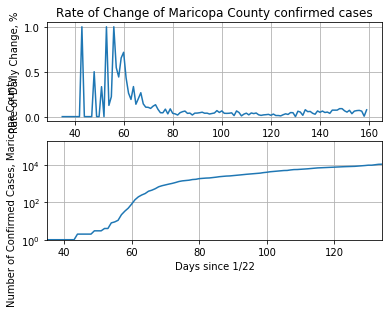

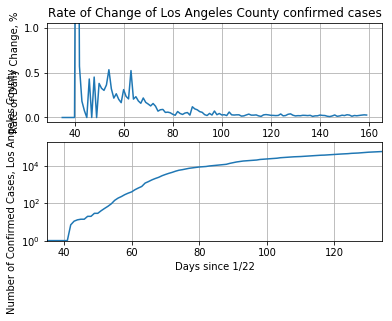

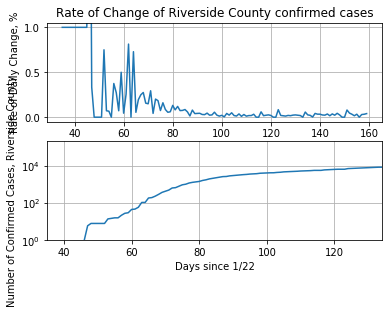

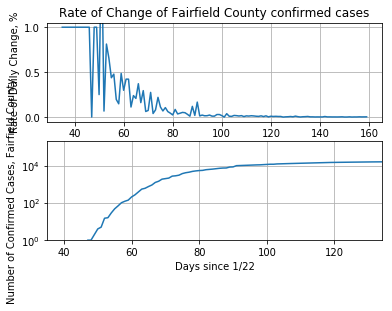

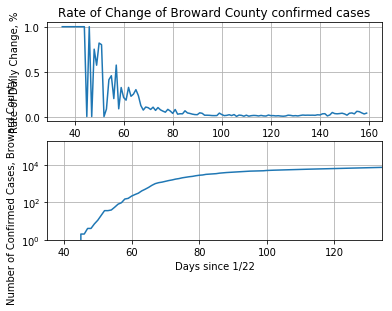

...

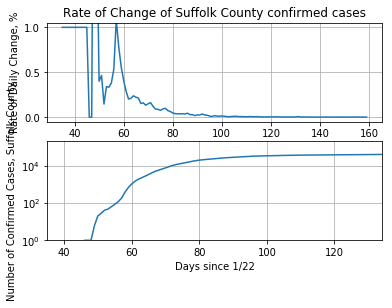

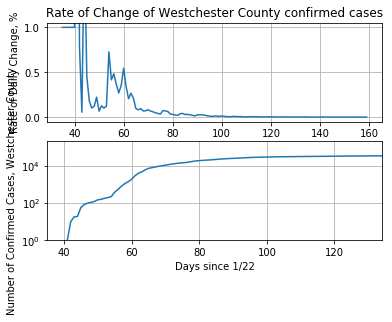

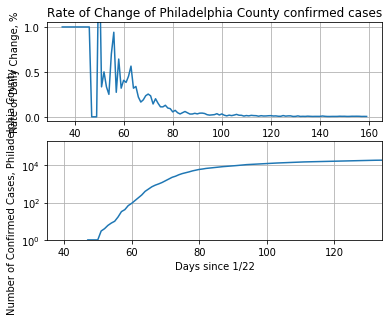

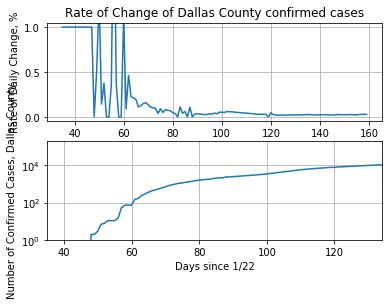

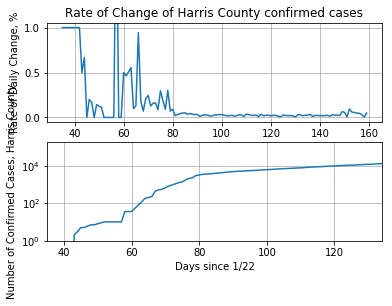

In [10]:
for i in range(len(relevant_column_positions)):
    create_plots(relevant_column_positions[i])
    plt.show()
    plt.close()

# Create Local (Chicagoland) Plots

In [11]:
cook = df['Cook County'].iloc[:, 1]
cook

1/22/20        0
1/23/20        0
1/24/20        1
1/25/20        1
1/26/20        1
           ...  
6/26/20    89068
6/27/20    89407
6/28/20    89755
6/29/20    90122
6/30/20    90536
Name: Cook County, Length: 161, dtype: object

In [12]:
cook_df = pd.DataFrame(cook)
cook_df['change'] = calculate_change(cook)
cook_df

,Cook County,change
1/22/20,0,1.000000
1/23/20,0,1.000000
1/24/20,1,0.000000
1/25/20,1,0.000000
1/26/20,1,0.000000
...,...,...
6/26/20,89068,0.003806
6/27/20,89407,0.003892
6/28/20,89755,0.004089
6/29/20,90122,0.004594


In [13]:
cook_df['change'][-30:]

6/1/20     0.015007
6/2/20     0.006665
6/3/20     0.006346
6/4/20     0.007818
6/5/20     0.007130
6/6/20     0.006140
6/7/20     0.004756
6/8/20     0.005458
6/9/20     0.003771
6/10/20    0.004702
6/11/20    0.003227
6/12/20    0.003941
6/13/20    0.003842
6/14/20    0.003274
6/15/20    0.004156
6/16/20    0.003741
6/17/20    0.003739
6/18/20    0.004317
6/19/20    0.003859
6/20/20    0.003361
6/21/20    0.002833
6/22/20    0.004118
6/23/20    0.004033
6/24/20    0.005809
6/25/20    0.004715
6/26/20    0.003806
6/27/20    0.003892
6/28/20    0.004089
6/29/20    0.004594
6/30/20    0.000000
Name: change, dtype: float64

(-0.005, 0.15)

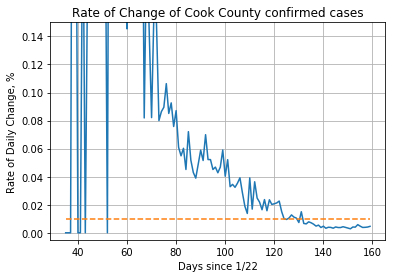

In [14]:
plt.plot(np.arange(35, len(cook_df)-1), cook_df.change[35:-1])
plt.plot(np.arange(35, len(cook_df)-1), [.01]*len(cook_df.change[35:-1]), linestyle='dashed')
plt.title("Rate of Change of Cook County confirmed cases")
plt.xlabel("Days since 1/22")
plt.ylabel("Rate of Daily Change, %")

plt.grid()
# plt.ylim(-0.05, 1.05)
plt.ylim(-0.005, .15)

(25, 200000)

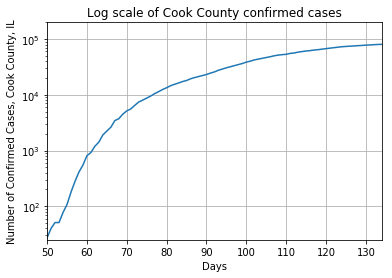

In [15]:
plt.plot(np.arange(0, len(cook_df)), cook_df['Cook County'])
plt.title("Log scale of Cook County confirmed cases")
plt.xlabel("Days")
plt.ylabel("Number of Confirmed Cases, Cook County, IL")

plt.yscale('log')
plt.grid()
plt.xlim(50, 134)
plt.ylim(25, 200000)

1/22/20        0
1/23/20        0
1/24/20        1
1/25/20        1
1/26/20        1
           ...  
6/26/20    89068
6/27/20    89407
6/28/20    89755
6/29/20    90122
6/30/20    90536
Name: Cook County, Length: 161, dtype: object


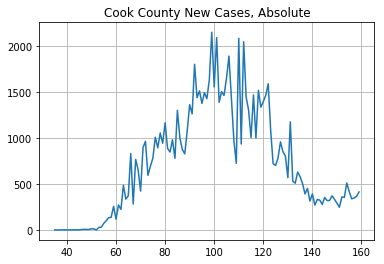

In [16]:
cook_new_cases = cook.values[1:] - cook.values[:-1]

print(cook)
plt.plot(np.arange(35, len(cook_new_cases)), cook_new_cases[35:])
plt.title("Cook County New Cases, Absolute")
plt.grid()

91      9.0
92      8.0
93      7.0
94      7.0
95      8.0
96      8.0
97      9.0
98      9.0
99      9.0
100    10.0
101    11.0
102    10.0
103    11.0
104    11.0
105    11.0
106    12.0
107    13.0
108    13.0
109    13.0
110    13.0
111    13.0
112    13.0
113    13.0
114    13.0
115    13.0
116    14.0
117    13.0
118    13.0
119    12.0
120    11.0
121    11.0
122    11.0
123    10.0
124     9.0
125     8.0
126     7.0
127     6.0
128     5.0
129     4.0
130     3.0
dtype: float64
92     1292.000000
93     1315.000000
94     1398.857143
95     1343.857143
96     1304.000000
97     1186.857143
98     1107.857143
99     1045.285714
100     957.428571
101     845.000000
102     771.142857
103     836.285714
104     811.857143
105     772.428571
106     725.428571
107     686.428571
108     643.142857
109     617.714286
110     514.000000
111     483.000000
112     466.428571
113     415.000000
114     379.571429
115     354.142857
116     337.857143
117     323.857143
118     324

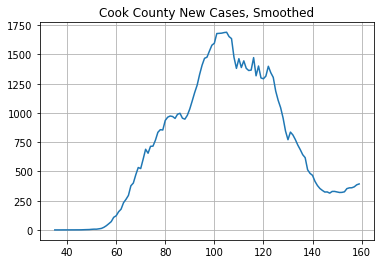

In [17]:
def detect_consecutive_decline(threshold, smooth_factor, data):
    data = data.rolling(smooth_factor).mean()
    data_bool = data[1:].reset_index(drop=True) < data[:-1]
    
    return data_bool.rolling(threshold).sum()
#     return data.reset_index(drop=True)

num_days = 7

print(detect_consecutive_decline(14, num_days, pd.Series(cook_new_cases[35-num_days:]))[-40:])

print(pd.Series(cook_new_cases[35-num_days:]).rolling(num_days).mean()[-40:])

plt.plot(np.arange(35, len(cook_new_cases)), pd.Series(cook_new_cases[35-num_days:]).rolling(num_days).mean()[num_days:])
plt.title("Cook County New Cases, Smoothed")
plt.grid()

In [18]:
# def detect_consecutive_decline(threshold, smooth_factor, data):
#     data = data.rolling(smooth_factor).mean()
#     data_bool = data[1:].reset_index(drop=True) < data[:-1].reset_index(drop=True)
#     while data_bool.rolling(threshold).sum().max() < threshold:
#         threshold -= 1
#     return data_bool.rolling(threshold).sum(), threshold
# #     return data.reset_index(drop=True)


# illinois = single_state("IL").sum(axis=1)[1:].reset_index(drop=True) - single_state("IL").sum(axis=1)[:-1].reset_index(drop=True)

# num_days = 2
# threshold = 14

# result = detect_consecutive_decline(threshold, num_days, illinois[35-num_days:])
# print(result[0][-40:], result[1], sep="\n")

# # print(illinois[35-num_days:].rolling(num_days).mean()[-40:])

# plt.plot(np.arange(35, len(cook_new_cases)), illinois[35-num_days:].rolling(num_days).mean()[num_days:])
# plt.title("IL New Cases, Smoothed")
# plt.grid()

# # print(single_state("IL").sum(axis=1))

Text(0.5, 1.0, 'Cook County New Cases, % Change')

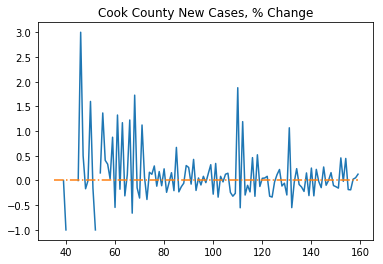

In [19]:
plt.plot(np.arange(35, len(cook_new_cases)), pd.Series(cook_new_cases[35:]).pct_change())
plt.plot(np.arange(35, len(cook_new_cases)), [0]*(len(cook_new_cases)-35), linestyle="dashdot")
plt.title("Cook County New Cases, % Change")

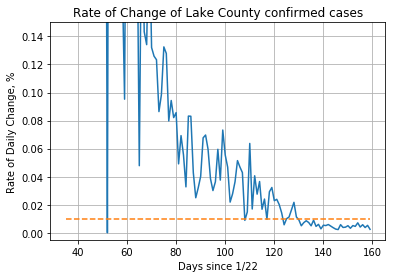

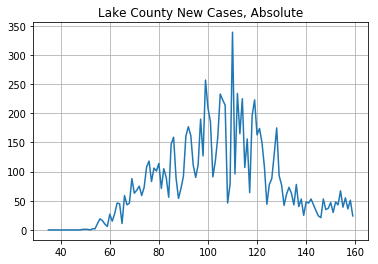

In [20]:
lake = df['Lake County'].iloc[:, 3]
lake_df = pd.DataFrame(lake)
lake_df['change'] = calculate_change(lake)

plt.plot(np.arange(35, len(lake_df)-1), lake_df.change[35:-1])
plt.plot(np.arange(35, len(lake_df)-1), [.01]*len(lake_df.change[35:-1]), linestyle='dashed')
plt.title("Rate of Change of Lake County confirmed cases")
plt.xlabel("Days since 1/22")
plt.ylabel("Rate of Daily Change, %")

plt.grid()
# plt.ylim(-0.05, 1.05)
plt.ylim(-0.005, .15)
plt.show()
plt.close()

lake_new_cases = lake.values[1:] - lake.values[:-1]

# print(lake)
plt.plot(np.arange(35, len(lake_new_cases)), lake_new_cases[35:])
plt.title("Lake County New Cases, Absolute")
plt.grid()

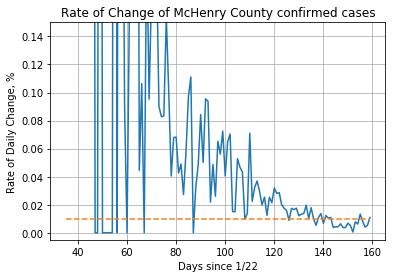

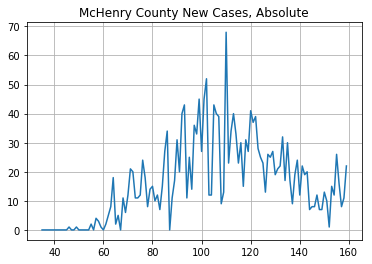

In [21]:
mchenry = df['McHenry County'].iloc[:, 0]
mchenry_df = pd.DataFrame(mchenry)
mchenry_df['change'] = calculate_change(mchenry)

plt.plot(np.arange(35, len(mchenry_df)-1), mchenry_df.change[35:-1])
plt.plot(np.arange(35, len(mchenry_df)-1), [.01]*len(mchenry_df.change[35:-1]), linestyle='dashed')
plt.title("Rate of Change of McHenry County confirmed cases")
plt.xlabel("Days since 1/22")
plt.ylabel("Rate of Daily Change, %")

plt.grid()
# plt.ylim(-0.05, 1.05)
plt.ylim(-0.005, .15)
plt.show()
plt.close()

mchenry_new_cases = mchenry.values[1:] - mchenry.values[:-1]

# print(mchenry)
plt.plot(np.arange(35, len(mchenry_new_cases)), mchenry_new_cases[35:])
plt.title("McHenry County New Cases, Absolute")
plt.grid()

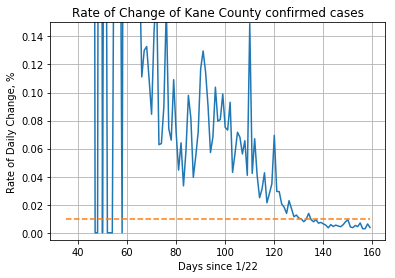

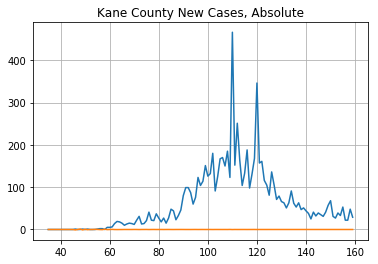

In [22]:
kane = df['Kane County'].iloc[:, 0]
kane_df = pd.DataFrame(kane)
kane_df['change'] = calculate_change(kane)

plt.plot(np.arange(35, len(kane_df)-1), kane_df.change[35:-1])
plt.plot(np.arange(35, len(kane_df)-1), [.01]*len(kane_df.change[35:-1]), linestyle='dashed')
plt.title("Rate of Change of Kane County confirmed cases")
plt.xlabel("Days since 1/22")
plt.ylabel("Rate of Daily Change, %")

plt.grid()
# plt.ylim(-0.05, 1.05)
plt.ylim(-0.005, .15)
plt.show()
plt.close()

kane_new_cases = kane_df.values[1:] - kane_df.values[:-1]

# print(lake)
plt.plot(np.arange(35, len(kane_new_cases)), kane_new_cases[35:])
plt.title("Kane County New Cases, Absolute")
plt.grid()

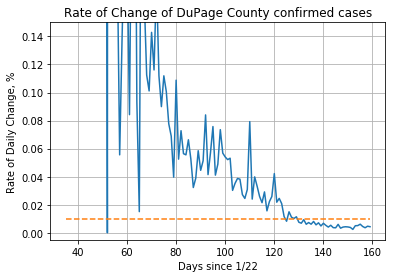

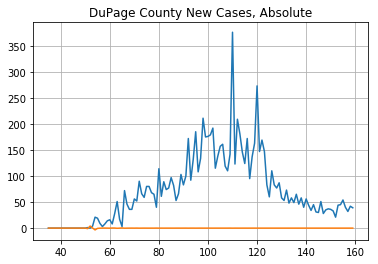

In [23]:
dupage = df['DuPage County']
dupage_df = pd.DataFrame(dupage)
dupage_df['change'] = calculate_change(dupage)

plt.plot(np.arange(35, len(dupage_df)-1), dupage_df.change[35:-1])
plt.plot(np.arange(35, len(dupage_df)-1), [.01]*len(dupage_df.change[35:-1]), linestyle='dashed')
plt.title("Rate of Change of DuPage County confirmed cases")
plt.xlabel("Days since 1/22")
plt.ylabel("Rate of Daily Change, %")

plt.grid()
# plt.ylim(-0.05, 1.05)
plt.ylim(-0.005, .15)
plt.show()
plt.close()

dupage_new_cases = dupage_df.values[1:] - dupage_df.values[:-1]

# print(lake)
plt.plot(np.arange(35, len(dupage_new_cases)), dupage_new_cases[35:])
plt.title("DuPage County New Cases, Absolute")
plt.grid()

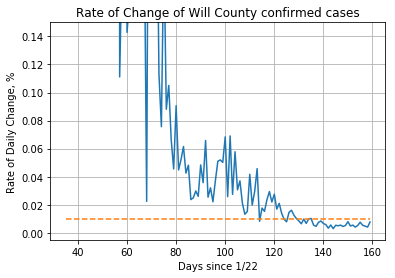

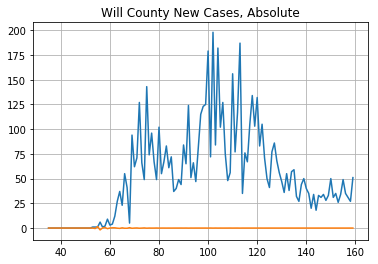

In [24]:
will = df['Will County']
will_df = pd.DataFrame(will)
will_df['change'] = calculate_change(will)

plt.plot(np.arange(35, len(will_df)-1), will_df.change[35:-1])
plt.plot(np.arange(35, len(will_df)-1), [.01]*len(will_df.change[35:-1]), linestyle='dashed')
plt.title("Rate of Change of Will County confirmed cases")
plt.xlabel("Days since 1/22")
plt.ylabel("Rate of Daily Change, %")

plt.grid()
# plt.ylim(-0.05, 1.05)
plt.ylim(-0.005, .15)
plt.show()
plt.close()

will_new_cases = will_df.values[1:] - will_df.values[:-1]

# print(will)
plt.plot(np.arange(35, len(will_new_cases)), will_new_cases[35:])
plt.title("Will County New Cases, Absolute")
plt.grid()

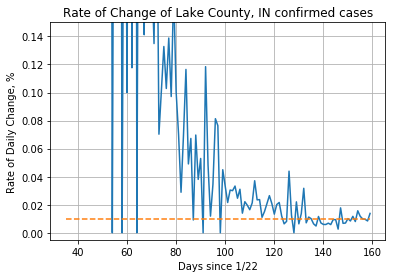

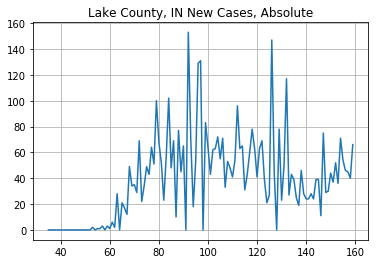

In [25]:
lake = df['Lake County'].iloc[:, 4]
lake_df = pd.DataFrame(lake)
lake_df['change'] = calculate_change(lake)

plt.plot(np.arange(35, len(lake_df)-1), lake_df.change[35:-1])
plt.plot(np.arange(35, len(lake_df)-1), [.01]*len(lake_df.change[35:-1]), linestyle='dashed')
plt.title("Rate of Change of Lake County, IN confirmed cases")
plt.xlabel("Days since 1/22")
plt.ylabel("Rate of Daily Change, %")

plt.grid()
# plt.ylim(-0.05, 1.05)
plt.ylim(-0.005, .15)
plt.show()
plt.close()

lake_new_cases = lake.values[1:] - lake.values[:-1]

# print(lake)
plt.plot(np.arange(35, len(lake_new_cases)), lake_new_cases[35:])
plt.title("Lake County, IN New Cases, Absolute")
plt.grid()

# Entire USA

In [26]:
# df.iterrows().apply(lambda row: row.sum())

new_col = [x[1].sum() for x in df.iterrows()]
df['Country_Agg'] = new_col

In [27]:
country = df['Country_Agg']
country_df = pd.DataFrame(country)
country_df['change'] = calculate_change(country)
country_df

,Country_Agg,change
1/22/20,1,0.000000
1/23/20,1,1.000000
1/24/20,2,0.000000
1/25/20,2,1.500000
1/26/20,5,0.200000
...,...,...
6/26/20,2451171,0.017257
6/27/20,2493470,0.015983
6/28/20,2533323,0.015419
6/29/20,2572385,0.018050


(-0.005, 0.3)

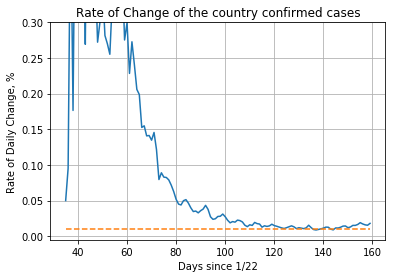

In [28]:
plt.plot(np.arange(35, len(country_df)-1), country_df.change[35:-1])
plt.plot(np.arange(35, len(country_df)-1), [.01]*len(country_df.change[35:-1]), linestyle='dashed')
plt.title("Rate of Change of the country confirmed cases")
plt.xlabel("Days since 1/22")
plt.ylabel("Rate of Daily Change, %")

plt.grid()
# plt.ylim(-0.05, 1.05)
plt.ylim(-0.005, .3)

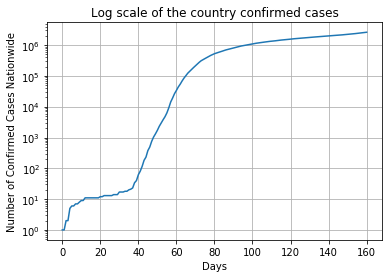

In [29]:
plt.plot(np.arange(0, len(country_df)), country_df['Country_Agg'])
plt.title("Log scale of the country confirmed cases")
plt.xlabel("Days")
plt.ylabel("Number of Confirmed Cases Nationwide")

plt.yscale('log')
plt.grid()
# plt.xlim(50, 134)
# plt.ylim(1, 50000)

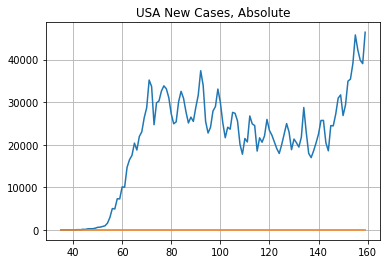

In [30]:
country_new_cases = country_df.values[1:] - country_df.values[:-1]

# print(will)
plt.plot(np.arange(35, len(country_new_cases)), country_new_cases[35:])
plt.title("USA New Cases, Absolute")
plt.grid()

In [31]:
cook = df['Cook County'].iloc[:, 1]
cook_df = pd.DataFrame(cook)
cook_df['change'] = calculate_change(cook)
cook_df

,Cook County,change
1/22/20,0,1.000000
1/23/20,0,1.000000
1/24/20,1,0.000000
1/25/20,1,0.000000
1/26/20,1,0.000000
...,...,...
6/26/20,89068,0.003806
6/27/20,89407,0.003892
6/28/20,89755,0.004089
6/29/20,90122,0.004594


# Plot Big Cities

In [32]:
wayne = df['Wayne County'].iloc[:, 5]
wayne

1/22/20        0
1/23/20        0
1/24/20        0
1/25/20        0
1/26/20        0
           ...  
6/26/20    22479
6/27/20    22579
6/28/20    22621
6/29/20    22662
6/30/20    22767
Name: Wayne County, Length: 161, dtype: object

In [33]:
wayne_df = pd.DataFrame(wayne)
wayne_df['change'] = calculate_change(wayne)
wayne_df

,Wayne County,change
1/22/20,0,1.000000
1/23/20,0,1.000000
1/24/20,0,1.000000
1/25/20,0,1.000000
1/26/20,0,1.000000
...,...,...
6/26/20,22479,0.004449
6/27/20,22579,0.001860
6/28/20,22621,0.001812
6/29/20,22662,0.004633


(-0.005, 0.4)

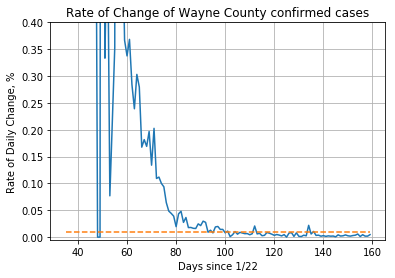

In [34]:
plt.plot(np.arange(35, len(wayne_df)-1), wayne_df.change[35:-1])
plt.title("Rate of Change of Wayne County confirmed cases")
plt.xlabel("Days since 1/22")
plt.ylabel("Rate of Daily Change, %")

plt.grid()
# plt.ylim(-0.05, 1.05)

plt.plot(np.arange(35, len(wayne_df)-1), [.01]*len(wayne_df.change[35:-1]), linestyle='dashed')
plt.ylim(-0.005, .4)

(1, 50000)

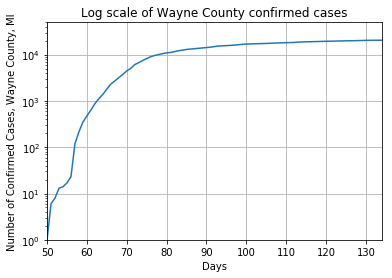

In [35]:
plt.plot(np.arange(0, len(wayne_df)), wayne_df['Wayne County'])
plt.title("Log scale of Wayne County confirmed cases")
plt.xlabel("Days")
plt.ylabel("Number of Confirmed Cases, Wayne County, MI")

plt.yscale('log')
plt.grid()
plt.xlim(50, 134)
plt.ylim(1, 50000)

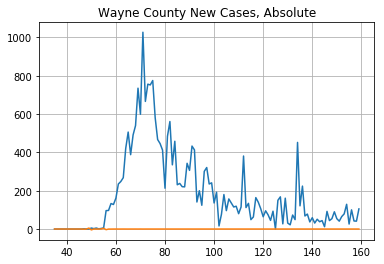

In [36]:
wayne_new_cases = wayne_df.values[1:] - wayne_df.values[:-1]

# print(will)
plt.plot(np.arange(35, len(wayne_new_cases)), wayne_new_cases[35:])
plt.title("Wayne County New Cases, Absolute")
plt.grid()

In [37]:
la = df['Los Angeles County'].iloc[:]
la

1/22/20         0
1/23/20         0
1/24/20         0
1/25/20         0
1/26/20         1
            ...  
6/26/20     93232
6/27/20     95371
6/28/20     97894
6/29/20    100772
6/30/20    103529
Name: Los Angeles County, Length: 161, dtype: object

In [38]:
la_df = pd.DataFrame(la)
la_df['change'] = calculate_change(la)
la_df

,Los Angeles County,change
1/22/20,0,1.000000
1/23/20,0,1.000000
1/24/20,0,1.000000
1/25/20,0,1.000000
1/26/20,1,0.000000
...,...,...
6/26/20,93232,0.022943
6/27/20,95371,0.026455
6/28/20,97894,0.029399
6/29/20,100772,0.027359


(-0.005, 0.4)

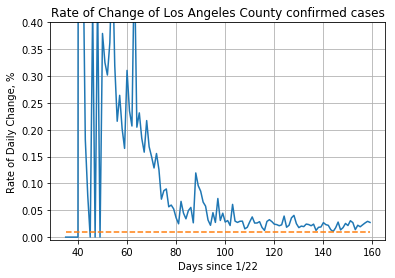

In [39]:
plt.plot(np.arange(35, len(la_df)-1), la_df.change[35:-1])
plt.title("Rate of Change of Los Angeles County confirmed cases")
plt.xlabel("Days since 1/22")
plt.ylabel("Rate of Daily Change, %")

plt.grid()
# plt.ylim(-0.05, 1.05)

plt.plot(np.arange(35, len(la_df)-1), [.01]*len(la_df.change[35:-1]), linestyle='dashed')
plt.ylim(-0.005, .4)

(40, 134)

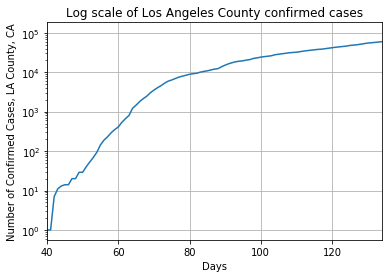

In [40]:
plt.plot(np.arange(0, len(la_df)), la_df['Los Angeles County'])
plt.title("Log scale of Los Angeles County confirmed cases")
plt.xlabel("Days")
plt.ylabel("Number of Confirmed Cases, LA County, CA")

plt.yscale('log')
plt.grid()
plt.xlim(40, 134)

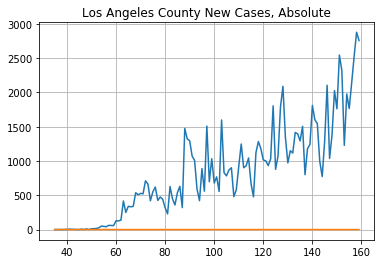

In [41]:
la_new_cases = la_df.values[1:] - la_df.values[:-1]

# print(will)
plt.plot(np.arange(35, len(la_new_cases)), la_new_cases[35:])
plt.title("Los Angeles County New Cases, Absolute")
plt.grid()

In [42]:
miami = df['Miami-Dade County'].iloc[:]
miami

1/22/20        0
1/23/20        0
1/24/20        0
1/25/20        0
1/26/20        0
           ...  
6/26/20    30196
6/27/20    31562
6/28/20    33714
6/29/20    35222
6/30/20    36820
Name: Miami-Dade County, Length: 161, dtype: object

In [43]:
miami_df = pd.DataFrame(miami)
miami_df['change'] = calculate_change(miami)
miami_df

,Miami-Dade County,change
1/22/20,0,1.000000
1/23/20,0,1.000000
1/24/20,0,1.000000
1/25/20,0,1.000000
1/26/20,0,1.000000
...,...,...
6/26/20,30196,0.045238
6/27/20,31562,0.068183
6/28/20,33714,0.044729
6/29/20,35222,0.045369


(-0.005, 0.4)

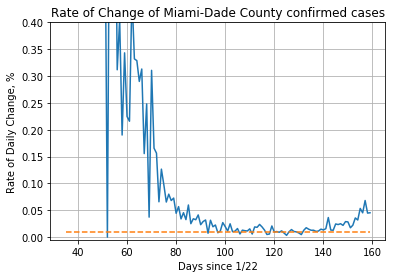

In [44]:
plt.plot(np.arange(35, len(miami_df)-1), miami_df.change[35:-1])
plt.title("Rate of Change of Miami-Dade County confirmed cases")
plt.xlabel("Days since 1/22")
plt.ylabel("Rate of Daily Change, %")

plt.grid()
# plt.ylim(-0.05, 1.05)

plt.plot(np.arange(35, len(miami_df)-1), [.01]*len(miami_df.change[35:-1]), linestyle='dashed')
plt.ylim(-0.005, .4)

(45, 134)

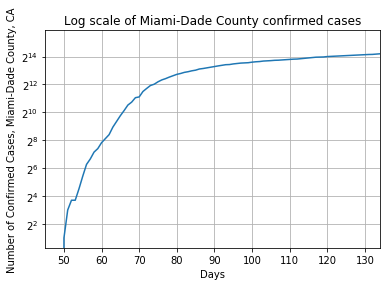

In [45]:
plt.plot(np.arange(0, len(la_df)), miami_df['Miami-Dade County'])
plt.title("Log scale of Miami-Dade County confirmed cases")
plt.xlabel("Days")
plt.ylabel("Number of Confirmed Cases, Miami-Dade County, CA")

plt.yscale('log', basey=2)
plt.grid()
plt.xlim(45, 134)

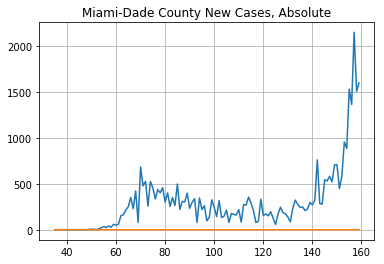

In [46]:
miami_new_cases = miami_df.values[1:] - miami_df.values[:-1]

# print(will)
plt.plot(np.arange(35, len(miami_new_cases)), miami_new_cases[35:])
plt.title("Miami-Dade County New Cases, Absolute")
plt.grid()

In [47]:
harris = df['Harris County'].iloc[:, 1]
harris_df = pd.DataFrame(harris)
harris_df['change'] = calculate_change(harris)
harris_df

,Harris County,change
1/22/20,0,1.000000
1/23/20,0,1.000000
1/24/20,0,1.000000
1/25/20,0,1.000000
1/26/20,0,1.000000
...,...,...
6/26/20,27017,0.045823
6/27/20,28255,0.032136
6/28/20,29163,0.003875
6/29/20,29276,0.049631


(-0.005, 0.6)

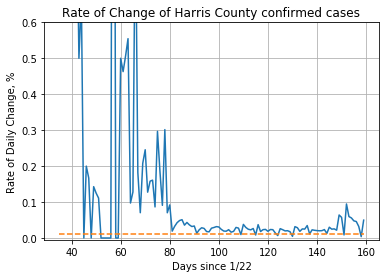

In [48]:
plt.plot(np.arange(35, len(harris_df)-1), harris_df.change[35:-1])
plt.title("Rate of Change of Harris County confirmed cases")
plt.xlabel("Days since 1/22")
plt.ylabel("Rate of Daily Change, %")

plt.grid()
# plt.ylim(-0.05, 1.05)

plt.plot(np.arange(35, len(harris_df)-1), [.01]*len(harris_df.change[35:-1]), linestyle='dashed')
plt.ylim(-0.005, .6)

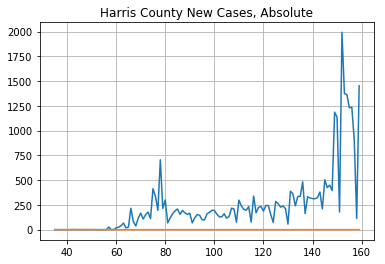

In [49]:
harris_new_cases = harris_df.values[1:] - harris_df.values[:-1]

# print(will)
plt.plot(np.arange(35, len(harris_new_cases)), harris_new_cases[35:])
plt.title("Harris County New Cases, Absolute")
plt.grid()

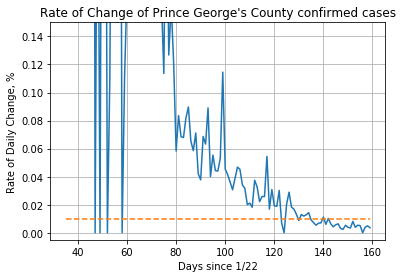

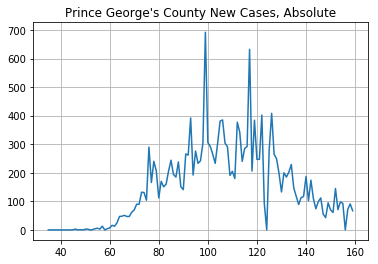

(        Prince George's County    change
 1/22/20                      0  1.000000
 1/23/20                      0  1.000000
 1/24/20                      0  1.000000
 1/25/20                      0  1.000000
 1/26/20                      0  1.000000
 ...                        ...       ...
 6/26/20                  18342  0.000000
 6/27/20                  18342  0.003925
 6/28/20                  18414  0.004942
 6/29/20                  18505  0.003621
 6/30/20                  18572  0.000000
 
 [161 rows x 2 columns],
 array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 3, 0, 1, 0, 2, 3, 0, 1, 4, 6, 3, 13, 0, 4, 7, 16, 13, 25, 47,
        48, 51, 47, 47, 62, 70, 90, 90, 132, 131, 104, 290, 166, 240, 207,
        112, 170, 151, 160, 206, 244, 194, 185, 238, 151, 141, 266, 262,
        392, 192, 276, 233, 242, 305, 692, 306, 292, 265, 233, 304, 381,
        385, 304, 291, 1

In [50]:
create_roc_and_new_case_numbers(df['Prince George\'s County'], 'Prince George\'s')

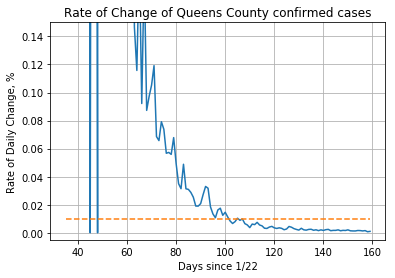

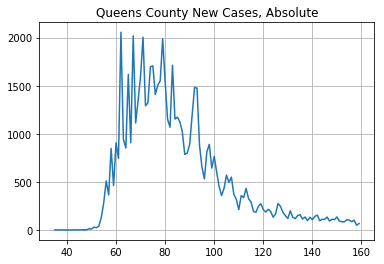

(        Queens County    change
 1/22/20             0  1.000000
 1/23/20             0  1.000000
 1/24/20             0  1.000000
 1/25/20             0  1.000000
 1/26/20             0  1.000000
 ...               ...       ...
 6/26/20         65089  0.001321
 6/27/20         65175  0.001550
 6/28/20         65276  0.000751
 6/29/20         65325  0.001010
 6/30/20         65391  0.000000
 
 [161 rows x 2 columns],
 array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        1, 0, 1, 2, 0, 13, 9, 29, 23, 40, 130, 285, 509, 364, 848, 461,
        906, 743, 2056, 942, 852, 1617, 906, 2019, 1113, 1348, 1602, 2004,
        1291, 1322, 1697, 1707, 1408, 1504, 1551, 1988, 1544, 1150, 1068,
        1712, 1153, 1173, 1125, 1021, 786, 799, 891, 1191, 1483, 1474, 884,
        654, 530, 812, 890, 643, 765, 601, 450, 358, 432, 570, 494, 549,
        369, 318, 211, 357, 336, 432, 325, 291, 192, 184, 2

In [51]:
create_roc_and_new_case_numbers(df['Queens County'], 'Queens')

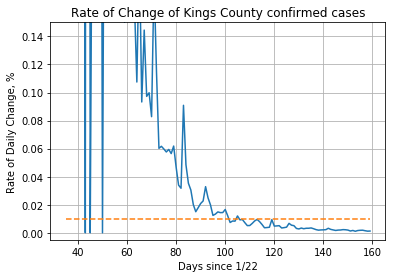

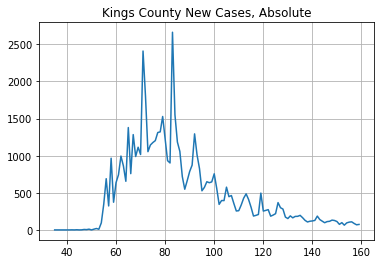

(        Kings County    change
 1/22/20            0  1.000000
 1/23/20            0  1.000000
 1/24/20            0  1.000000
 1/25/20            0  1.000000
 1/26/20            0  1.000000
 ...              ...       ...
 6/26/20        59311  0.001838
 6/27/20        59420  0.001464
 6/28/20        59507  0.001160
 6/29/20        59576  0.001242
 6/30/20        59650  0.000000
 
 [161 rows x 2 columns],
 array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
        2, 0, 1, 6, 4, 10, 0, 10, 19, 9, 95, 348, 690, 323, 966, 373, 637,
        743, 995, 863, 655, 1379, 758, 1284, 989, 1114, 1016, 2410, 1804,
        1054, 1144, 1177, 1203, 1312, 1321, 1528, 1228, 933, 902, 2663,
        1552, 1184, 1058, 719, 548, 664, 787, 873, 1294, 1012, 827, 527,
        573, 649, 636, 647, 756, 564, 344, 396, 395, 576, 448, 463, 356,
        255, 259, 336, 428, 486, 410, 307, 187, 196, 208, 496, 254, 263,
 

In [52]:
create_roc_and_new_case_numbers(df['Kings County'].iloc[:, 1], 'Kings')

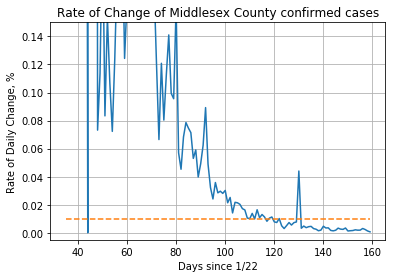

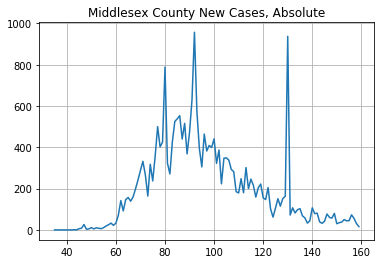

(        Middlesex County    change
 1/22/20                0  1.000000
 1/23/20                0  1.000000
 1/24/20                0  1.000000
 1/25/20                0  1.000000
 1/26/20                0  1.000000
 ...                  ...       ...
 6/26/20            23786  0.003069
 6/27/20            23859  0.002347
 6/28/20            23915  0.001296
 6/29/20            23946  0.000668
 6/30/20            23962  0.000000
 
 [161 rows x 2 columns],
 array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
        0, 6, 8, 26, 3, 5, 11, 5, 10, 8, 6, 11, 19, 25, 33, 22, 33, 72,
        142, 92, 147, 157, 139, 160, 199, 242, 288, 332, 266, 164, 318,
        237, 358, 500, 402, 425, 788, 323, 271, 427, 525, 538, 553, 440,
        516, 368, 473, 630, 957, 572, 395, 305, 464, 382, 409, 399, 441,
        322, 387, 223, 347, 349, 338, 293, 282, 185, 179, 248, 180, 302,
        200, 246, 216, 159, 20

In [53]:
create_roc_and_new_case_numbers(df['Middlesex County'].iloc[:, 1], 'Middlesex')

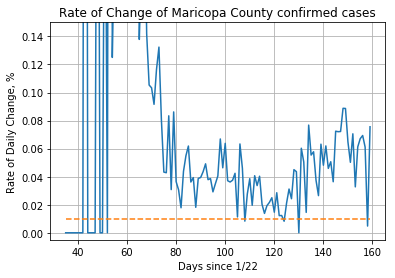

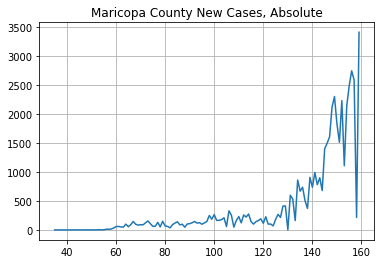

(        Maricopa County    change
 1/22/20               0  1.000000
 1/23/20               0  1.000000
 1/24/20               0  1.000000
 1/25/20               0  1.000000
 1/26/20               1  0.000000
 ...                 ...       ...
 6/26/20           39626  0.069348
 6/27/20           42374  0.061075
 6/28/20           44962  0.004804
 6/29/20           45178  0.075568
 6/30/20           48592  0.000000
 
 [161 rows x 2 columns],
 array([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
        0, 0, 0, 0, 1, 0, 0, 1, 0, 4, 1, 2, 11, 12, 15, 32, 58, 60, 52, 48,
        100, 55, 91, 145, 98, 83, 90, 88, 122, 155, 107, 62, 64, 130, 52,
        150, 69, 60, 36, 90, 118, 140, 87, 98, 47, 102, 108, 124, 146, 118,
        125, 98, 121, 145, 249, 184, 265, 164, 166, 178, 209, 58, 329, 254,
        48, 161, 231, 122, 258, 222, 275, 144, 100, 142, 162, 191, 115,
        227, 100, 102, 69, 179,

In [54]:
create_roc_and_new_case_numbers(df['Maricopa County'], 'Maricopa')

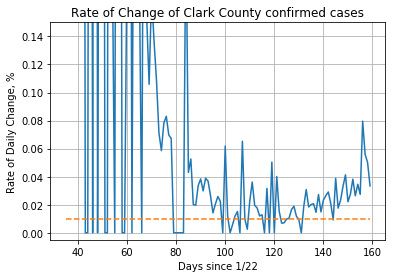

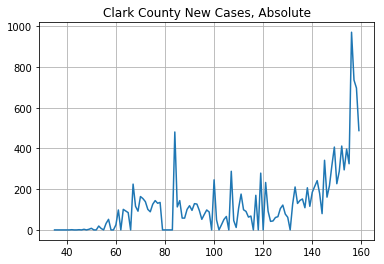

(        Clark County    change
 1/22/20            0  1.000000
 1/23/20            0  1.000000
 1/24/20            0  1.000000
 1/25/20            0  1.000000
 1/26/20            0  1.000000
 ...              ...       ...
 6/26/20        12203  0.079571
 6/27/20        13174  0.055868
 6/28/20        13910  0.050108
 6/29/20        14607  0.033409
 6/30/20        15095  0.000000
 
 [161 rows x 2 columns],
 array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
        0, 1, 0, 3, 0, 3, 8, 0, 0, 19, 7, 0, 32, 52, 0, 0, 25, 98, 0, 101,
        93, 85, 0, 225, 116, 92, 164, 154, 139, 101, 89, 126, 144, 131,
        135, 0, 0, 0, 0, 0, 481, 113, 144, 58, 58, 101, 119, 96, 129, 127,
        95, 52, 76, 98, 88, 0, 246, 49, 0, 25, 51, 66, 0, 288, 46, 12, 107,
        176, 99, 91, 63, 68, 0, 170, 0, 279, 0, 233, 92, 42, 44, 61, 65,
        105, 122, 78, 62, 0, 126, 211, 130, 145, 152, 109, 207, 116, 1

In [55]:
create_roc_and_new_case_numbers(df['Clark County'].iloc[:, 7], 'Clark')
# create_roc_and_new_case_numbers(df['Riverside County'], 'Riverside')

# Plot Alachua County

In [56]:
alachua = df['Alachua County'].iloc[:]
alachua

1/22/20       0
1/23/20       0
1/24/20       0
1/25/20       0
1/26/20       0
           ... 
6/26/20     945
6/27/20    1033
6/28/20    1124
6/29/20    1159
6/30/20    1197
Name: Alachua County, Length: 161, dtype: object

In [57]:
alachua_df = pd.DataFrame(alachua)
alachua_df['change'] = calculate_change(alachua)
alachua_df

,Alachua County,change
1/22/20,0,1.000000
1/23/20,0,1.000000
1/24/20,0,1.000000
1/25/20,0,1.000000
1/26/20,0,1.000000
...,...,...
6/26/20,945,0.093122
6/27/20,1033,0.088093
6/28/20,1124,0.031139
6/29/20,1159,0.032787


(-0.005, 0.3)

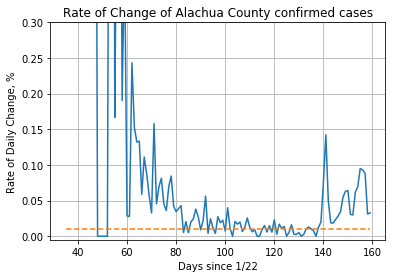

In [58]:
plt.plot(np.arange(35, len(alachua_df)-1), alachua_df.change[35:-1])
plt.title("Rate of Change of Alachua County confirmed cases")
plt.xlabel("Days since 1/22")
plt.ylabel("Rate of Daily Change, %")

plt.grid()
# plt.ylim(-0.05, 1.05)

plt.plot(np.arange(35, len(alachua_df)-1), [.01]*len(alachua_df.change[35:-1]), linestyle='dashed')
plt.ylim(-0.005, .3)

(45, 134)

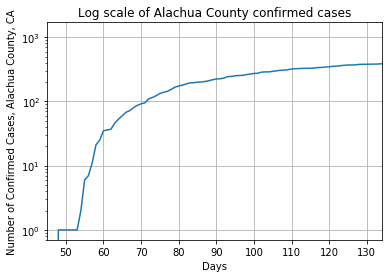

In [59]:
plt.plot(np.arange(0, len(alachua_df)), alachua_df['Alachua County'])
plt.title("Log scale of Alachua County confirmed cases")
plt.xlabel("Days")
plt.ylabel("Number of Confirmed Cases, Alachua County, CA")

plt.yscale('log')
plt.grid()
plt.xlim(45, 134)

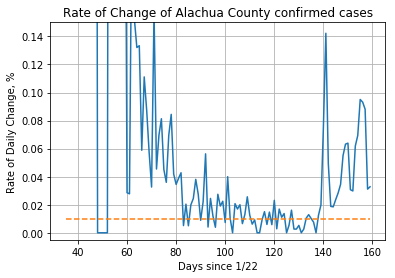

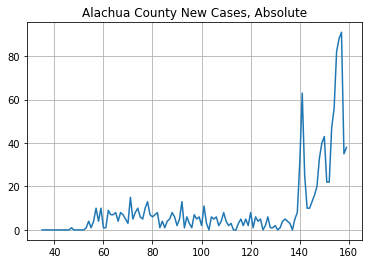

(        Alachua County    change
 1/22/20              0  1.000000
 1/23/20              0  1.000000
 1/24/20              0  1.000000
 1/25/20              0  1.000000
 1/26/20              0  1.000000
 ...                ...       ...
 6/26/20            945  0.093122
 6/27/20           1033  0.088093
 6/28/20           1124  0.031139
 6/29/20           1159  0.032787
 6/30/20           1197  0.000000
 
 [161 rows x 2 columns],
 array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 4, 1, 4, 10, 4, 10, 1, 1, 9, 7, 7, 8,
        4, 8, 7, 5, 3, 15, 5, 8, 10, 6, 5, 10, 13, 7, 6, 7, 8, 1, 4, 1, 4,
        5, 8, 6, 2, 5, 13, 1, 6, 3, 1, 7, 5, 6, 2, 11, 3, 0, 6, 5, 6, 2, 4,
        8, 4, 2, 3, 0, 0, 3, 5, 2, 5, 2, 8, 1, 6, 4, 5, 0, 2, 6, 1, 1, 2,
        0, 1, 4, 5, 4, 3, 0, 5, 8, 31, 63, 25, 10, 10, 13, 16, 20, 33, 40,
        43, 22, 22, 47, 56, 82, 88, 91, 3

In [60]:
create_roc_and_new_case_numbers(df['Alachua County'], 'Alachua')

# Classify States

In [61]:
# filepath = "C:\\Users\\Thalo\\Downloads\\covid_confirmed_usafacts.csv"
df2 = pd.read_csv(filepath)
df2.head()
df2 = df2.set_index("County Name").T
df2.drop(["countyFIPS", "stateFIPS"], inplace=True)

In [62]:
state_col = df2.iloc[0]
df2.drop("State", inplace=True)
# df2['State'] = state_col


In [63]:
df['Lake County'].iloc[:, 4]

1/22/20       0
1/23/20       0
1/24/20       0
1/25/20       0
1/26/20       0
           ... 
6/26/20    4650
6/27/20    4696
6/28/20    4741
6/29/20    4781
6/30/20    4847
Name: Lake County, Length: 161, dtype: object

In [64]:
state_col[state_col.index == 'Middlesex County']

County Name
Middlesex County    CT
Middlesex County    MA
Middlesex County    NJ
Middlesex County    VA
Name: State, dtype: object

In [65]:
southern = ["Los Angeles", "San Bernardino", "Riverside", "San Diego", "Orange", "Maricopa", 
        "Dallas", "Harris", "Miami-Dade", "Clark", "Broward", "Palm Beach"]
south2 = [df['Los Angeles County'], df['San Bernardino County'], df['Riverside County'],
         df['San Diego County'], df['Los Angeles County'], df['Maricopa County'], 
         df['Dallas County'].iloc[:,4], df['Harris County'].iloc[:,1], df['Miami-Dade County'],
         df['Clark County'].iloc[:,7], df['Broward County'], df['Palm Beach County']]

northern = ["King", "Yakima", "Cook", "Wayne", "Prince George's", "Fairfax", "Montgomery", 
        "Middlesex", "Union", "Essex", "Hudson", "Passaic", "Bergen", "Kings", "Queens",
        "Nassau", "Suffolk", "Westchester", "Fairfield", "Middlesex"]

north2 = [df['King County'].iloc[:,1], df['Yakima County'], df['Cook County'].iloc[:,1],
         df['Riverside County'], df['Wayne County'].iloc[:,5], df['Prince George\'s County'],
         df['Fairfax County'], df['Montgomery County'].iloc[:,8], df['Riverside County'],
         df['Middlesex County'].iloc[:,2], df['Union County'].iloc[:,8], 
         df['Essex County'].iloc[:,1], df['Hudson County'], df['Passaic County'],
         df['Bergen County'], df['Kings County'].iloc[:,1], df['Queens County'],
         df['Nassau County'].iloc[:,1], df['Suffolk County'].iloc[:,1], 
         df['Westchester County'], df['Fairfield County'].iloc[:,0],
         df['Middlesex County'].iloc[:,1] ]

c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in longlong_scalars
  import sys
c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in longlong_scalars
  import sys


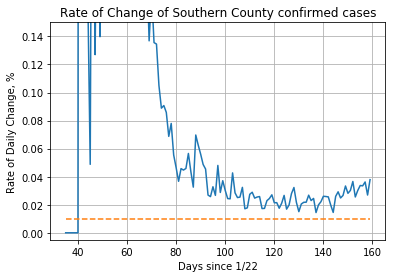

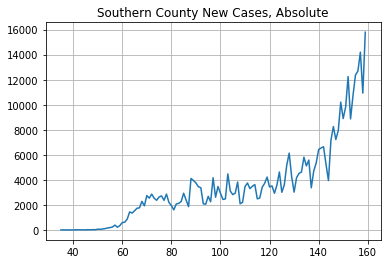

(         South_Agg    change
 1/22/20          0       NaN
 1/23/20          0       NaN
 1/24/20          0       NaN
 1/25/20          0       inf
 1/26/20          3  0.000000
 ...            ...       ...
 6/26/20     379196  0.033463
 6/27/20     391885  0.036233
 6/28/20     406084  0.026908
 6/29/20     417011  0.037862
 6/30/20     432800  0.000000
 
 [161 rows x 2 columns],
 array([    0,     0,     0,     3,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     1,     0,     1,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,    12,    12,     6,     6,
            2,    20,     8,    22,    13,    58,    50,    73,   105,
          155,   185,   232,   385,   215,   343,   588,   614,   857,
         1439,  1344,  1527,  1732,  1764,  2282,  1923,  2744,  2538,
         2860,  2532,  2368,  2632,  2716,  2

In [66]:
new_col = [x[1].sum() for x in pd.concat(south2, axis=1).iterrows()]
df['South_Agg'] = new_col

create_roc_and_new_case_numbers(df['South_Agg'], 'Southern')

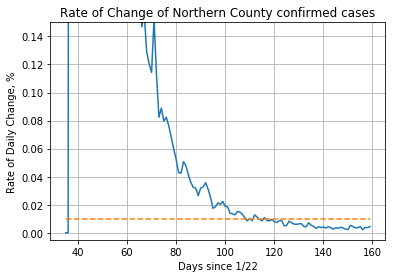

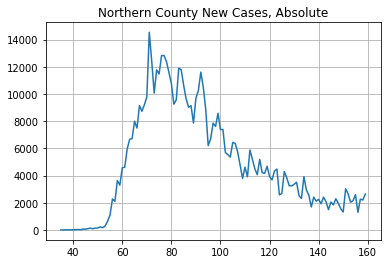

(         North_Agg    change
 1/22/20          1  0.000000
 1/23/20          1  1.000000
 1/24/20          2  0.000000
 1/25/20          2  0.000000
 1/26/20          2  0.000000
 ...            ...       ...
 6/26/20     594720  0.002176
 6/27/20     596014  0.003802
 6/28/20     598280  0.003676
 6/29/20     600479  0.004388
 6/30/20     603114  0.000000
 
 [161 rows x 2 columns],
 array([    0,     1,     0,     0,     0,     0,     0,     0,     1,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     5,     4,     6,     8,    19,    33,    12,    60,
           53,    97,   130,    86,   134,   143,   224,   165,   283,
          632,  1091,  2275,  2105,  3629,  3292,  4566,  4612,  5948,
         6661,  6722,  7990,  7490,  9140,  8727,  9200,  9779, 14538,
        12387, 10067, 11767, 11472, 12818, 12

In [67]:
new_col = [x[1].sum() for x in pd.concat(north2, axis=1).iterrows()]
df['North_Agg'] = new_col

create_roc_and_new_case_numbers(df['North_Agg'], 'Northern')

In [68]:
df2
pd.DataFrame(state_col[1:]).groupby("State").groups.keys()

southwest = ["AZ", "NM", "TX", "OK"]
west = ["WA", "OR", "CA", "ID", "UT", "MT", "WY", "CO", "NV"]
midwest = ["MN", "WI", "IL", "MI", "ND", "SD", "NE", "KS", "MO", "IA", "IN", "OH"]
southeast = ["FL", "LA", "AR", "MS", "GA", "AL", "TN", "KY", "SC", "NC", "VA", "WV"]
northeast = ["MD", "CT", "DC", "DE", "MA", "ME", "NH", "NJ", "NY", "PA", "RI", "VT"]

def aggregate_region(state_list):
    counties_data = []
    for state in state_list:
        for county in state_col[state_col == state].index:
            if type(df[county]) != pd.core.series.Series:
                x = df[county].iloc[:, np.where(state_col[county] == state)[0][0]]
            else:
                x = df[county]
            counties_data.append(x)
    y = pd.concat(counties_data, axis=1)
    return y

def single_state(state):
    counties_data = []
    for county in state_col[state_col == state].index:
        if type(df[county]) != pd.core.series.Series:
            x = df[county].iloc[:, np.where(state_col[county] == state)[0][0]]
        else:
            x = df[county]
        counties_data.append(x)
    y = pd.concat(counties_data, axis=1)
    return y

## Classifying states based on having more cases since the midpoint (day 106 - 151) or before the midpoint (day 61 - 106)

c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in longlong_scalars
  import sys
c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in longlong_scalars
  import sys


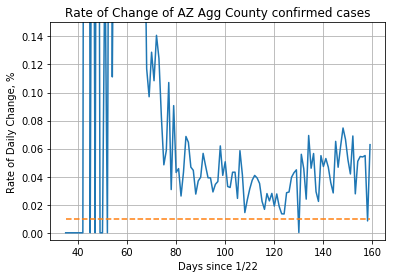

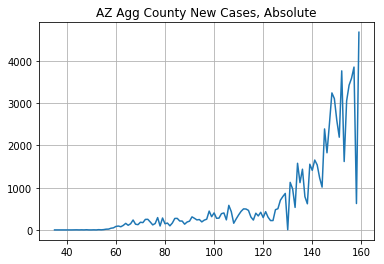

65278
13703
AZ is a fuckup


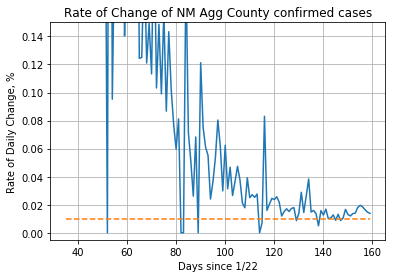

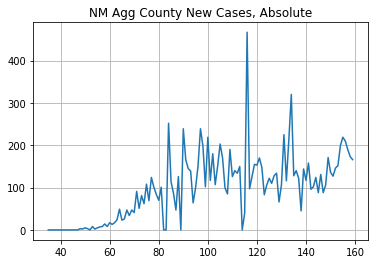

6524
5541
NM is a fuckup


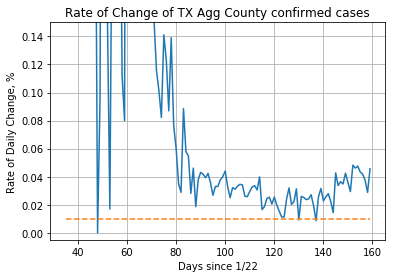

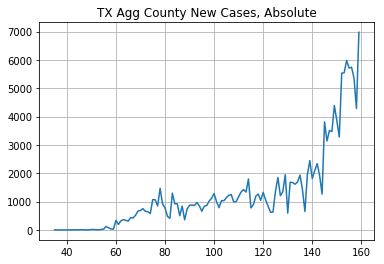

112299
46985
TX is a fuckup


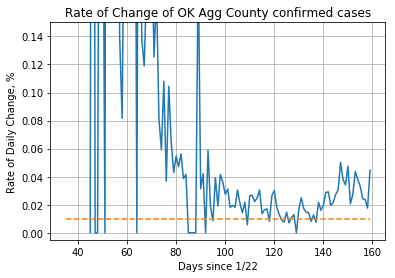

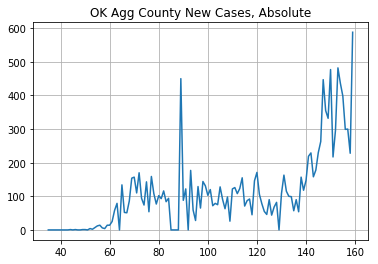

8450
5227
OK is a fuckup


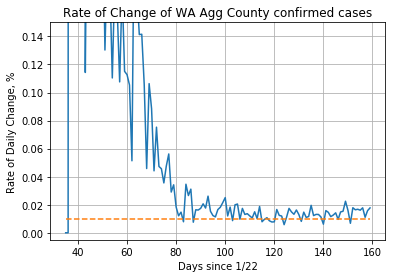

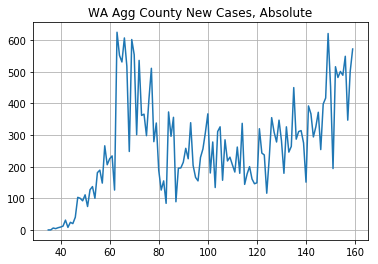

14393
16210
WA is a do-gooder


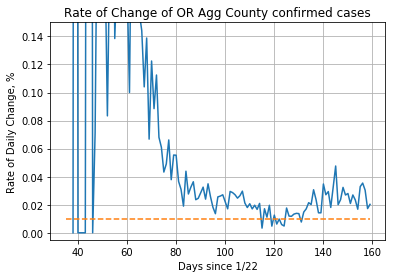

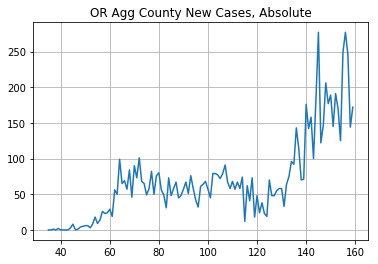

5038
3428
OR is a fuckup


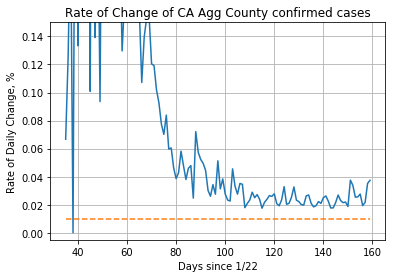

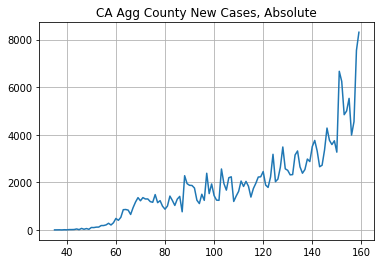

150185
77588
CA is a fuckup


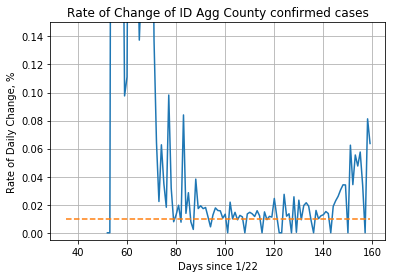

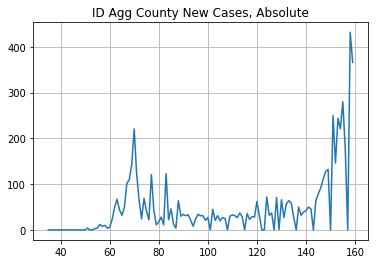

3699
2367
ID is a fuckup


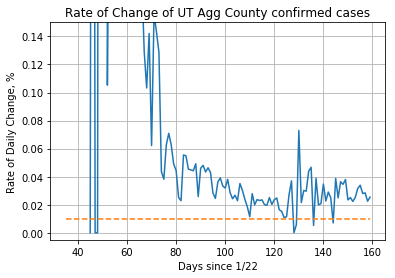

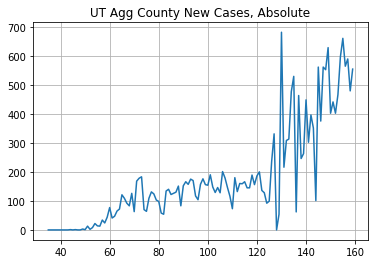

15082
6982
UT is a fuckup


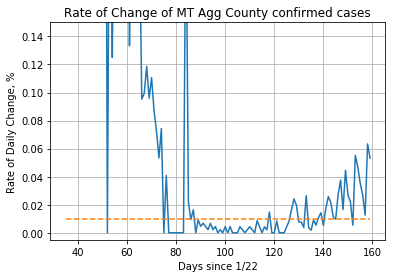

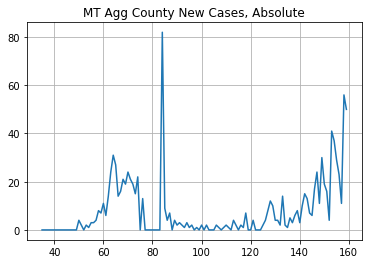

521
424
MT is a fuckup


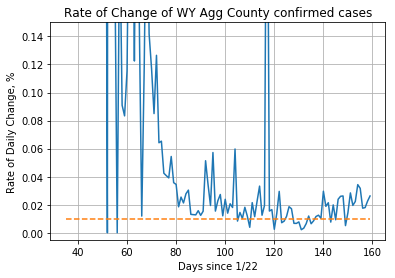

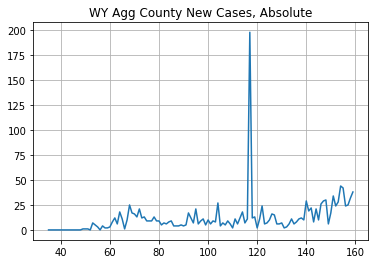

921
537
WY is a fuckup


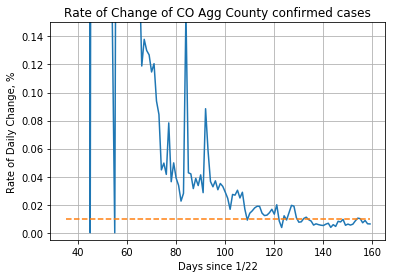

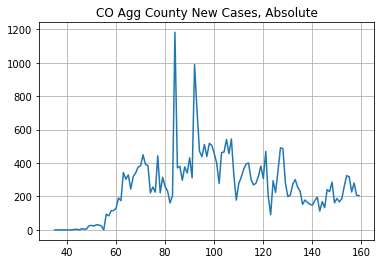

10788
21207
CO is a do-gooder


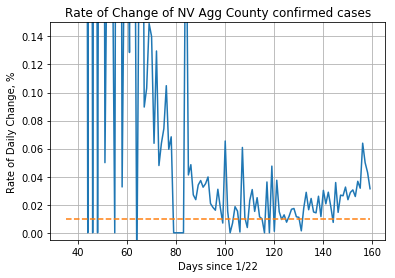

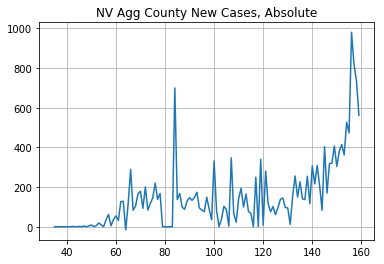

11553
6654
NV is a fuckup


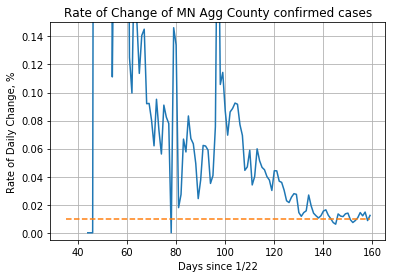

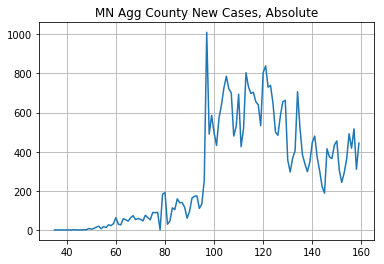

20637
15434
MN is a fuckup


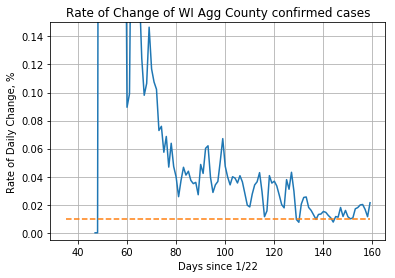

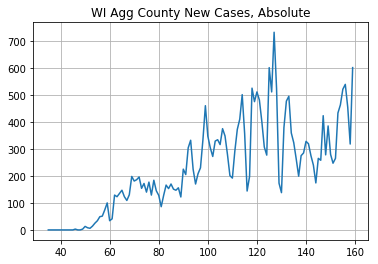

16118
12127
WI is a fuckup


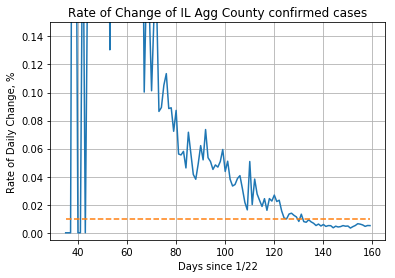

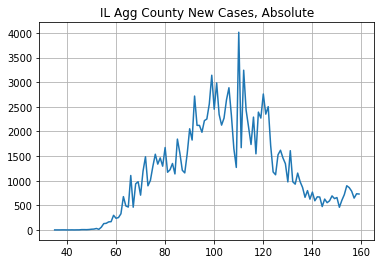

49003
92897
IL is a do-gooder


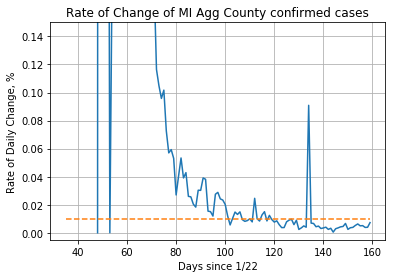

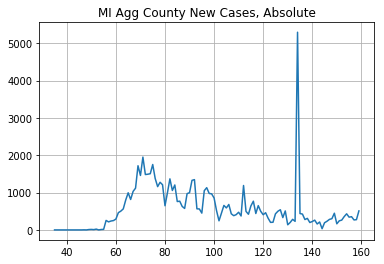

19590
49811
MI is a do-gooder


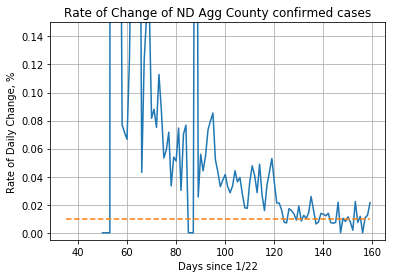

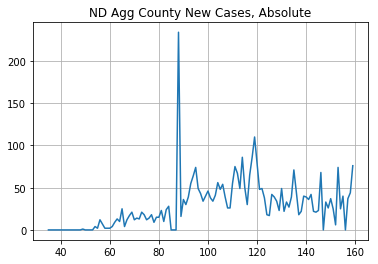

1718
1865
ND is neutral


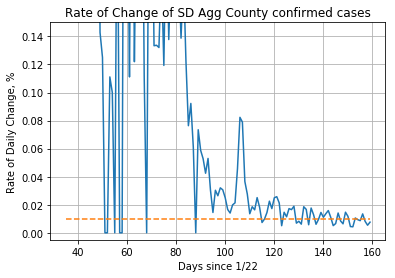

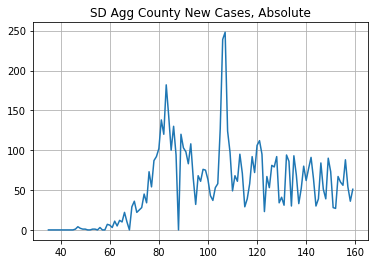

2779
3958
SD is a do-gooder


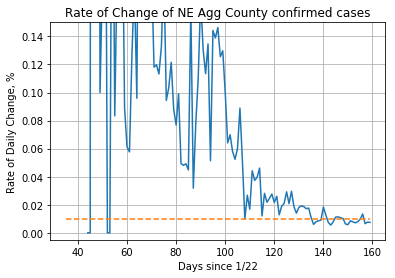

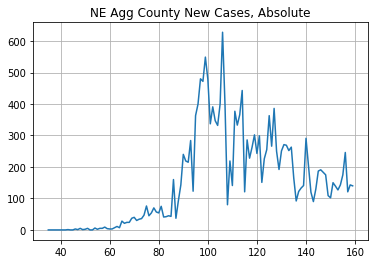

8834
10119
NE is a do-gooder


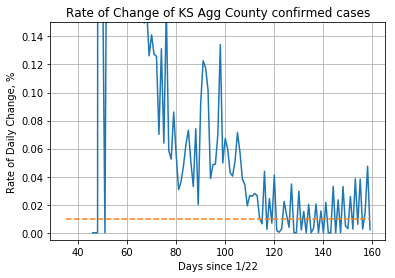

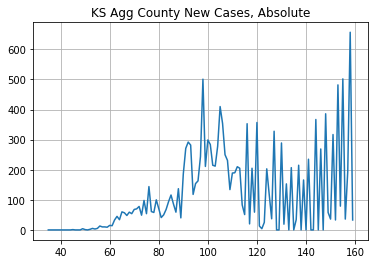

6489
7963
KS is a do-gooder


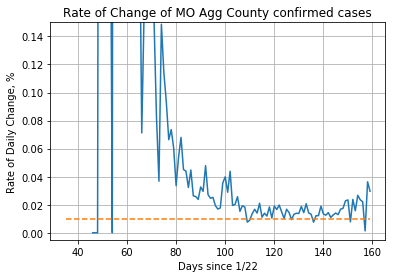

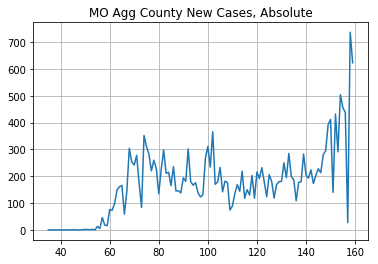

10910
10556
MO is neutral


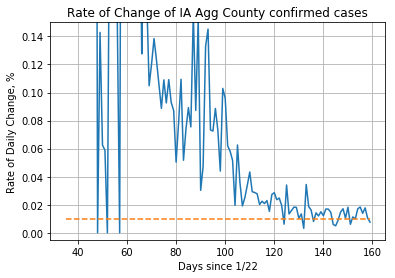

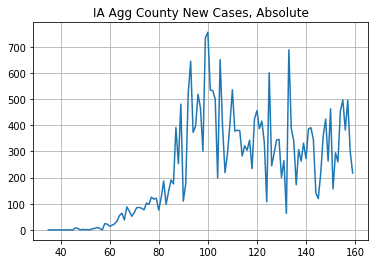

14301
14539
IA is neutral


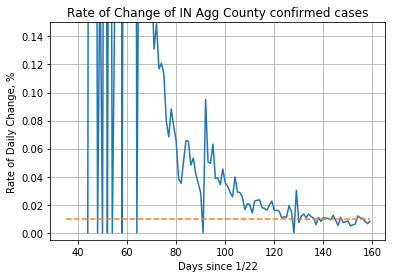

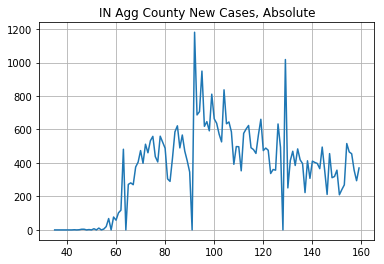

17829
27507
IN is a do-gooder


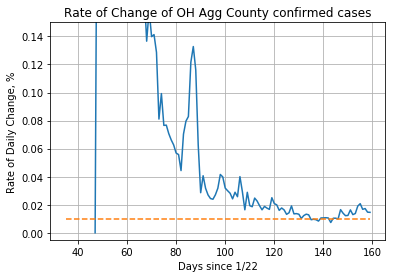

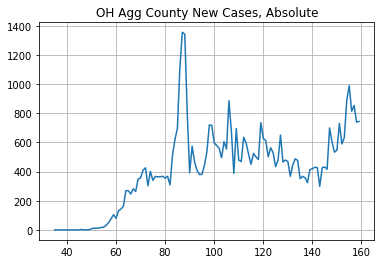

23869
27490
OH is a do-gooder


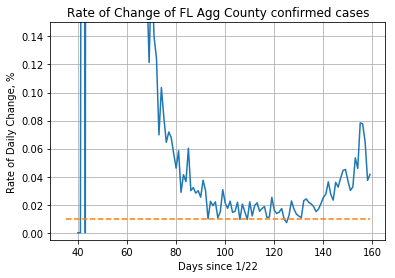

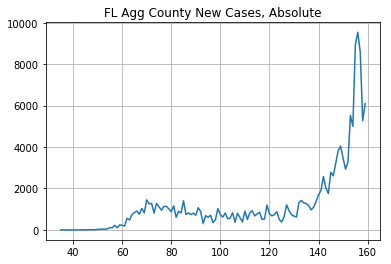

106849
44358
FL is a fuckup


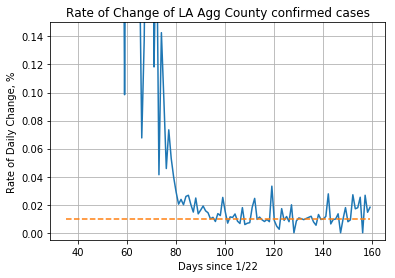

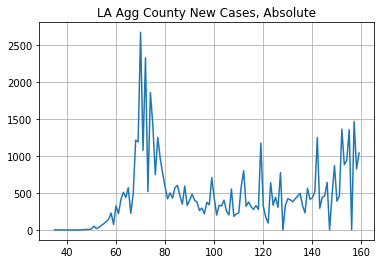

23663
33269
LA is a do-gooder


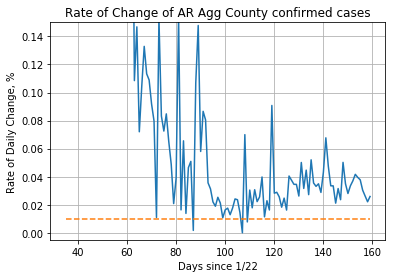

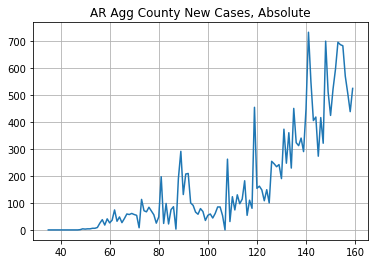

16019
4573
AR is a fuckup


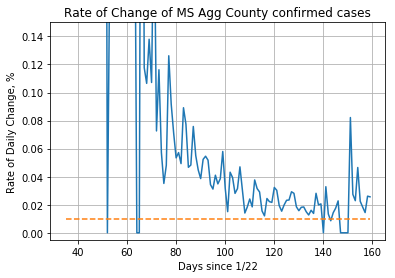

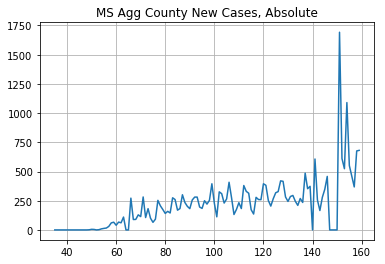

15961
11040
MS is a fuckup


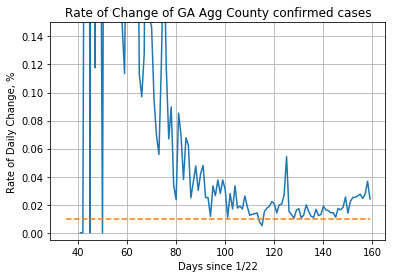

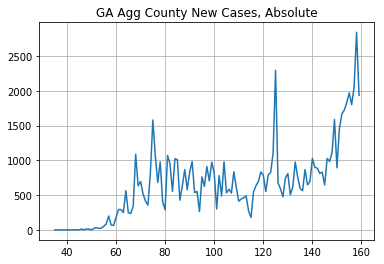

46565
34731
GA is a fuckup


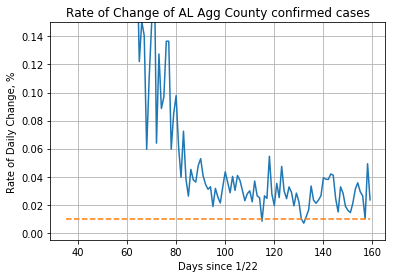

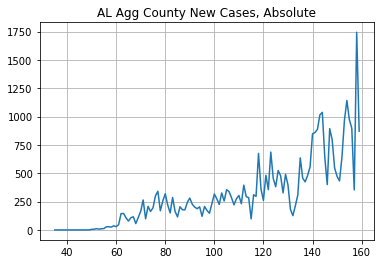

26277
11572
AL is a fuckup


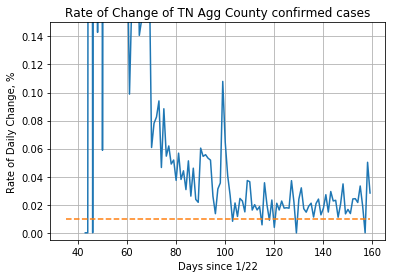

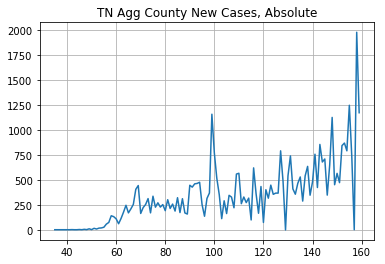

25174
16776
TN is a fuckup


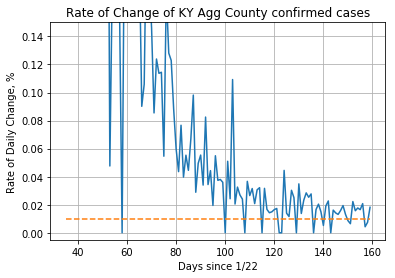

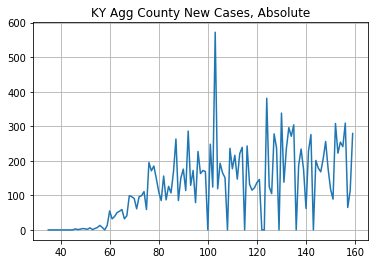

7952
7551
KY is neutral


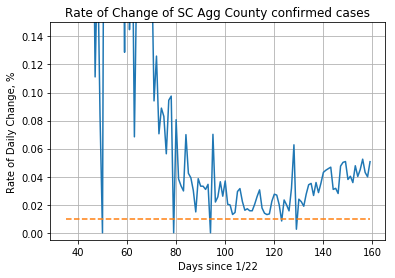

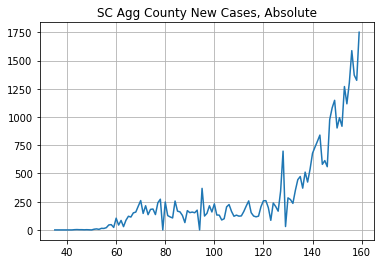

27486
8514
SC is a fuckup


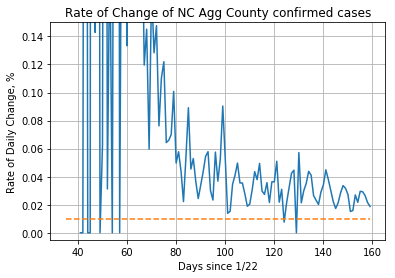

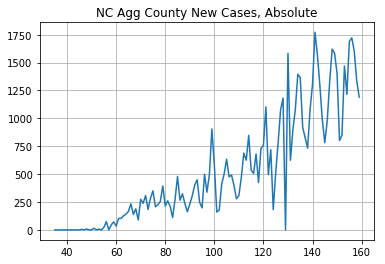

46158
18223
NC is a fuckup


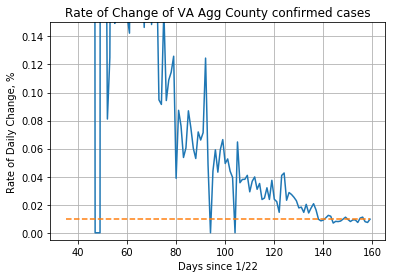

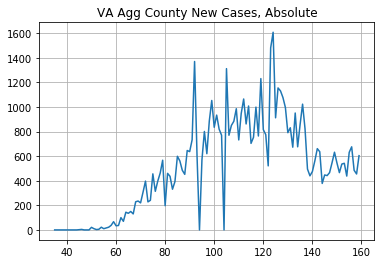

32403
30131
VA is neutral


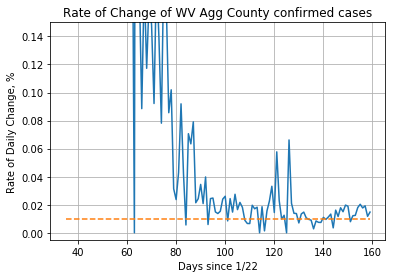

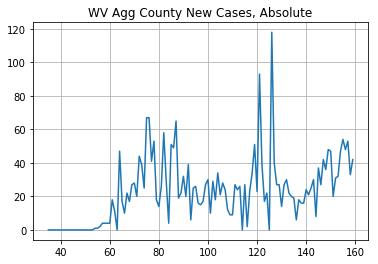

1409
1459
WV is neutral


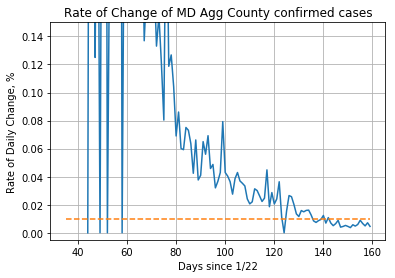

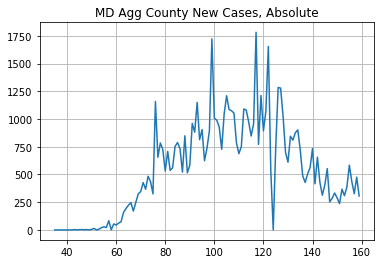

28755
38516
MD is a do-gooder


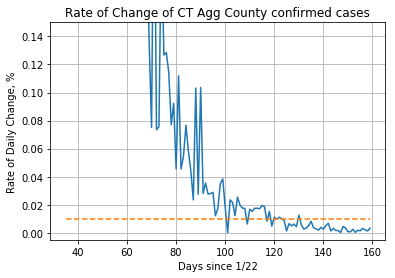

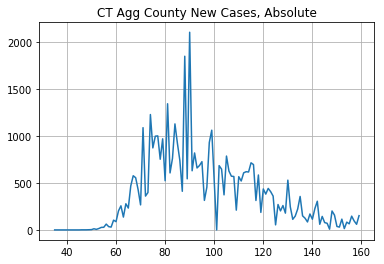

9095
37004
CT is a do-gooder


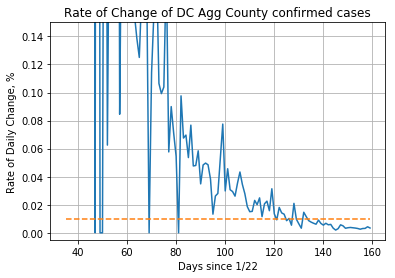

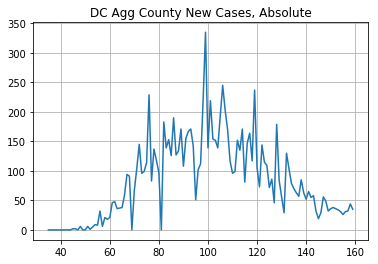

3204
6986
DC is a do-gooder


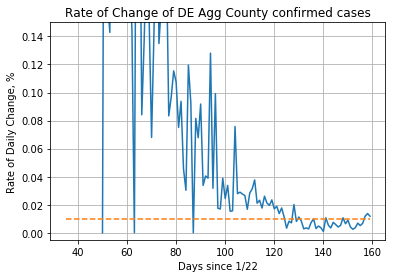

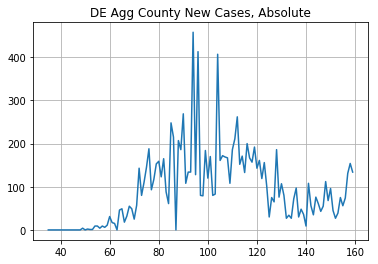

3840
7583
DE is a do-gooder


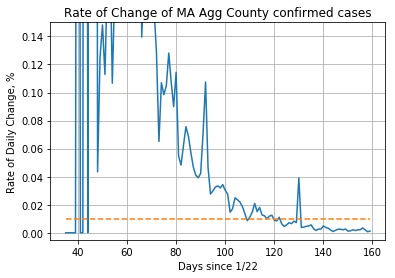

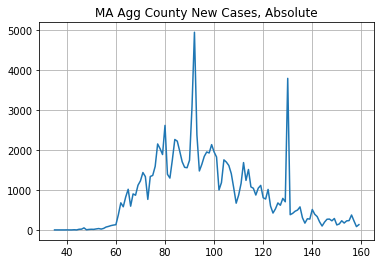

22872
85234
MA is a do-gooder


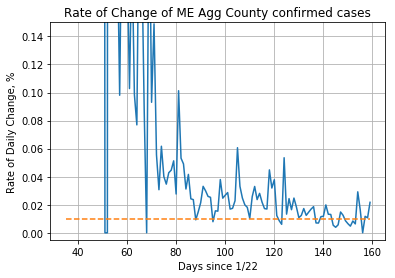

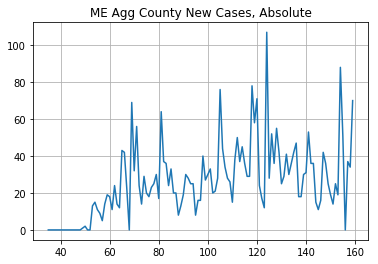

1612
1575
ME is neutral


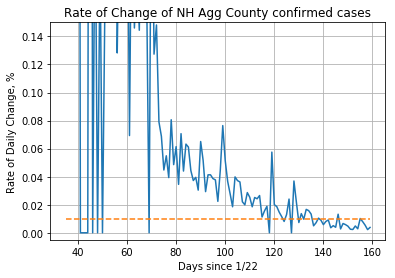

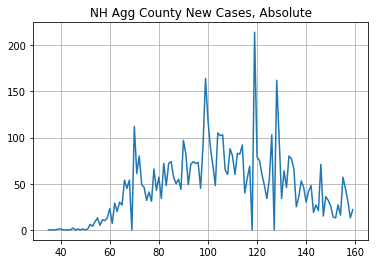

2186
3495
NH is a do-gooder


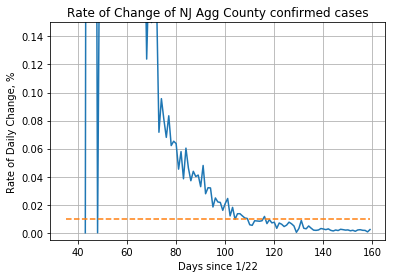

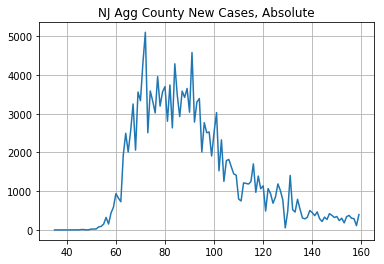

25333
143483
NJ is a do-gooder


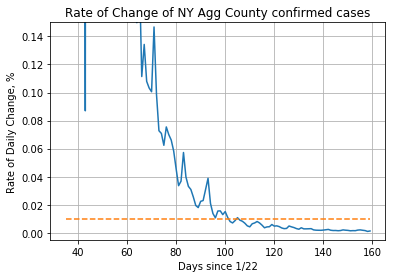

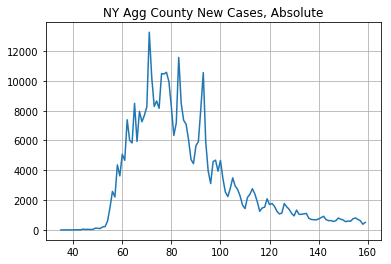

43306
329281
NY is a do-gooder


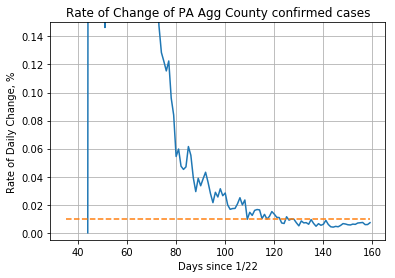

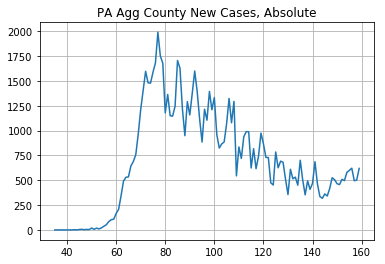

24373
61589
PA is a do-gooder


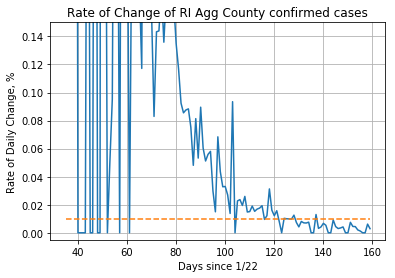

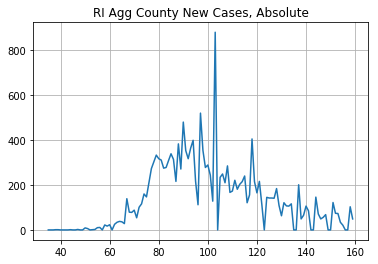

4139
12568
RI is a do-gooder


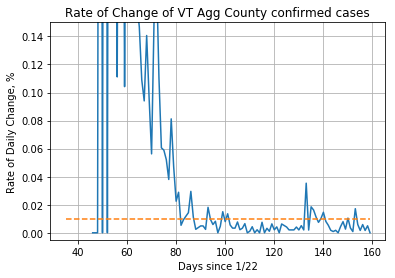

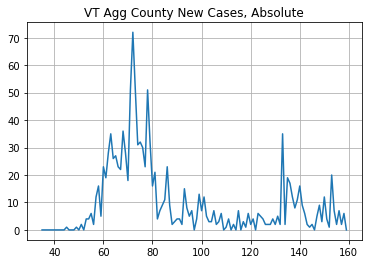

268
864
VT is a do-gooder


In [69]:


state_list = [state for states in [southwest, west,midwest ,southeast ,northeast ] for state in states]

good_states = []
bad_states = []
neutral_states = []
kinda_good_states = []
kinda_bad_states = []

neg_diffs = []
pos_diffs = []
neg_ratios = []
pos_ratios = []
neutral_diffs = []
neutral_ratios = []

for state in state_list:
    y = single_state(state)
    new_col = [x[1].sum() for x in y.iterrows()]
    df['{}_agg'.format(state)] = new_col
    x = create_roc_and_new_case_numbers(df['{}_agg'.format(state)], '{} Agg'.format(state))
    print(x[1][midpoint:].sum())
    print(x[1][61:midpoint].sum())
    if abs(x[1][midpoint:].sum() - x[1][61:midpoint].sum()) < x[1][61:].sum() * .05:
        print("{} is neutral".format(state))
        neutral_states.append(state)
        neutral_diffs.append(abs(x[1][61:midpoint].sum() - x[1][midpoint:].sum()))
        if x[1][61:midpoint].sum() > x[1][midpoint:].sum():
            neutral_ratios.append(x[1][61:midpoint].sum() / x[1][midpoint:].sum())
        else:
            neutral_ratios.append(x[1][midpoint:].sum() / x[1][61:midpoint].sum())
    elif x[1][midpoint:].sum() > x[1][61:midpoint].sum():
#         if np.percentile(np.array(all_ratios), 50) < x[1][midpoint:].sum() / x[1][61:midpoint].sum():
        if True:
            print("{} is a fuckup".format(state))
            bad_states.append(state)
            neg_diffs.append(x[1][midpoint:].sum() - x[1][61:midpoint].sum())
            neg_ratios.append(x[1][midpoint:].sum() / x[1][61:midpoint].sum())
        else:
            print("{} is kinda bad".format(state))
            kinda_bad_states.append(state)
            neg_diffs.append(x[1][midpoint:].sum() - x[1][61:midpoint].sum())
            neg_ratios.append(x[1][midpoint:].sum() / x[1][61:midpoint].sum())
    else:
#         if np.percentile(np.array(all_ratios), 50) < x[1][61:midpoint].sum() / x[1][midpoint:].sum():
        if True:
            print("{} is a do-gooder".format(state))
            good_states.append(state)
            pos_diffs.append(x[1][61:midpoint].sum() - x[1][midpoint:].sum())
            pos_ratios.append(x[1][61:midpoint].sum() / x[1][midpoint:].sum())
        else:
            print("{} is kinda good".format(state))
            kinda_good_states.append(state)
            pos_diffs.append(x[1][61:midpoint].sum() - x[1][midpoint:].sum())
            pos_ratios.append(x[1][61:midpoint].sum() / x[1][midpoint:].sum())
all_ratios = pos_ratios.copy()
all_ratios.extend(neg_ratios)    
all_ratios.extend(neutral_ratios)

c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in longlong_scalars
  import sys
c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in longlong_scalars
  import sys


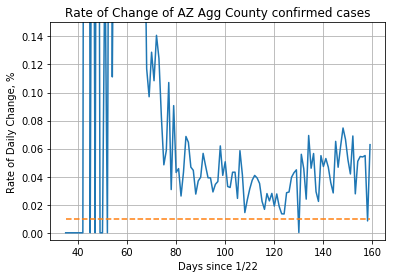

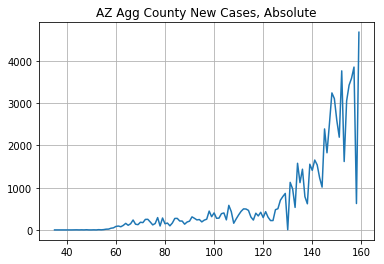

65278
13703
AZ is a fuckup


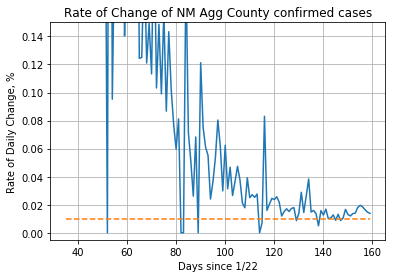

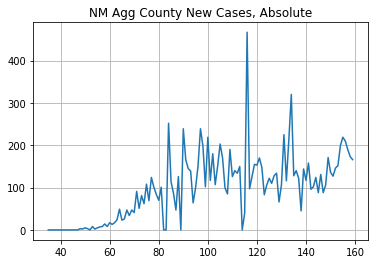

6524
5541
NM is kinda bad


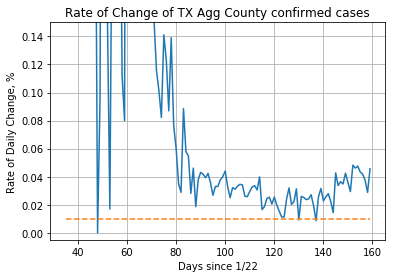

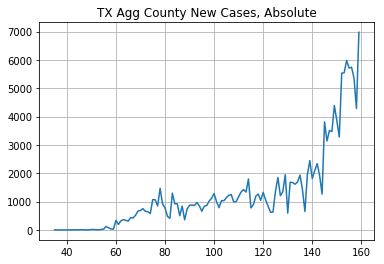

112299
46985
TX is a fuckup


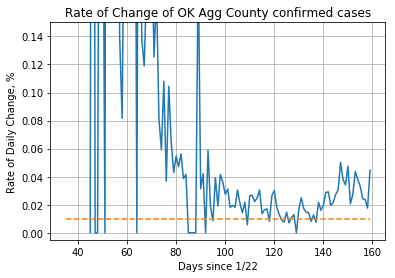

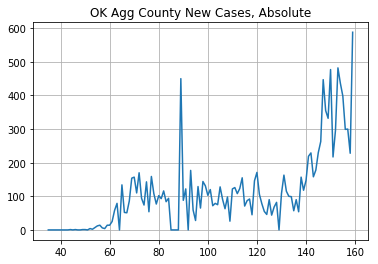

8450
5227
OK is a fuckup


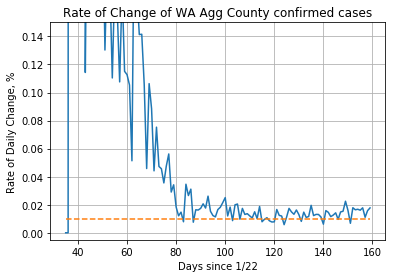

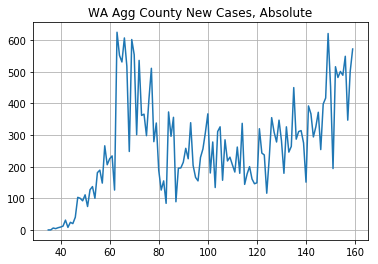

14393
16210
WA is kinda good


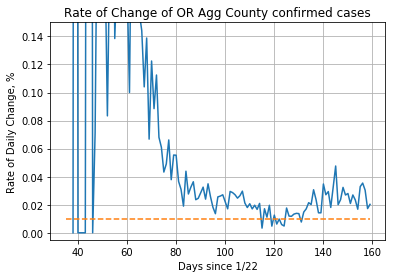

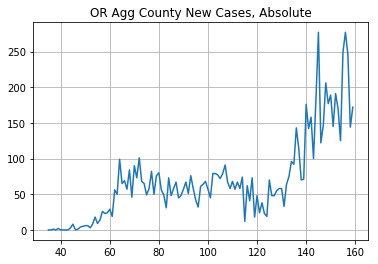

5038
3428
OR is kinda bad


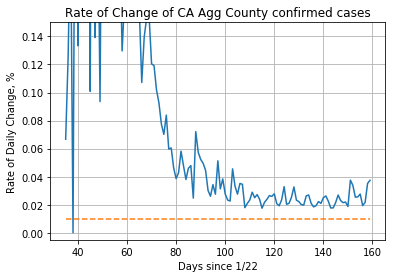

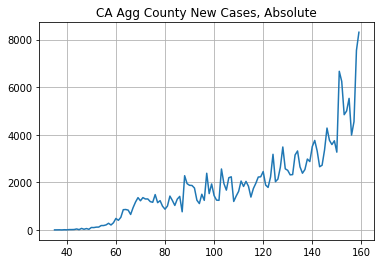

150185
77588
CA is a fuckup


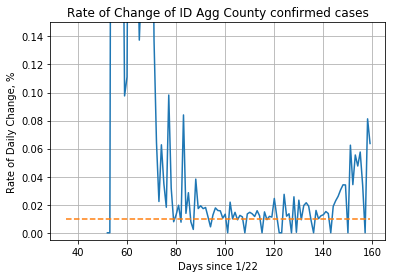

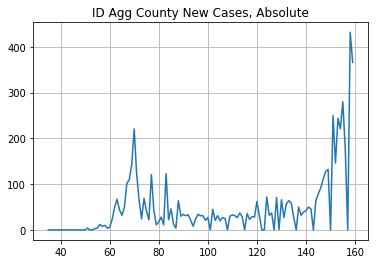

3699
2367
ID is kinda bad


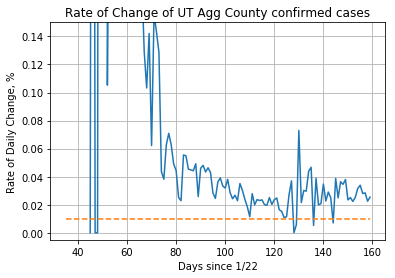

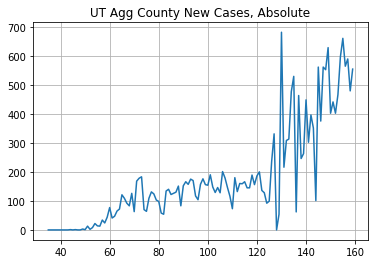

15082
6982
UT is a fuckup


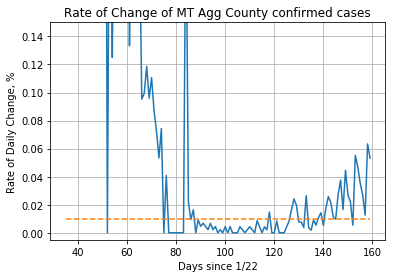

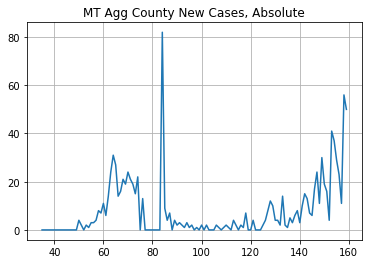

521
424
MT is kinda bad


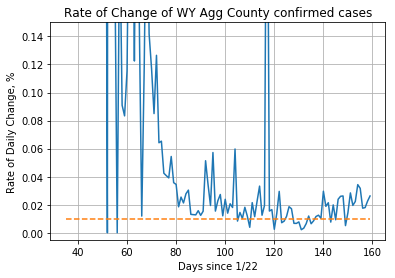

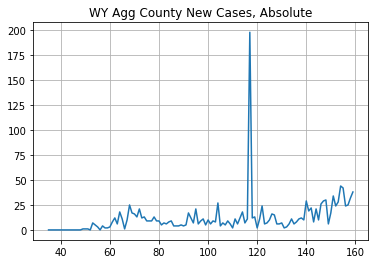

921
537
WY is a fuckup


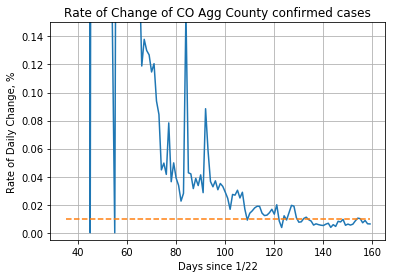

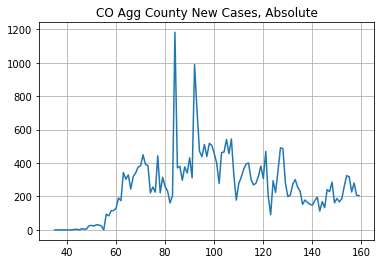

10788
21207
CO is a do-gooder


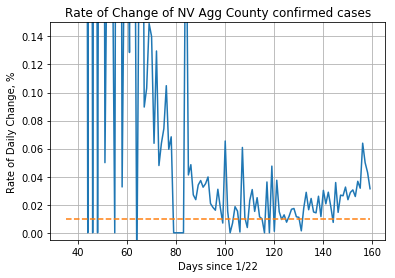

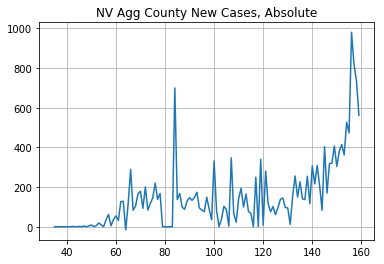

11553
6654
NV is a fuckup


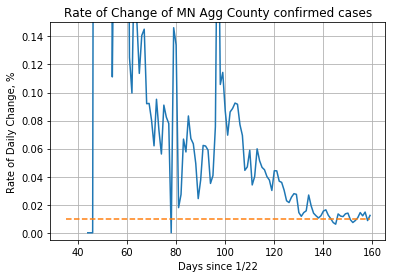

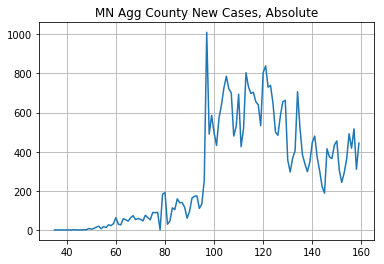

20637
15434
MN is kinda bad


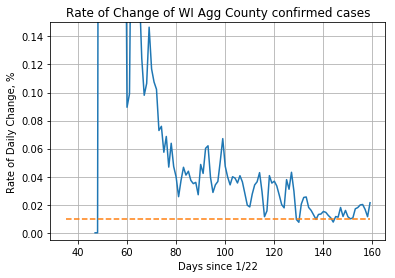

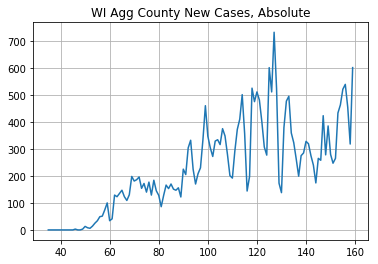

16118
12127
WI is kinda bad


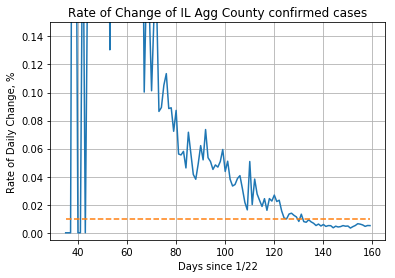

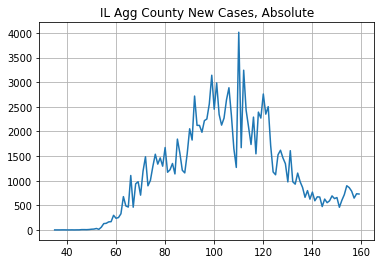

49003
92897
IL is a do-gooder


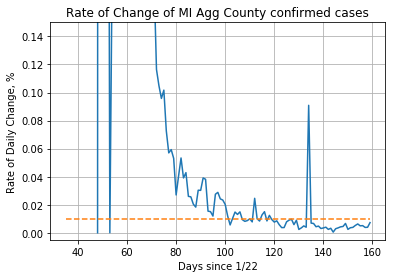

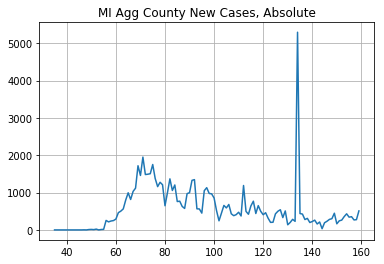

19590
49811
MI is a do-gooder


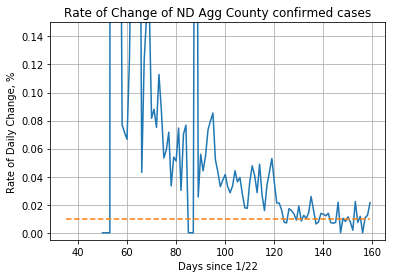

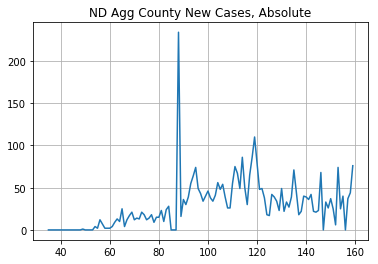

1718
1865
ND is neutral


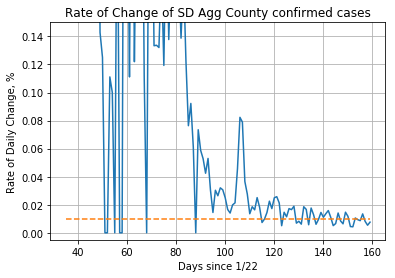

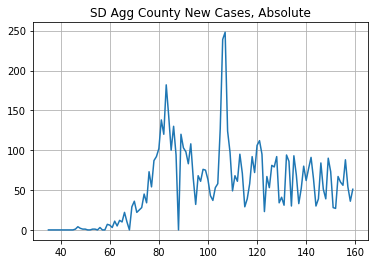

2779
3958
SD is kinda good


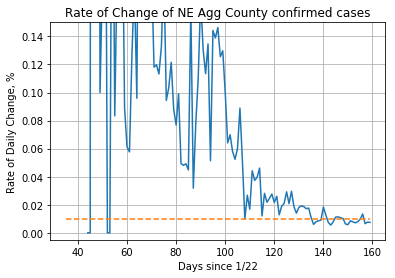

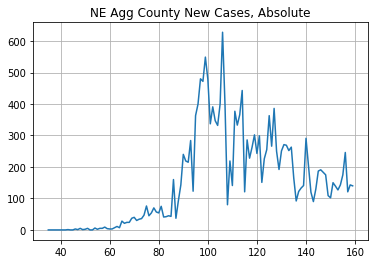

8834
10119
NE is kinda good


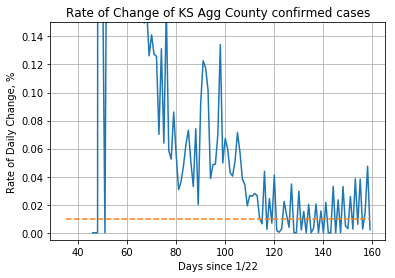

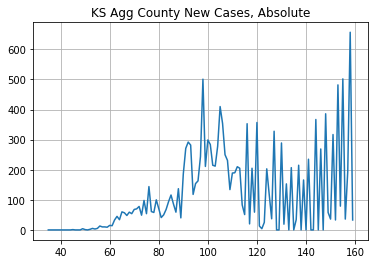

6489
7963
KS is kinda good


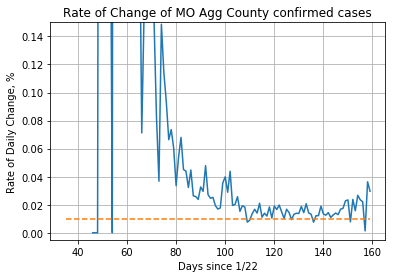

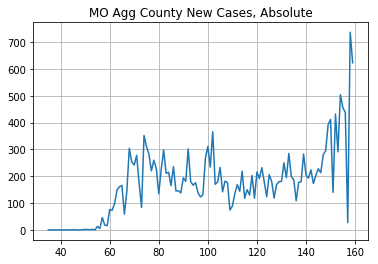

10910
10556
MO is neutral


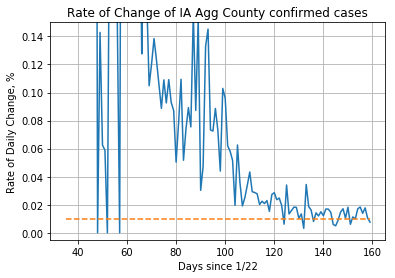

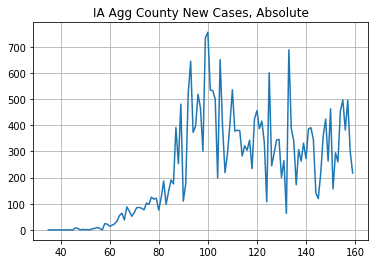

14301
14539
IA is neutral


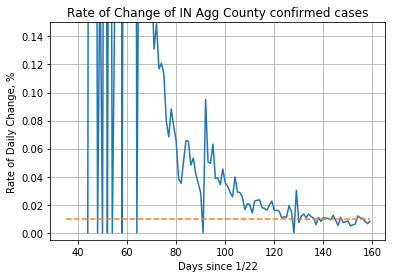

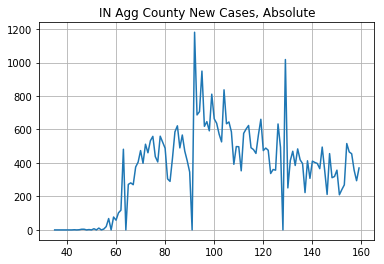

17829
27507
IN is kinda good


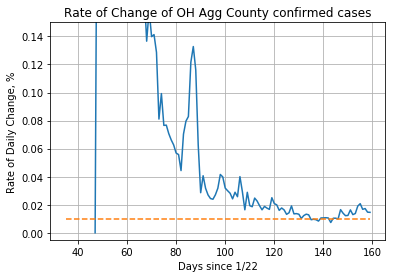

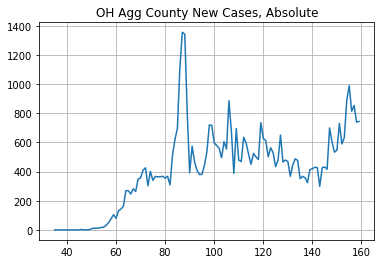

23869
27490
OH is kinda good


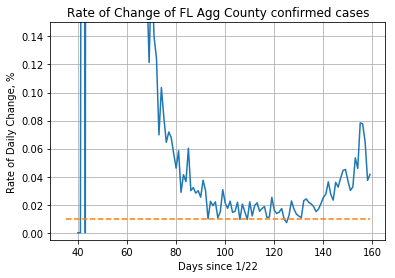

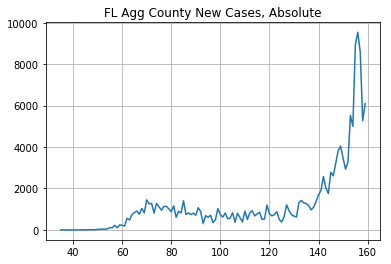

106849
44358
FL is a fuckup


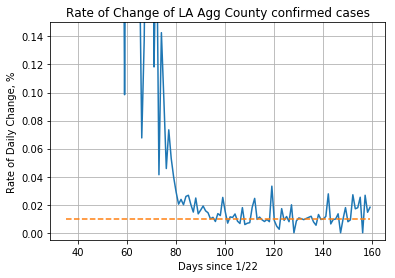

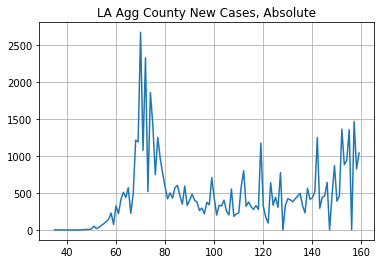

23663
33269
LA is kinda good


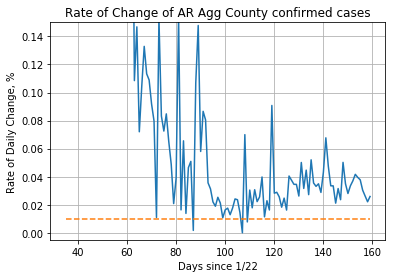

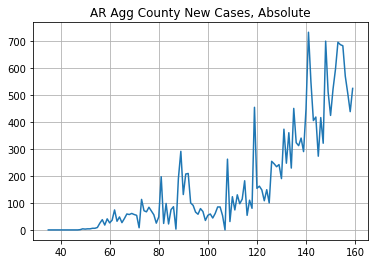

16019
4573
AR is a fuckup


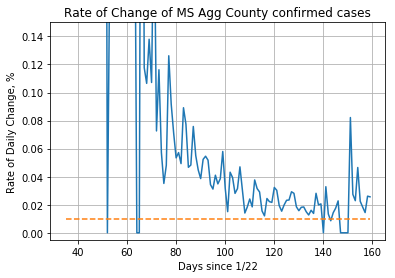

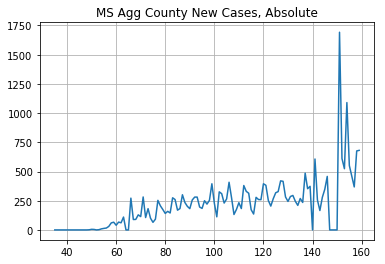

15961
11040
MS is kinda bad


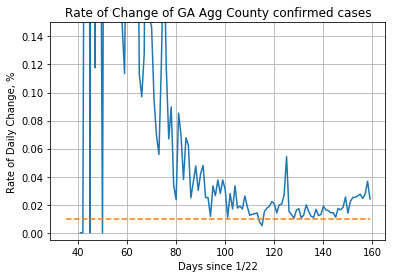

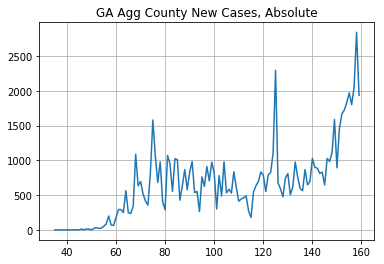

46565
34731
GA is kinda bad


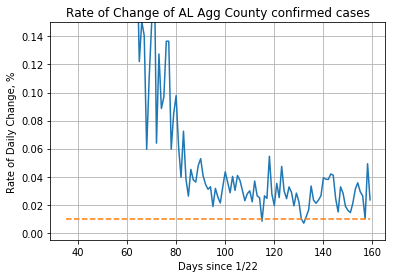

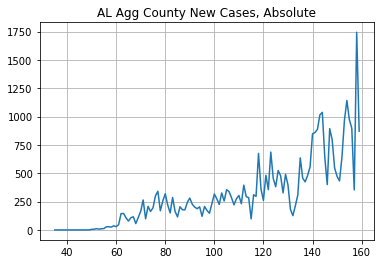

26277
11572
AL is a fuckup


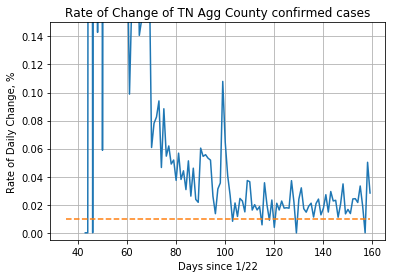

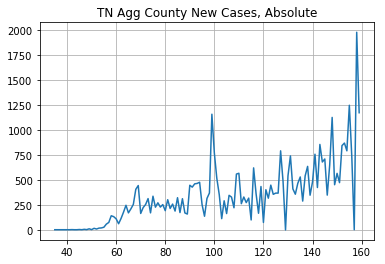

25174
16776
TN is kinda bad


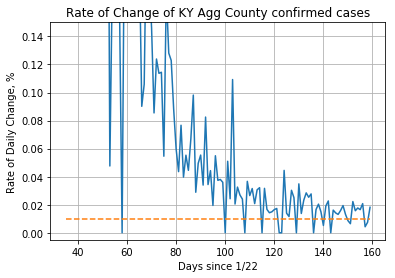

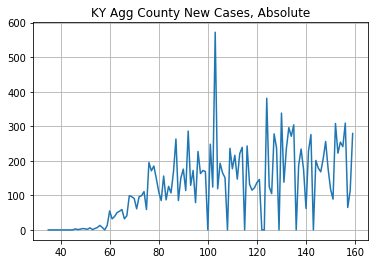

7952
7551
KY is neutral


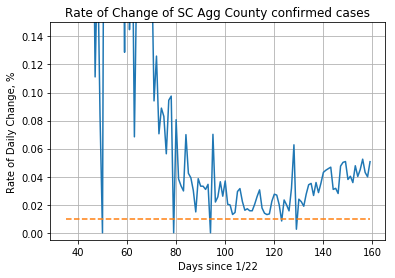

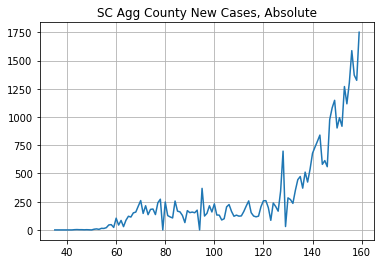

27486
8514
SC is a fuckup


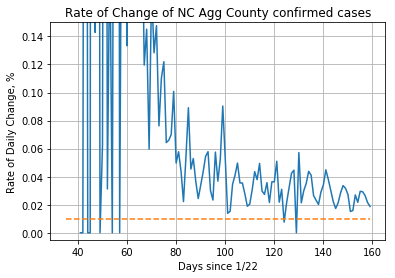

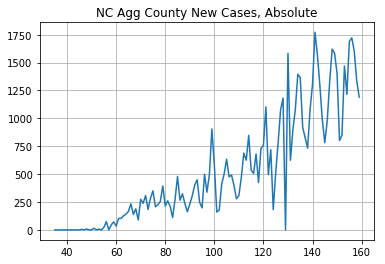

46158
18223
NC is a fuckup


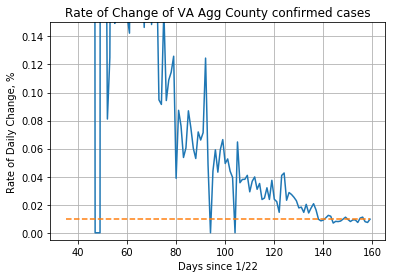

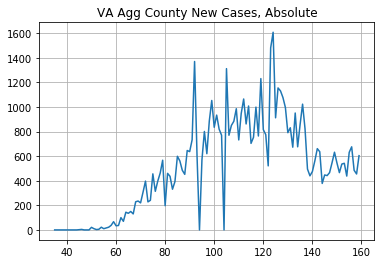

32403
30131
VA is neutral


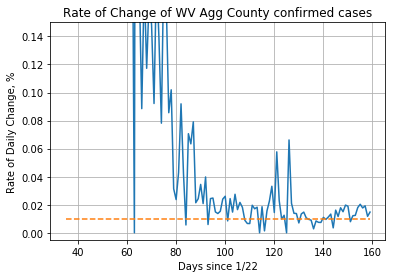

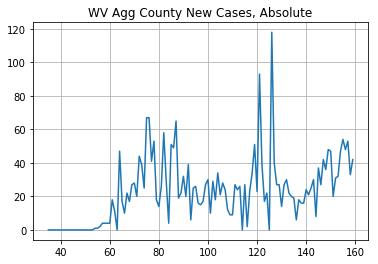

1409
1459
WV is neutral


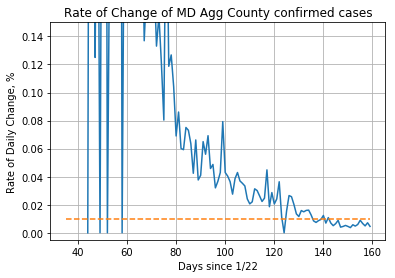

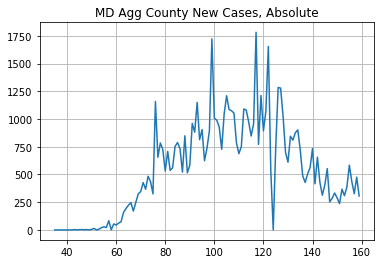

28755
38516
MD is kinda good


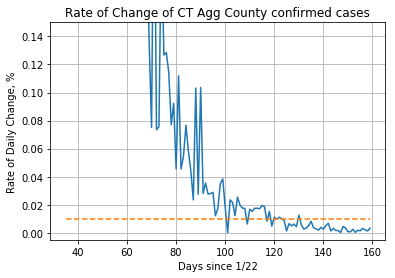

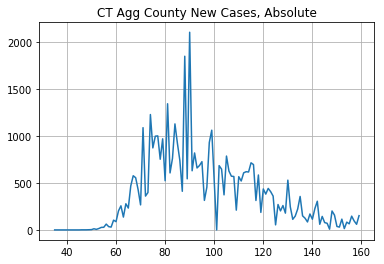

9095
37004
CT is a do-gooder


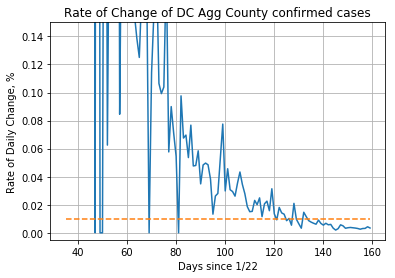

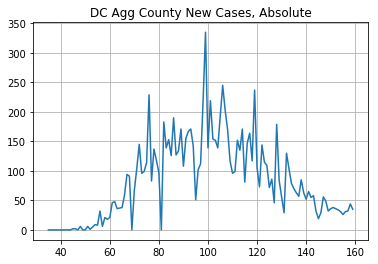

3204
6986
DC is a do-gooder


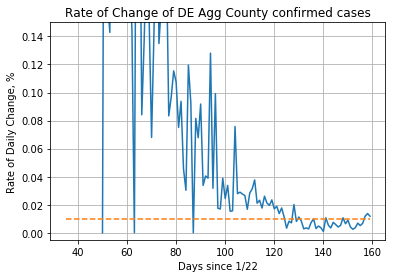

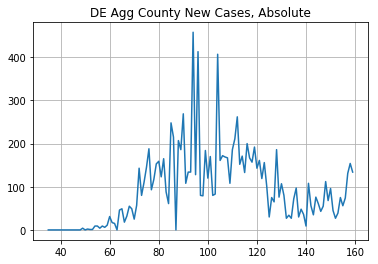

3840
7583
DE is a do-gooder


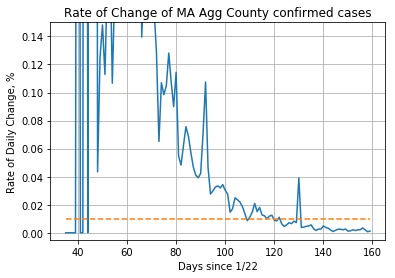

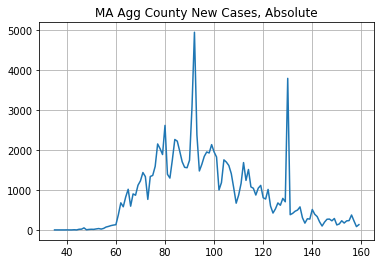

22872
85234
MA is a do-gooder


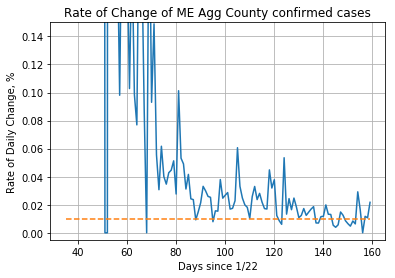

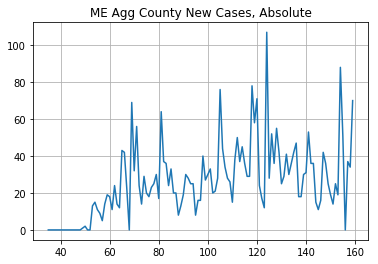

1612
1575
ME is neutral


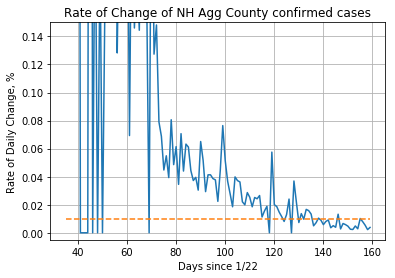

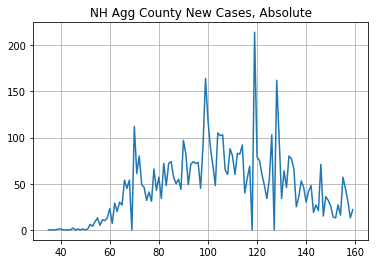

2186
3495
NH is kinda good


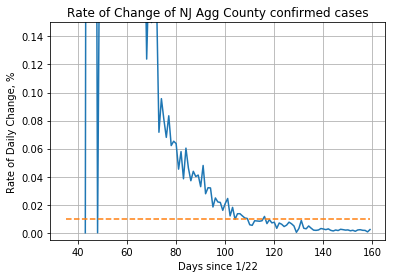

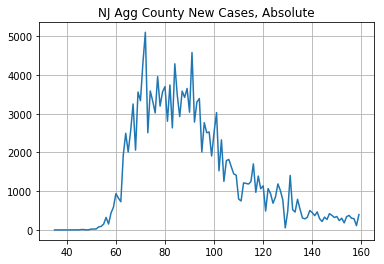

25333
143483
NJ is a do-gooder


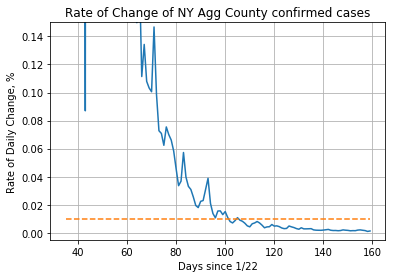

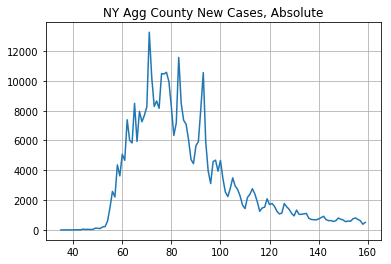

43306
329281
NY is a do-gooder


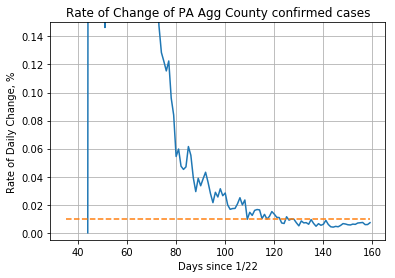

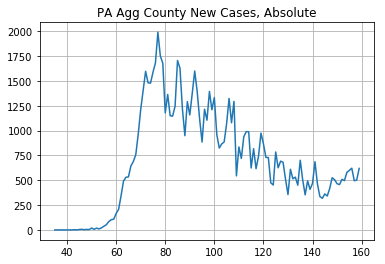

24373
61589
PA is a do-gooder


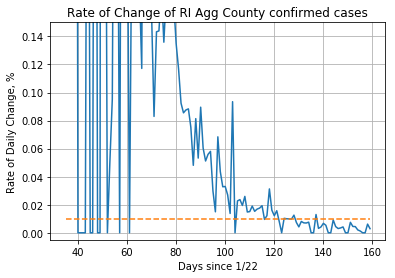

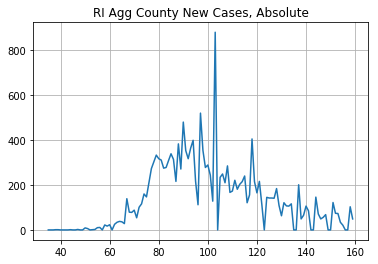

4139
12568
RI is a do-gooder


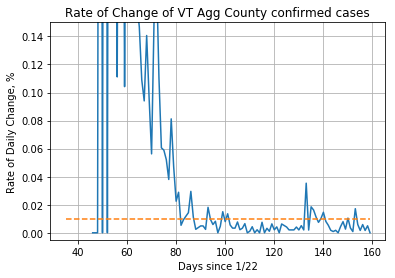

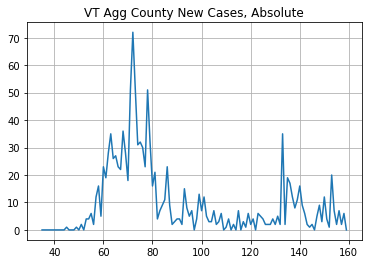

268
864
VT is a do-gooder


In [70]:
# Classifying states based on having more cases since the midpoint (day 106 - 151)
# or before the midpoint (day 61 - 106)

state_list = [state for states in [southwest, west,midwest ,southeast ,northeast ] for state in states]

good_states = []
bad_states = []
neutral_states = []
kinda_good_states = []
kinda_bad_states = []

neg_diffs = []
pos_diffs = []
neg_ratios = []
pos_ratios = []
neutral_diffs = []
neutral_ratios = []

for state in state_list:
    y = single_state(state)
    new_col = [x[1].sum() for x in y.iterrows()]
    df['{}_agg'.format(state)] = new_col
    x = create_roc_and_new_case_numbers(df['{}_agg'.format(state)], '{} Agg'.format(state))
    print(x[1][midpoint:].sum())
    print(x[1][61:midpoint].sum())
    if abs(x[1][midpoint:].sum() - x[1][61:midpoint].sum()) < x[1][61:].sum() * .05:
        print("{} is neutral".format(state))
        neutral_states.append(state)
        neutral_diffs.append(abs(x[1][61:midpoint].sum() - x[1][midpoint:].sum()))
        if x[1][61:midpoint].sum() > x[1][midpoint:].sum():
            neutral_ratios.append(x[1][61:midpoint].sum() / x[1][midpoint:].sum())
        else:
            neutral_ratios.append(x[1][midpoint:].sum() / x[1][61:midpoint].sum())
    elif x[1][midpoint:].sum() > x[1][61:midpoint].sum():
        if np.percentile(np.array(all_ratios), 50) < x[1][midpoint:].sum() / x[1][61:midpoint].sum():
#         if True:
            print("{} is a fuckup".format(state))
            bad_states.append(state)
            neg_diffs.append(x[1][midpoint:].sum() - x[1][61:midpoint].sum())
            neg_ratios.append(x[1][midpoint:].sum() / x[1][61:midpoint].sum())
        else:
            print("{} is kinda bad".format(state))
            kinda_bad_states.append(state)
            neg_diffs.append(x[1][midpoint:].sum() - x[1][61:midpoint].sum())
            neg_ratios.append(x[1][midpoint:].sum() / x[1][61:midpoint].sum())
    else:
        if np.percentile(np.array(all_ratios), 50) < x[1][61:midpoint].sum() / x[1][midpoint:].sum():
#         if True:
            print("{} is a do-gooder".format(state))
            good_states.append(state)
            pos_diffs.append(x[1][61:midpoint].sum() - x[1][midpoint:].sum())
            pos_ratios.append(x[1][61:midpoint].sum() / x[1][midpoint:].sum())
        else:
            print("{} is kinda good".format(state))
            kinda_good_states.append(state)
            pos_diffs.append(x[1][61:midpoint].sum() - x[1][midpoint:].sum())
            pos_ratios.append(x[1][61:midpoint].sum() / x[1][midpoint:].sum())

In [71]:
print(pos_diffs, neg_diffs)
print()
print(np.array(pos_diffs).max(), np.array(neg_diffs).max())
print()

print(pos_ratios, neg_ratios)
print()
print(np.array(pos_ratios).max(), np.array(neg_ratios).max())
print()
print(neutral_diffs)
print(np.array(neutral_diffs).max())
print(neutral_ratios)
print(np.array(neutral_ratios).max())
print()

all_ratios = pos_ratios.copy()
all_ratios.extend(neg_ratios)
all_ratios.extend(neutral_ratios)
np.percentile(np.array(all_ratios), 50)

[1817, 10419, 43894, 30221, 1179, 1285, 1474, 9678, 3621, 9606, 9761, 27909, 3782, 3743, 62362, 1309, 118150, 285975, 37216, 8429, 596] [51575, 983, 65314, 3223, 1610, 72597, 1332, 8100, 97, 384, 4899, 5203, 3991, 62491, 11446, 4921, 11834, 14705, 8398, 18972, 27935]

285975 72597

[1.1262419231570902, 1.9657953281423803, 1.8957410770769136, 2.54267483409903, 1.4242533285354444, 1.1454607199456646, 1.2271536446293727, 1.5428234898199562, 1.1517030457916126, 1.4059502176393526, 1.339454007998609, 4.068609125893348, 2.18039950062422, 1.9747395833333334, 3.726565232598811, 1.5988106129917659, 5.663877156278372, 7.60358841730938, 2.5269355434292042, 3.0364822420874606, 3.2238805970149254] [4.763774355980442, 1.177404800577513, 2.3901032244333296, 1.6166060837956764, 1.4696616102683782, 1.9356730422230242, 1.5627376425855513, 2.160126038384417, 1.2287735849056605, 1.7150837988826815, 1.736248872858431, 1.3371128676947, 1.3291003545806876, 2.40878759186618, 3.5029521102121146, 1.445742753623

1.5988106129917659

c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in longlong_scalars
  import sys
c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in longlong_scalars
  import sys


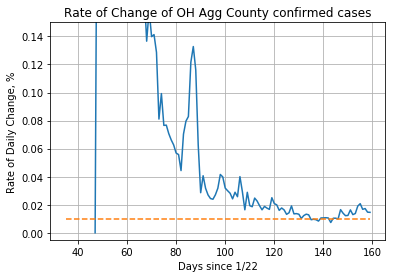

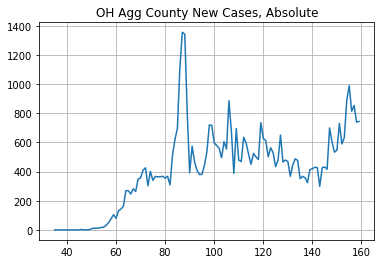

23869
27490
OH is a do-gooder


In [72]:
state = "OH"
# neutral_states = []
y = single_state(state)
new_col = [x[1].sum() for x in y.iterrows()]
df['{}_agg'.format(state)] = new_col
x = create_roc_and_new_case_numbers(df['{}_agg'.format(state)], '{} Agg'.format(state))
print(x[1][midpoint:].sum())
print(x[1][61:midpoint].sum())

if abs(x[1][midpoint:].sum() - x[1][61:midpoint].sum()) < x[1][61:].sum() * .05:
    print("{} is neutral".format(state))
    neutral_states.append(state)
elif x[1][midpoint:].sum() > x[1][61:midpoint].sum():
    print("{} is a fuckup".format(state))
#     bad_states.append(state)
else:
    print("{} is a do-gooder".format(state))
#     good_states.append(state)

['CO', 'IL', 'MI', 'CT', 'DC', 'DE', 'MA', 'NJ', 'NY', 'PA', 'RI', 'VT']
['WA', 'SD', 'NE', 'KS', 'IN', 'OH', 'LA', 'MD', 'NH']
['ND', 'MO', 'IA', 'KY', 'VA', 'WV', 'ME']
['NM', 'OR', 'ID', 'MT', 'MN', 'WI', 'MS', 'GA', 'TN']
['AZ', 'TX', 'OK', 'CA', 'UT', 'WY', 'NV', 'FL', 'AR', 'AL', 'SC', 'NC']


c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in longlong_scalars
  import sys
c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in longlong_scalars
  import sys


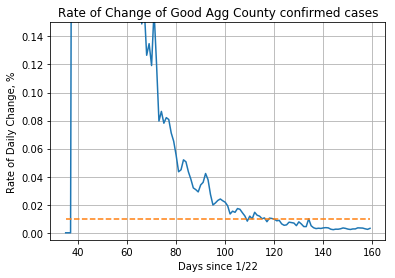

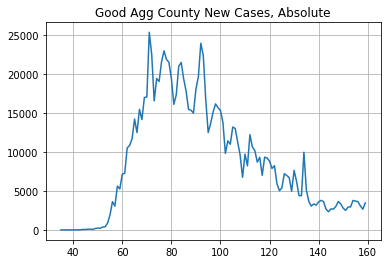

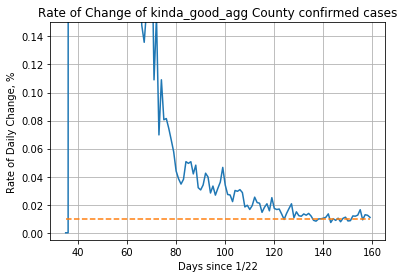

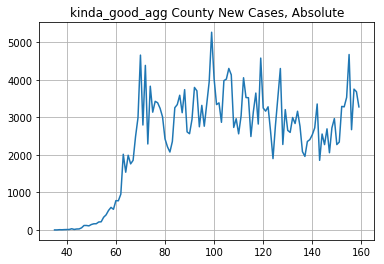

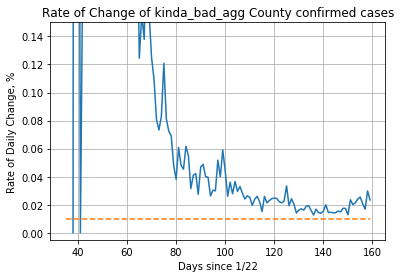

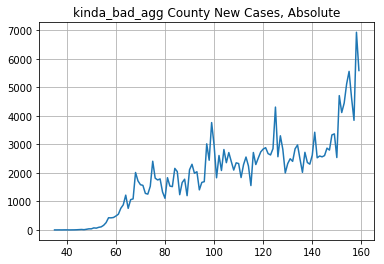

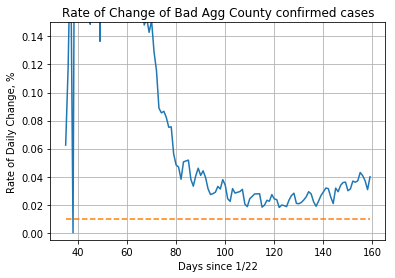

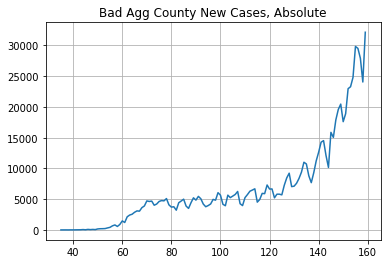

(         Bad_agg    change
 1/22/20        0       NaN
 1/23/20        0       NaN
 1/24/20        0       NaN
 1/25/20        0       inf
 1/26/20        3  0.333333
 ...          ...       ...
 6/26/20   724193  0.040749
 6/27/20   753703  0.037036
 6/28/20   781617  0.030768
 6/29/20   805666  0.039892
 6/30/20   837806  0.000000
 
 [161 rows x 2 columns],
 array([    0,     0,     0,     3,     1,     0,     1,     0,     0,
            0,     0,     2,     0,     0,     0,     0,     0,     0,
            0,     1,     0,     1,     0,     0,     0,     0,     1,
            0,     0,     3,     0,     0,     1,     0,     2,     1,
            2,     4,     0,     9,     5,    14,    19,    23,    55,
           22,    84,    48,    79,    52,   159,   192,   201,   219,
          323,   420,   664,   808,   562,   887,  1465,  1206,  2132,
         2416,  2549,  2867,  3092,  3050,  3621,  3896,  4713,  4627,
         4683,  4014,  4206,  4625,  4771,  4725,  5100,  4077,  3707

In [73]:
print(good_states)
print(kinda_good_states)
print(neutral_states)
print(kinda_bad_states)
print(bad_states)



y = aggregate_region(good_states)
new_col = [x[1].sum() for x in y.iterrows()]
df['Good_agg'] = new_col
create_roc_and_new_case_numbers(df['Good_agg'], 'Good Agg')

y = aggregate_region(kinda_good_states)
new_col = [x[1].sum() for x in y.iterrows()]
df['kinda_good_agg'] = new_col
create_roc_and_new_case_numbers(df['kinda_good_agg'], 'kinda_good_agg')

y = aggregate_region(kinda_bad_states)
new_col = [x[1].sum() for x in y.iterrows()]
df['kinda_bad_agg'] = new_col
create_roc_and_new_case_numbers(df['kinda_bad_agg'], 'kinda_bad_agg')

y = aggregate_region(bad_states)
new_col = [x[1].sum() for x in y.iterrows()]
df['Bad_agg'] = new_col
create_roc_and_new_case_numbers(df['Bad_agg'], 'Bad Agg')

c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in longlong_scalars
  import sys
c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in longlong_scalars
  import sys


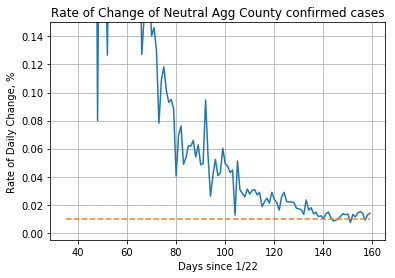

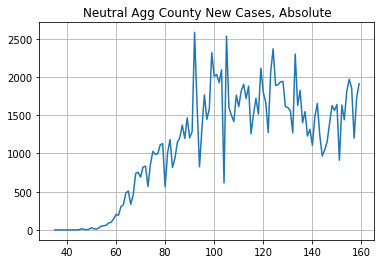

(         Neutral_agg    change
 1/22/20            0       NaN
 1/23/20            0       NaN
 1/24/20            0       NaN
 1/25/20            0       NaN
 1/26/20            0       NaN
 ...              ...       ...
 6/26/20       132118  0.014025
 6/27/20       133971  0.008957
 6/28/20       135171  0.012702
 6/29/20       136888  0.013968
 6/30/20       138800  0.000000
 
 [161 rows x 2 columns],
 array([   0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    3,   15,    7,    2,    9,   29,   14,   10,   26,   52,
          53,   63,   91,   99,  143,  203,  192,  304,  330,  483,  509,
         335,  459,  738,  754,  691,  821,  834,  568,  853, 1028,  988,
         995, 1113, 1129,  564, 1007, 1182,  816,  937, 1146, 1210, 137

In [74]:
y = aggregate_region(neutral_states)
new_col = [x[1].sum() for x in y.iterrows()]
df['Neutral_agg'] = new_col
create_roc_and_new_case_numbers(df['Neutral_agg'], 'Neutral Agg')

4/3/20


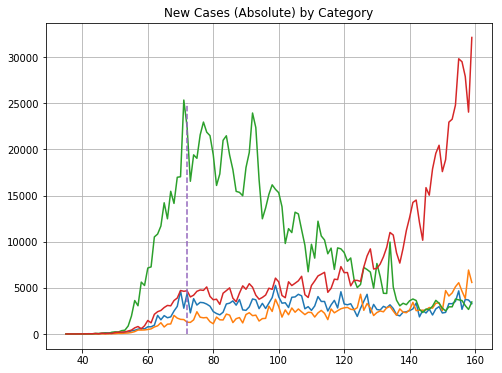

In [75]:
plt.figure(figsize=(8, 6))

create_new_case_graphs(df['kinda_good_agg'], 'Kinda Good Agg')
create_new_case_graphs(df['kinda_bad_agg'], 'Kinda Bad Agg')

create_new_case_graphs(df['Good_agg'], 'Good Agg')
create_new_case_graphs(df['Bad_agg'], 'Bad Agg')
plt.grid()
plt.plot([72, 72], [0, 25000], linestyle="dashed")
# create_new_case_graphs(df['Neutral_agg'], 'Neutral Agg')
plt.title("New Cases (Absolute) by Category")
print(df.index[72])

c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in longlong_scalars
  import sys
c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in longlong_scalars
  import sys


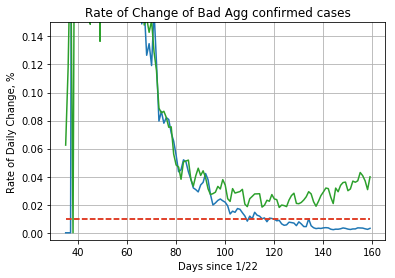

In [76]:
create_roc_graphs(df['Good_agg'], 'Good Agg')
create_roc_graphs(df['Bad_agg'], 'Bad Agg')
plt.grid()

# Plot US Regions

c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in longlong_scalars
  import sys
c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in longlong_scalars
  import sys


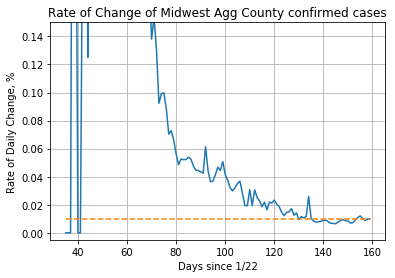

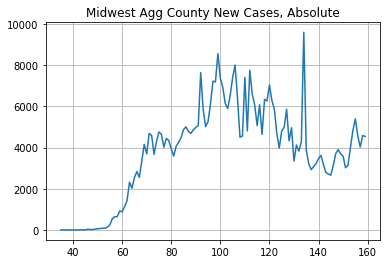

(         Midwest_agg    change
 1/22/20            0       NaN
 1/23/20            0       inf
 1/24/20            1  0.000000
 1/25/20            1  0.000000
 1/26/20            1  0.000000
 ...              ...       ...
 6/26/20       453060  0.010056
 6/27/20       457616  0.008793
 6/28/20       461640  0.009936
 6/29/20       466227  0.009733
 6/30/20       470765  0.000000
 
 [161 rows x 2 columns],
 array([   0,    1,    0,    0,    0,    0,    0,    0,    1,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    1,    1,    0,    0,    1,    3,
           1,    4,   28,   24,   14,   41,   59,   66,   85,   82,  134,
         249,  546,  641,  643,  920,  877, 1131, 1428, 2320, 2023, 2544,
        2833, 2551, 3353, 4154, 3694, 4682, 4588, 3669, 4305, 4758, 4641,
        4016, 4449, 4336, 3935, 3582, 4067, 4250, 4475, 4867, 5005, 477

In [77]:
y = aggregate_region(midwest)
new_col = [x[1].sum() for x in y.iterrows()]
df['Midwest_agg'] = new_col
create_roc_and_new_case_numbers(df['Midwest_agg'], 'Midwest Agg')

c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in longlong_scalars
  import sys
c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in longlong_scalars
  import sys


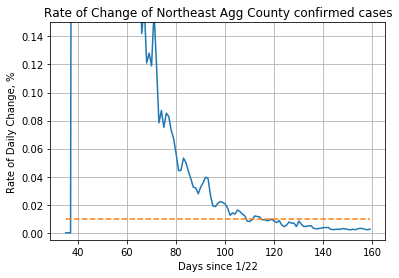

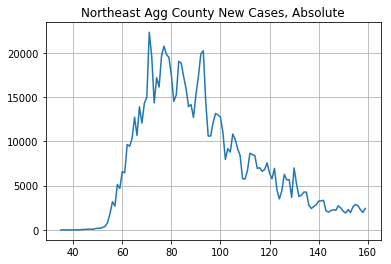

(         Northeast_agg    change
 1/22/20              0       NaN
 1/23/20              0       NaN
 1/24/20              0       NaN
 1/25/20              0       NaN
 1/26/20              0       NaN
 ...                ...       ...
 6/26/20         914250  0.002997
 6/27/20         916990  0.002487
 6/28/20         919271  0.002139
 6/29/20         921237  0.002628
 6/30/20         923658  0.000000
 
 [161 rows x 2 columns],
 array([    0,     0,     0,     0,     0,     0,     0,     0,     0,
            1,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     1,     3,     3,     9,    14,    11,    55,
           58,    79,    94,    53,   148,   184,   177,   285,   393,
          821,  1846,  3179,  2696,  5125,  4680,  6582,  6445,  9639,
         9441, 10348, 12726, 10664, 13895, 12059, 14307, 14986, 2230

In [78]:
y = aggregate_region(northeast)
new_col = [x[1].sum() for x in y.iterrows()]
df['Northeast_agg'] = new_col
create_roc_and_new_case_numbers(df['Northeast_agg'], 'Northeast Agg')

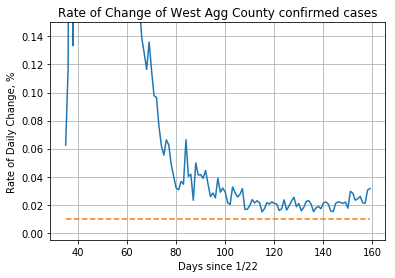

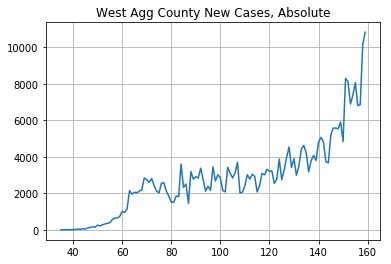

(         West_agg    change
 1/22/20         1  0.000000
 1/23/20         1  0.000000
 1/24/20         1  0.000000
 1/25/20         1  2.000000
 1/26/20         3  0.333333
 ...           ...       ...
 6/26/20    319291  0.021316
 6/27/20    326097  0.021058
 6/28/20    332964  0.030439
 6/29/20    343099  0.031554
 6/30/20    353925  0.000000
 
 [161 rows x 2 columns],
 array([    0,     0,     0,     2,     1,     0,     1,     0,     0,
            0,     0,     2,     0,     0,     0,     0,     0,     0,
            0,     1,     0,     1,     0,     0,     0,     0,     1,
            0,     0,     3,     0,     0,     1,     0,     2,     1,
            2,    11,     4,    17,    13,    26,    46,    29,    72,
           42,   111,   138,   167,   156,   261,   222,   285,   329,
          366,   398,   572,   649,   659,   740,  1016,   957,  1134,
         2158,  1961,  2065,  2032,  2131,  2188,  2852,  2755,  2598,
         2813,  2434,  2133,  2024,  2555,  2580,  2129, 

In [79]:
y = aggregate_region(west)
new_col = [x[1].sum() for x in y.iterrows()]
df['West_agg'] = new_col
create_roc_and_new_case_numbers(df['West_agg'], 'West Agg')

c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in longlong_scalars
  import sys
c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in longlong_scalars
  import sys


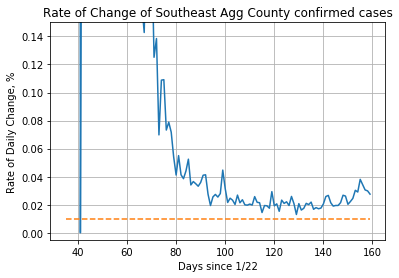

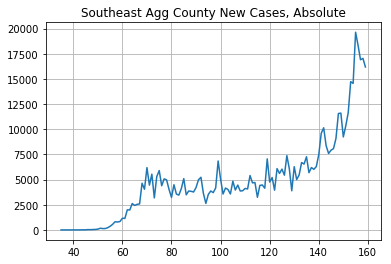

(         Southeast_agg    change
 1/22/20              0       NaN
 1/23/20              0       NaN
 1/24/20              0       NaN
 1/25/20              0       NaN
 1/26/20              0       NaN
 ...                ...       ...
 6/26/20         535048  0.034287
 6/27/20         553393  0.030542
 6/28/20         570295  0.029872
 6/29/20         587331  0.027553
 6/30/20         603514  0.000000
 
 [161 rows x 2 columns],
 array([    0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     1,     3,     0,     2,     4,     9,
            9,    32,    24,    41,    46,    77,   167,   131,   136,
          217,   361,   550,   810,   786,   833,  1162,  1140,  1996,
         1980,  2617,  2430,  2542,  2585,  4635,  4040,  6187,  444

In [80]:
y = aggregate_region(southeast)
new_col = [x[1].sum() for x in y.iterrows()]
df['Southeast_agg'] = new_col
create_roc_and_new_case_numbers(df['Southeast_agg'], 'Southeast Agg')

c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in longlong_scalars
  import sys
c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in longlong_scalars
  import sys


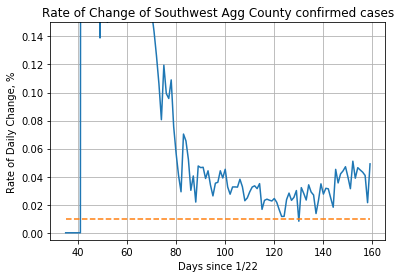

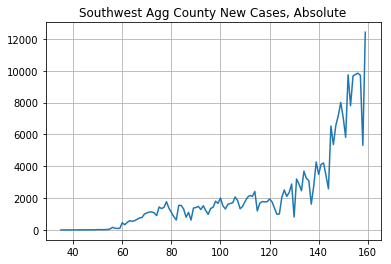

(         Southwest_agg    change
 1/22/20              0       NaN
 1/23/20              0       NaN
 1/24/20              0       NaN
 1/25/20              0       inf
 1/26/20              1  0.000000
 ...                ...       ...
 6/26/20         227821  0.043218
 6/27/20         237667  0.040864
 6/28/20         247379  0.021473
 6/29/20         252691  0.049131
 6/30/20         265106  0.000000
 
 [161 rows x 2 columns],
 array([    0,     0,     0,     1,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     3,     2,     7,
            3,     8,     5,     7,     5,    20,    19,    12,    17,
           27,    55,   161,   107,    92,    98,   450,   322,   467,
          575,   543,   577,   662,   755,   774,   990,  1066,  112

In [81]:
y = aggregate_region(southwest)
new_col = [x[1].sum() for x in y.iterrows()]
df['Southwest_agg'] = new_col
create_roc_and_new_case_numbers(df['Southwest_agg'], 'Southwest Agg')

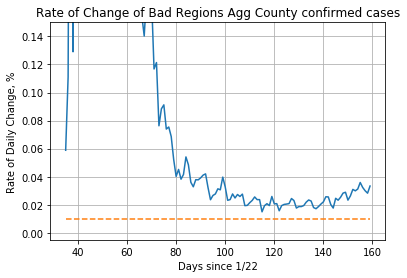

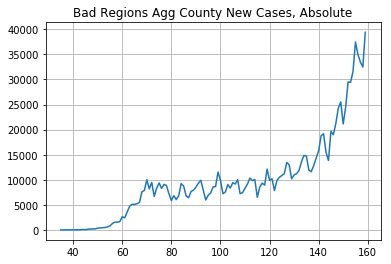

c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in longlong_scalars
  import sys
c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in longlong_scalars
  import sys


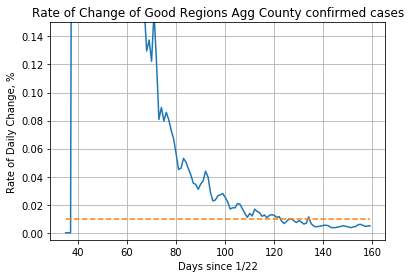

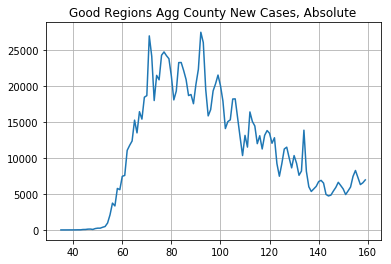

(         Good_regions_agg    change
 1/22/20                 0       NaN
 1/23/20                 0       inf
 1/24/20                 1  0.000000
 1/25/20                 1  0.000000
 1/26/20                 1  0.000000
 ...                   ...       ...
 6/26/20           1367310  0.005336
 6/27/20           1374606  0.004587
 6/28/20           1380911  0.004745
 6/29/20           1387464  0.005016
 6/30/20           1394423  0.000000
 
 [161 rows x 2 columns],
 array([    0,     1,     0,     0,     0,     0,     0,     0,     1,
            1,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     2,     4,     3,     9,    15,    14,    56,
           62,   107,   118,    67,   189,   243,   243,   370,   475,
          955,  2095,  3725,  3337,  5768,  5600,  7459,  7576, 11067,
        11761, 12371, 15270, 134

In [82]:
y = aggregate_region(southwest + southeast + west)
new_col = [x[1].sum() for x in y.iterrows()]
df['Bad_regions_agg'] = new_col
create_roc_and_new_case_numbers(df['Bad_regions_agg'], 'Bad Regions Agg')

y = aggregate_region(midwest + northeast)
new_col = [x[1].sum() for x in y.iterrows()]
df['Good_regions_agg'] = new_col
create_roc_and_new_case_numbers(df['Good_regions_agg'], 'Good Regions Agg')


## Classifying states based on growth since first 10% of cumulative cases

c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in longlong_scalars
  import sys
c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in longlong_scalars
  import sys


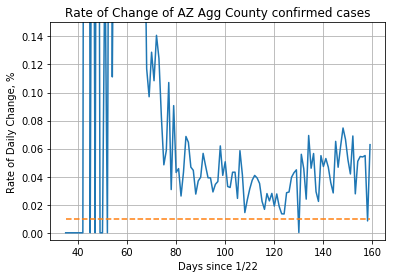

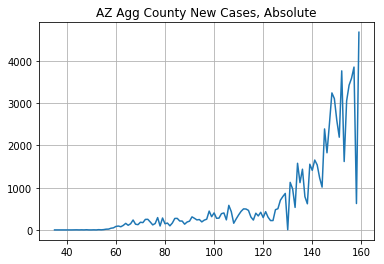

AZ is a fuckup


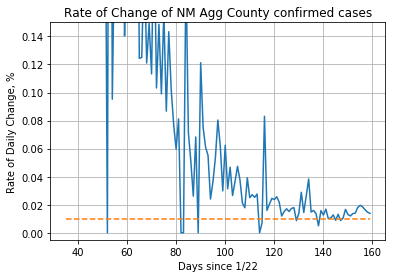

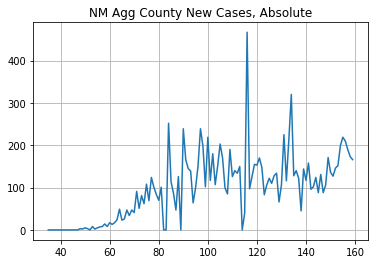

NM is neutral


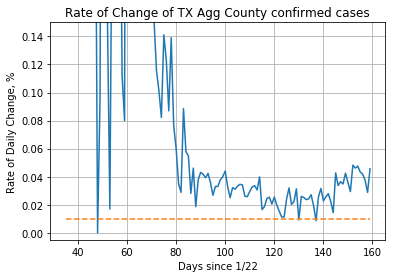

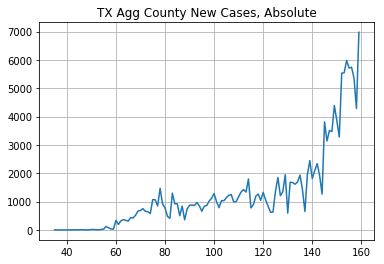

TX is a fuckup


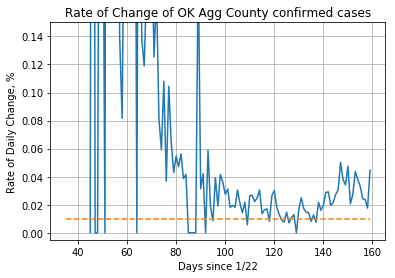

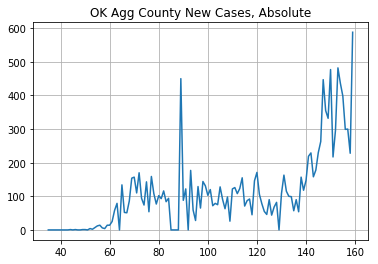

OK is a fuckup


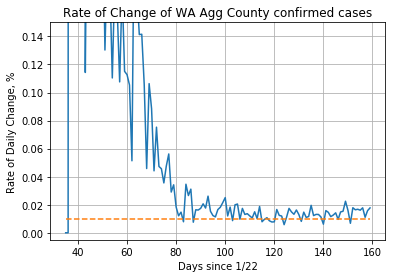

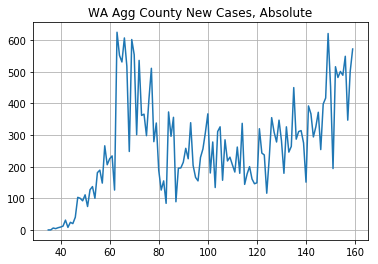

WA is neutral


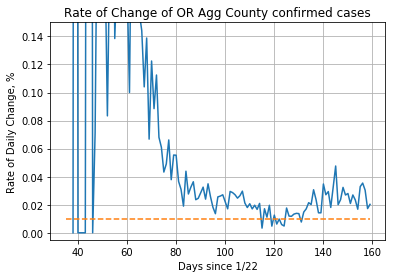

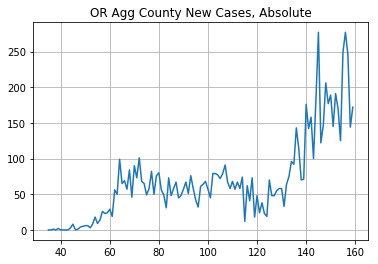

OR is a fuckup


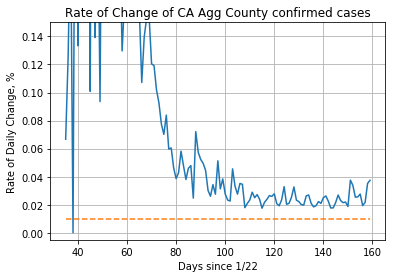

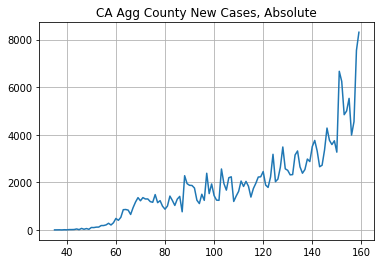

CA is a fuckup


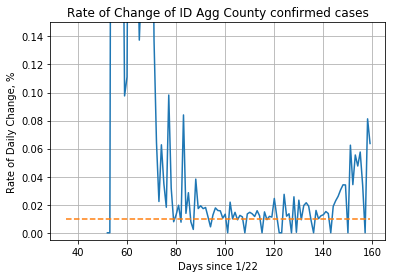

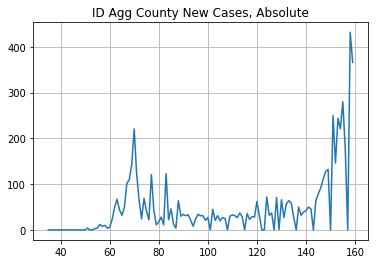

ID is a fuckup


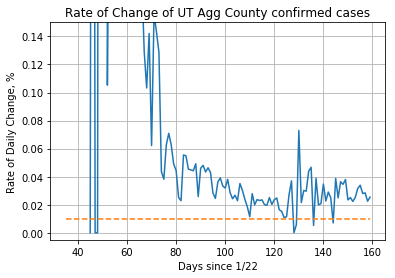

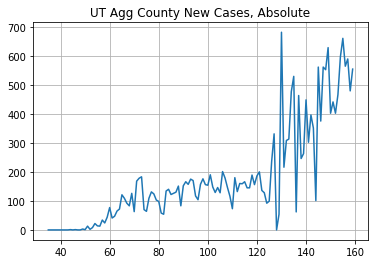

UT is a fuckup


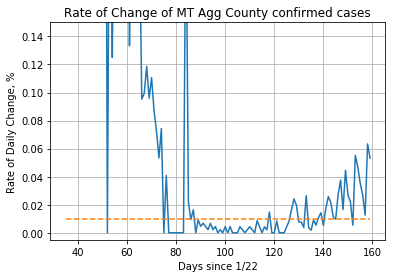

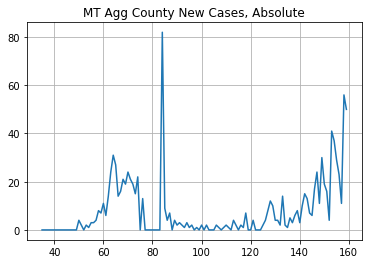

MT is a fuckup


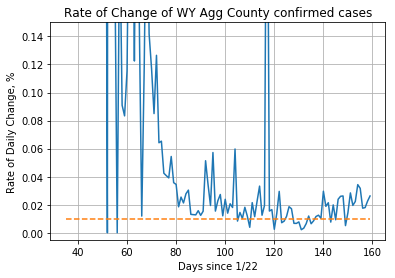

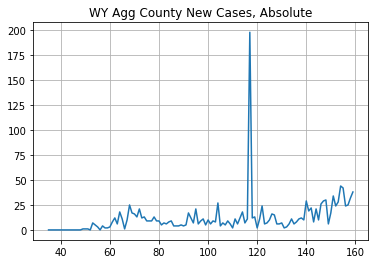

WY is a fuckup


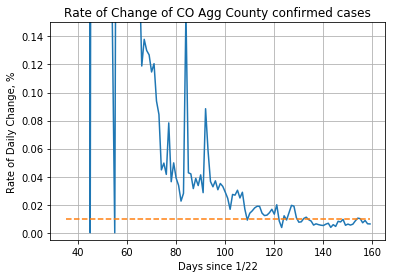

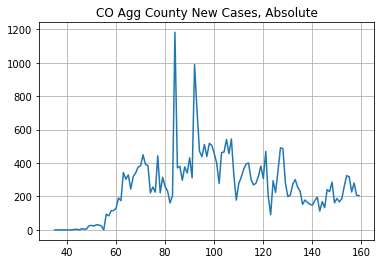

CO is a do-gooder


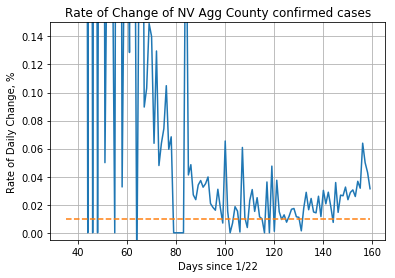

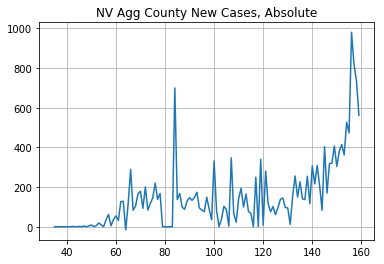

NV is a fuckup


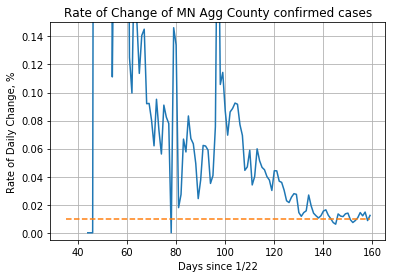

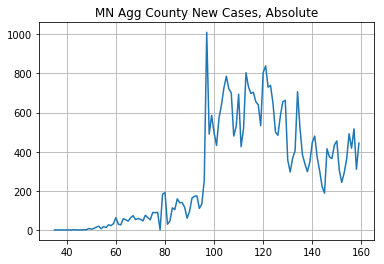

MN is a do-gooder


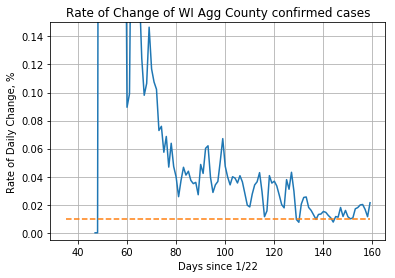

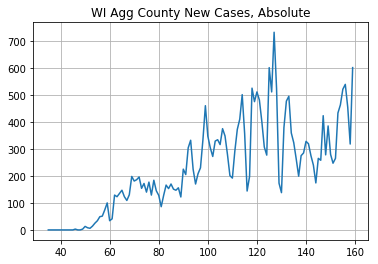

WI is a fuckup


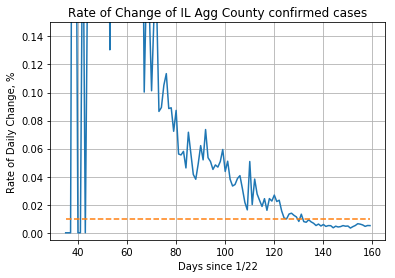

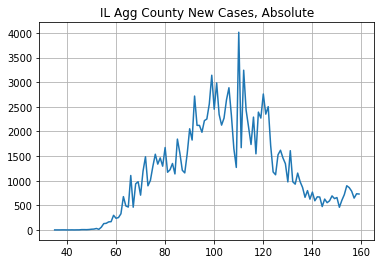

IL is a do-gooder


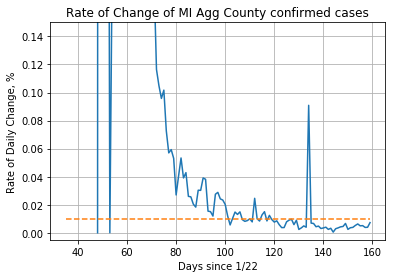

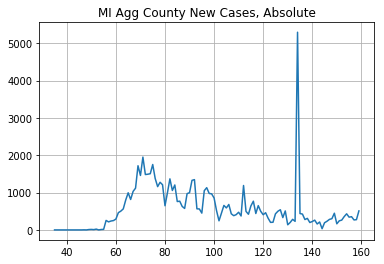

MI is a do-gooder


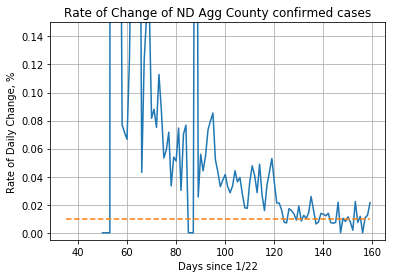

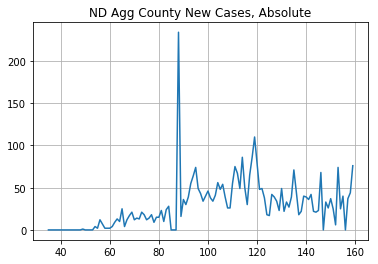

ND is a do-gooder


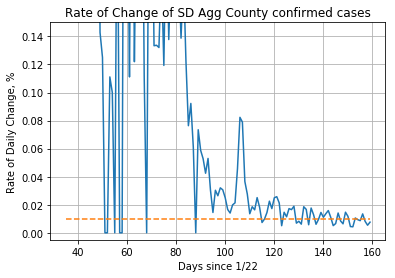

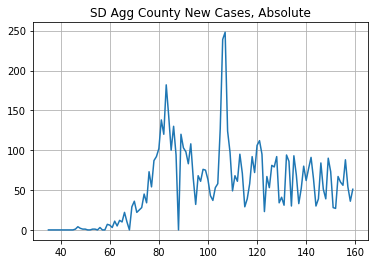

SD is a do-gooder


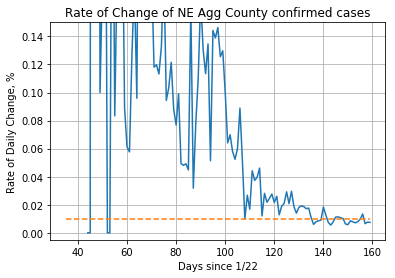

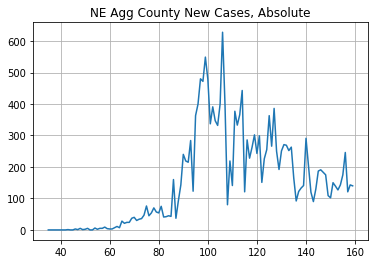

NE is a do-gooder


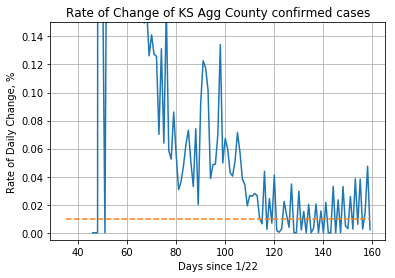

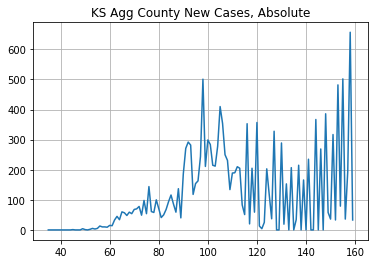

KS is a do-gooder


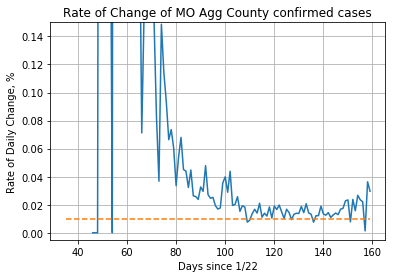

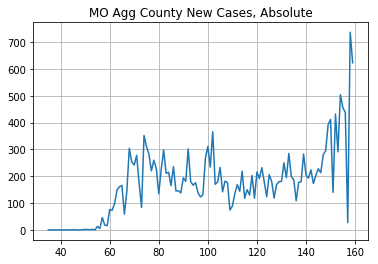

MO is a fuckup


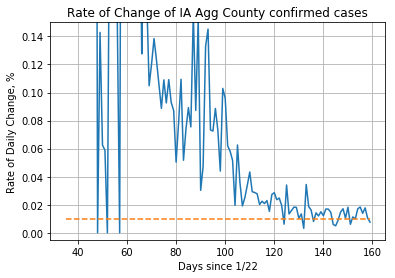

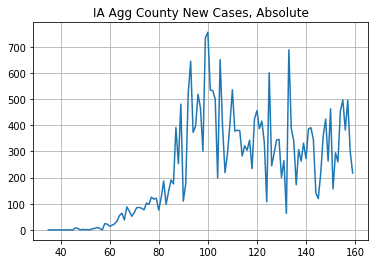

IA is a do-gooder


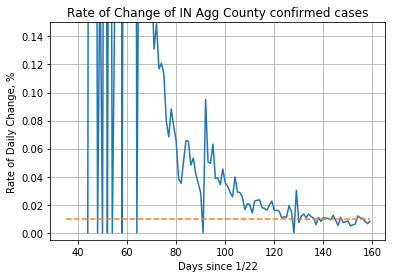

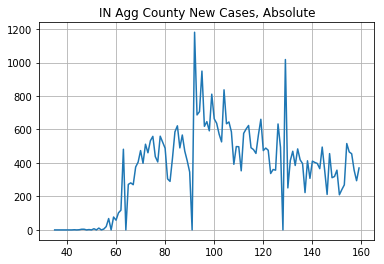

IN is a do-gooder


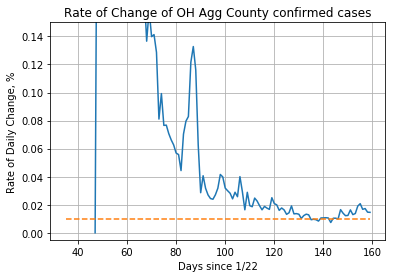

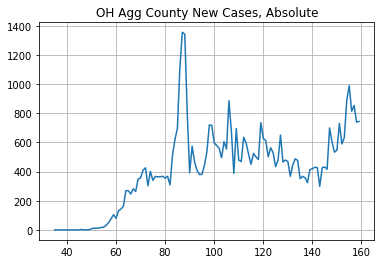

OH is neutral


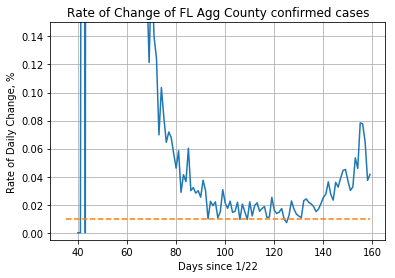

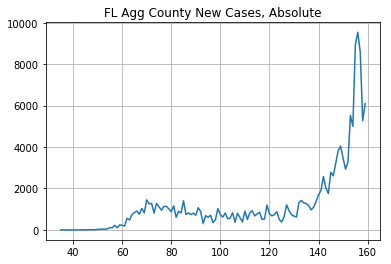

FL is a fuckup


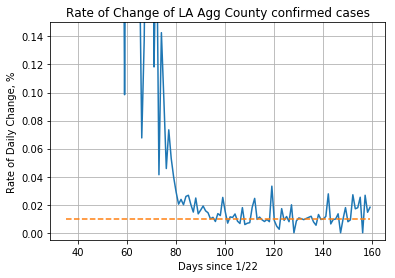

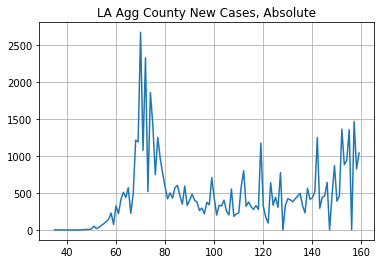

LA is a do-gooder


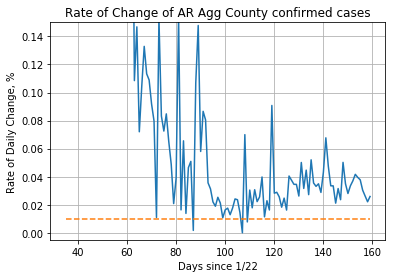

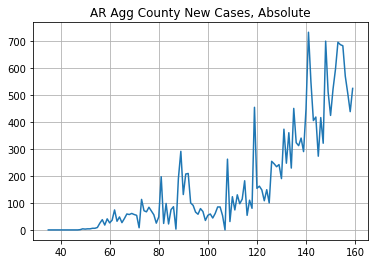

AR is a fuckup


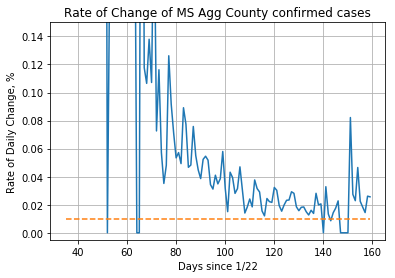

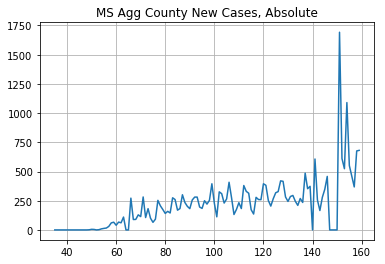

MS is a fuckup


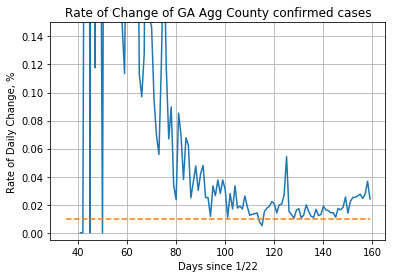

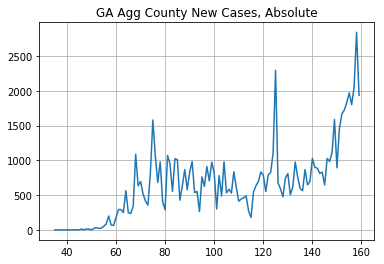

GA is a fuckup


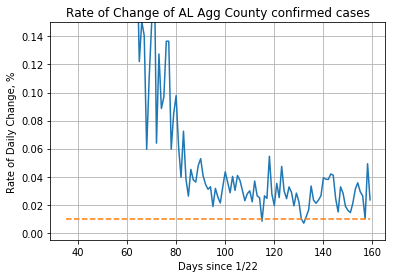

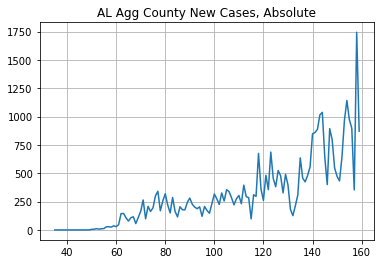

AL is a fuckup


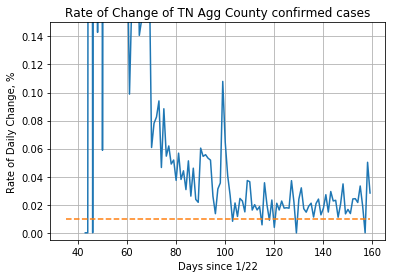

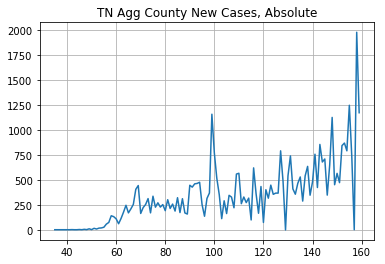

TN is a fuckup


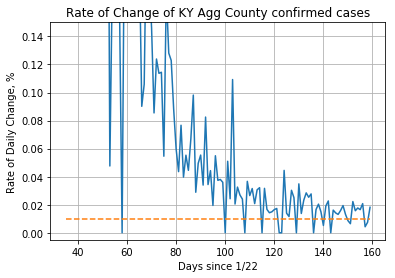

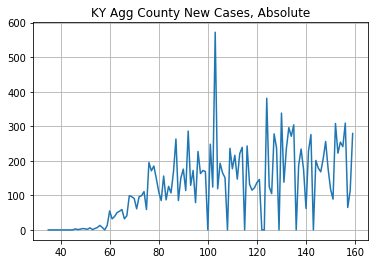

KY is neutral


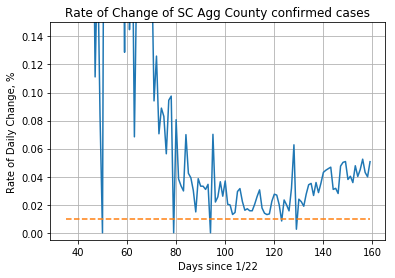

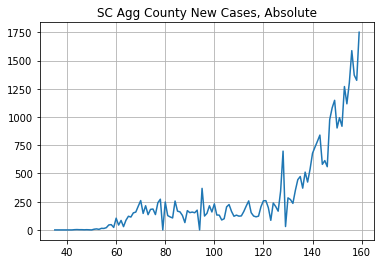

SC is a fuckup


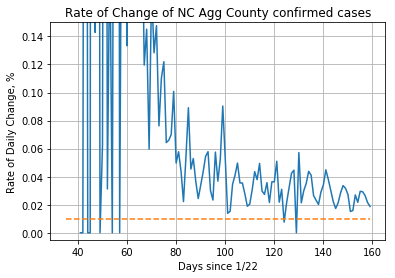

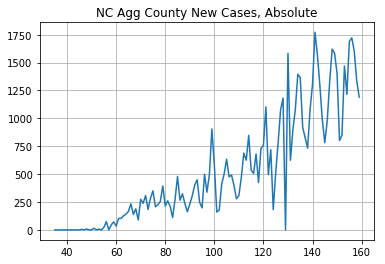

NC is a fuckup


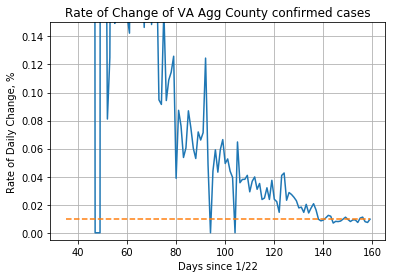

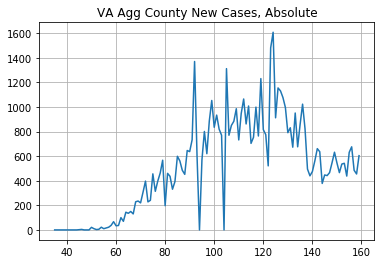

VA is neutral


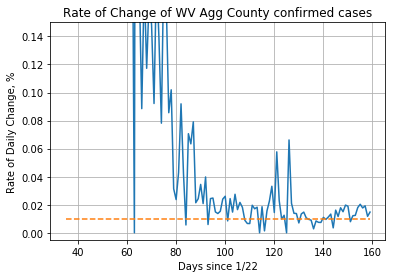

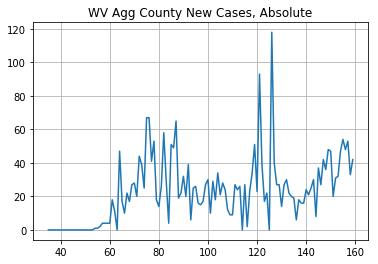

WV is a do-gooder


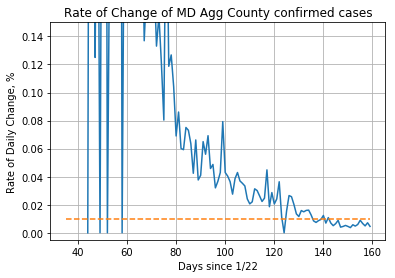

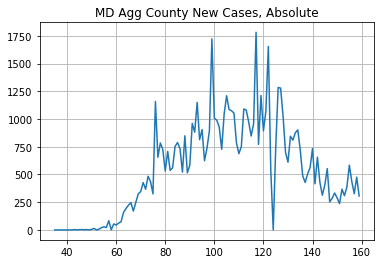

MD is a do-gooder


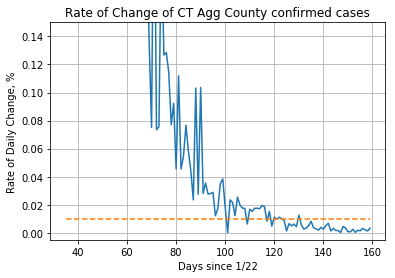

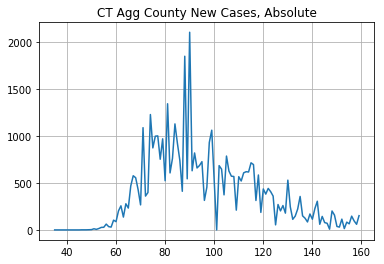

CT is a do-gooder


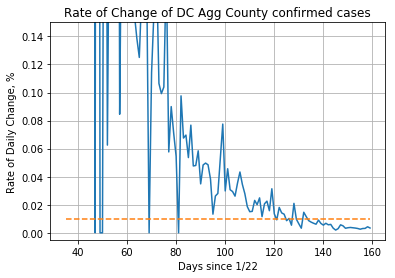

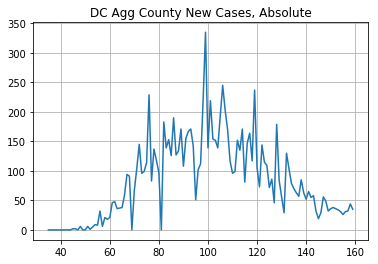

DC is a do-gooder


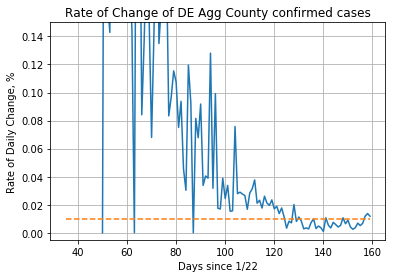

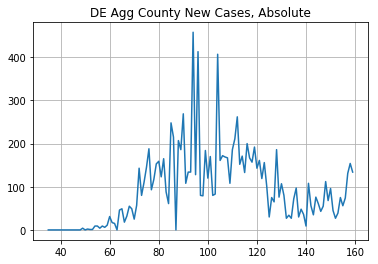

DE is a do-gooder


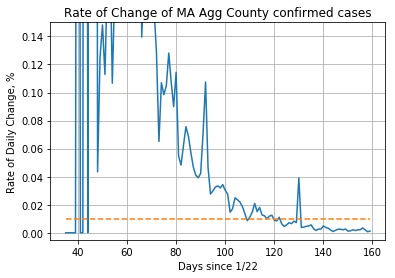

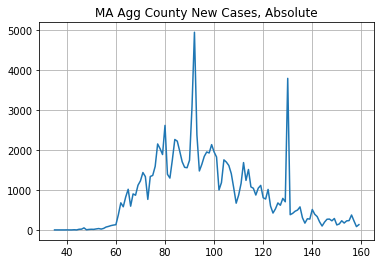

MA is a do-gooder


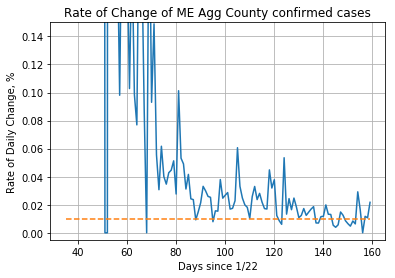

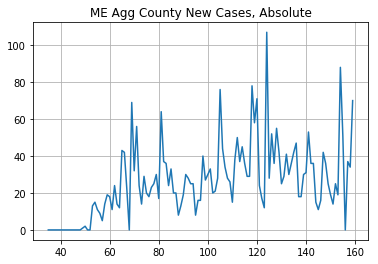

ME is a fuckup


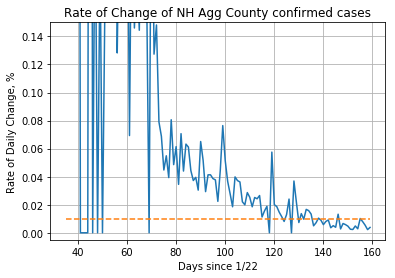

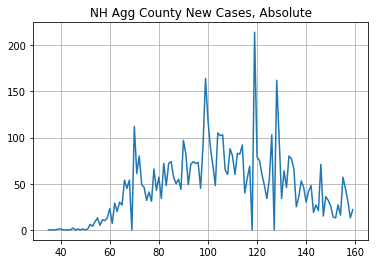

NH is a do-gooder


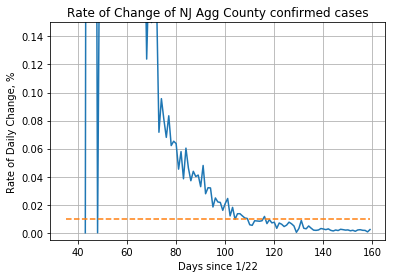

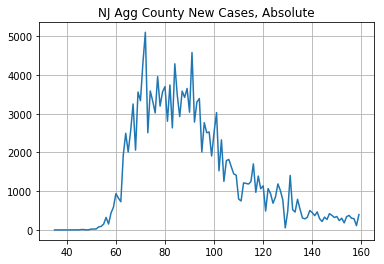

NJ is a do-gooder


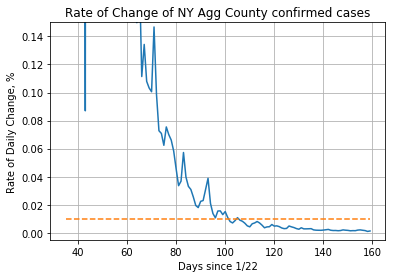

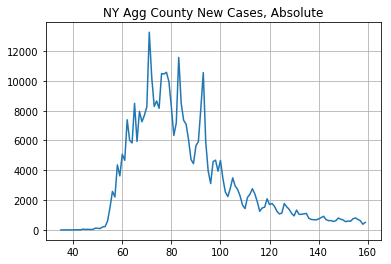

NY is a do-gooder


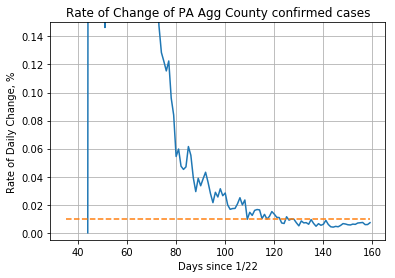

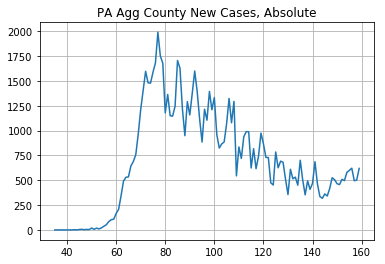

PA is a do-gooder


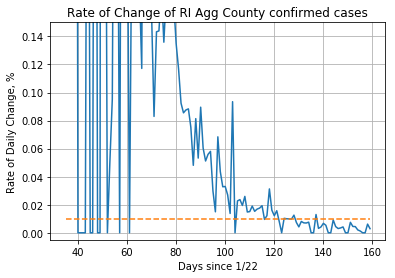

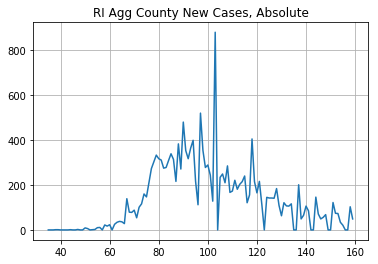

RI is a do-gooder


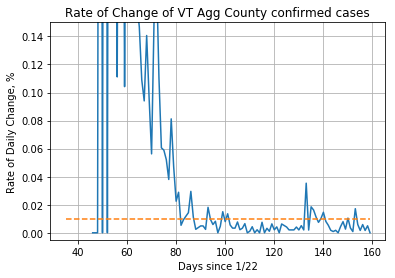

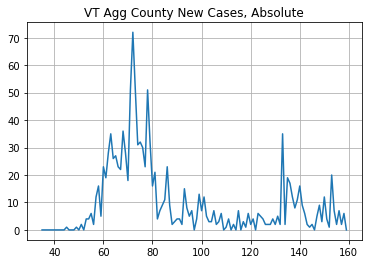

VT is a do-gooder


In [83]:

def create_classes(state_list):
    d_states = {"good": [], "bad": [], "neutral": [], "k_good": [], "k_bad": [], }


    d_ratios = {"neg_diff": [], "pos_diff": [], "neg": [], "pos": [], "neutral_diff": [], "neutral": [], }


    for state in state_list:
        y = single_state(state)
        new_col = [x[1].sum() for x in y.iterrows()]
        df['{}_agg'.format(state)] = new_col
        x = create_roc_and_new_case_numbers(df['{}_agg'.format(state)], '{} Agg'.format(state))
        first_pptn = 0.1
        thresh_date = x[0]['{}_agg'.format(state)][x[0]['{}_agg'.format(state)] > x[0]['{}_agg'.format(state)].iloc[-1] * first_pptn].index[0]
        thresh_idx = list(df.index).index(thresh_date)
        mid = thresh_idx + (df.shape[0] - thresh_idx) // 2
        lHalf = x[1][thresh_idx:mid].sum()
        rHalf = x[1][mid:].sum()

        
        if abs(rHalf - lHalf) < x[1][61:].sum() * .05:
            print("{} is neutral".format(state))
            d_states['neutral'].append(state)
            d_ratios['neutral_diff'].append(abs(lHalf - rHalf))
            if lHalf > rHalf:
                d_ratios['neutral'].append(lHalf / rHalf)
            else:
                d_ratios['neutral'].append(rHalf / lHalf.sum())
        elif rHalf > x[1][61:midpoint].sum():
#             if np.percentile(np.array(all_ratios2), 50) < rHalf / lHalf:
            if True:
                print("{} is a fuckup".format(state))
                d_states['bad'].append(state)
                d_ratios['neg_diff'].append(rHalf - lHalf)
                d_ratios['neg'].append(rHalf / lHalf)
            else:
                print("{} is kinda bad".format(state))
                d_states['k_bad'].append(state)
                d_ratios['neg_diff'].append(rHalf - lHalf)
                d_ratios['neg'].append(rHalf / lHalf)
        else:
#             if np.percentile(np.array(all_ratios2), 50) < lHalf / rHalf:
            if True:
                print("{} is a do-gooder".format(state))
                d_states['good'].append(state)
                d_ratios['pos_diff'].append(lHalf - rHalf)
                d_ratios['pos'].append(lHalf / rHalf)
            else:
                print("{} is kinda good".format(state))
                d_states['k_good'].append(state)
                d_ratios['pos_diff'].append(lHalf - rHalf)
                d_ratios['pos'].append(lHalf / rHalf)
    return d_states, d_ratios

d1, d2 = create_classes(state_list)

In [102]:
d2

{'neg_diff': [46938,
  66210,
  4252,
  2318,
  72237,
  1950,
  8505,
  184,
  508,
  6103,
  4727,
  2156,
  73192,
  10683,
  4798,
  17809,
  13692,
  9859,
  20166,
  23126,
  346],
 'pos_diff': [7192,
  7428,
  42551,
  22649,
  650,
  1213,
  4989,
  2074,
  3244,
  6868,
  3715,
  -246,
  12533,
  23409,
  3444,
  3669,
  53486,
  902,
  99815,
  247931,
  29478,
  8187,
  531],
 'neg': [4.860667873005428,
  2.721081362100338,
  2.0579746205523763,
  1.8522058823529413,
  2.072640879055609,
  2.1149228130360207,
  2.4775886031966645,
  1.5364431486880465,
  2.2300242130750605,
  2.173653846153846,
  1.4491638160395286,
  1.2505811250581125,
  3.303663603172605,
  3.7273423538422263,
  1.487899125483018,
  1.6457683660889115,
  2.342221350847956,
  1.6958639186900057,
  4.2338037203335475,
  2.3266406608536028,
  1.2657450076804915],
 'pos': [1.6484537011991705,
  1.612871287128713,
  1.9947632963179427,
  2.1194088864725944,
  1.5,
  1.5029021558872304,
  1.8380648412565093,
  

In [84]:
all_ratios2 = d2['pos']
all_ratios2.extend(d2['neg'])
all_ratios2.extend(d2['neutral'])


c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in longlong_scalars
  import sys
c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in longlong_scalars
  import sys


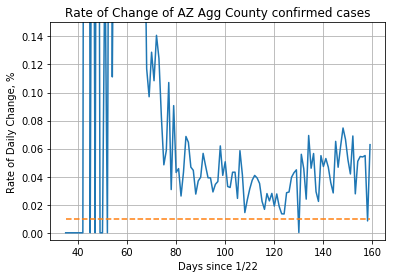

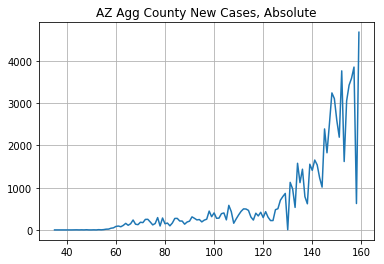

AZ is a fuckup


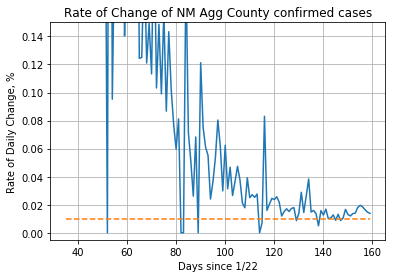

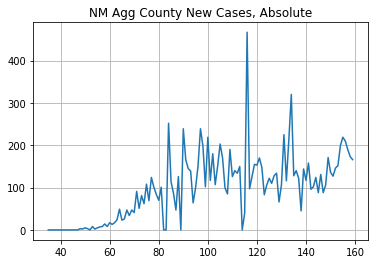

NM is neutral


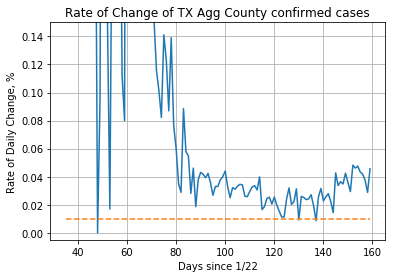

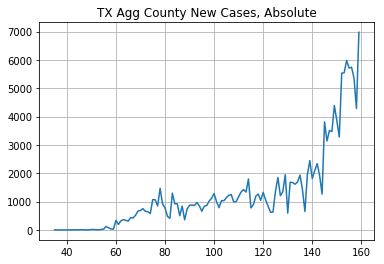

TX is a fuckup


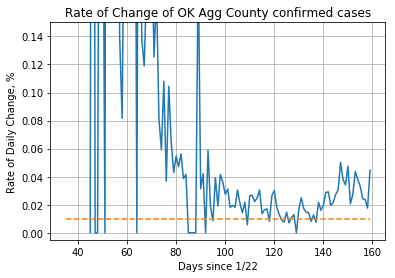

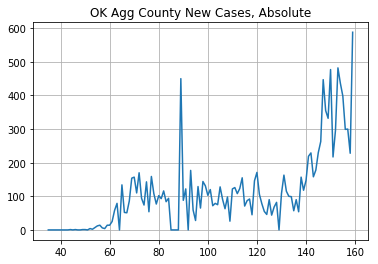

OK is a fuckup


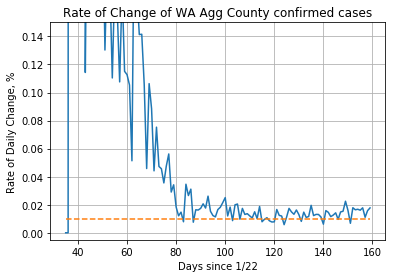

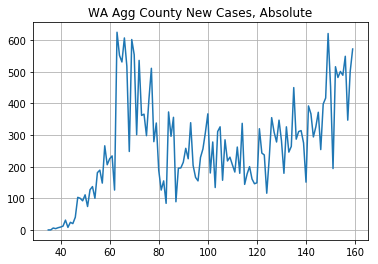

WA is neutral


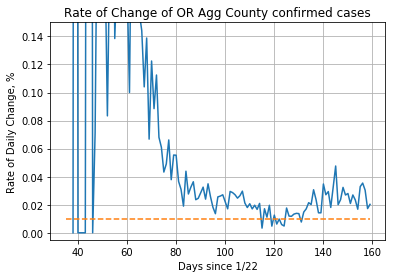

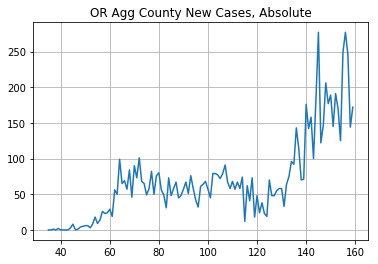

OR is kinda bad


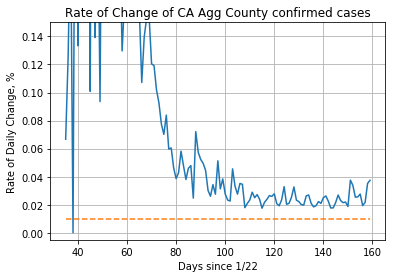

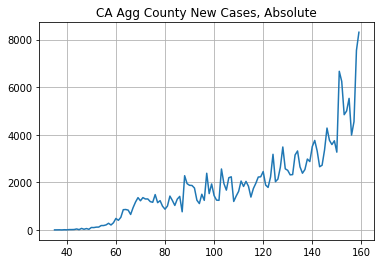

CA is a fuckup


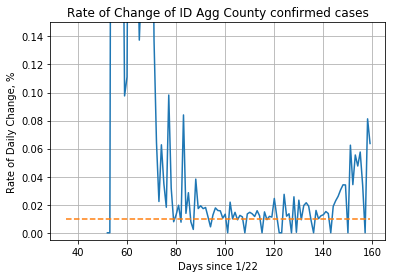

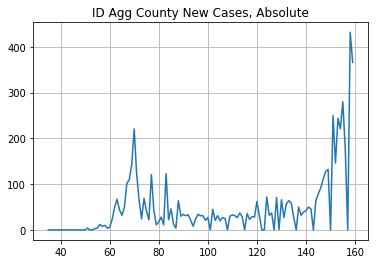

ID is a fuckup


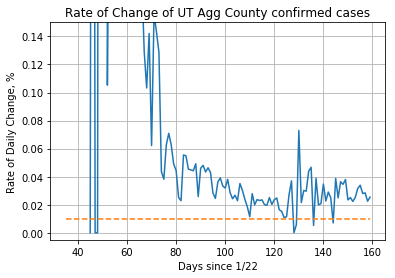

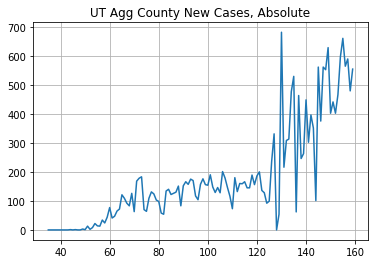

UT is a fuckup


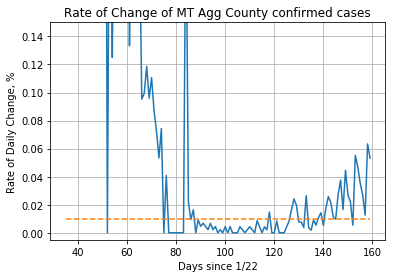

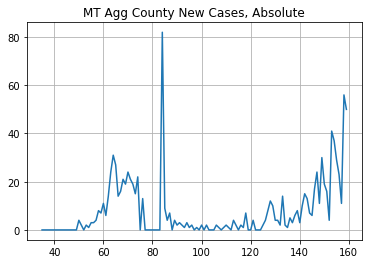

MT is kinda bad


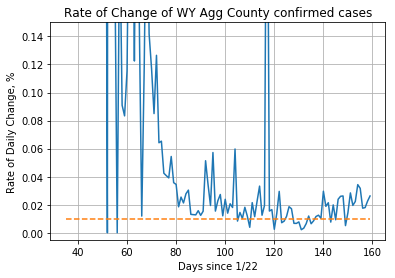

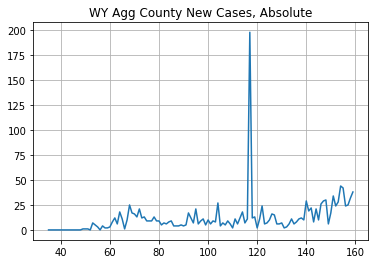

WY is a fuckup


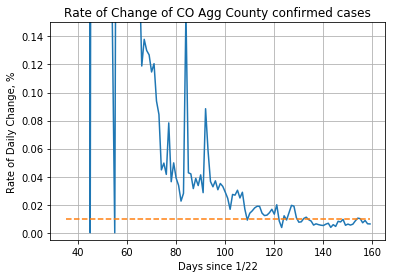

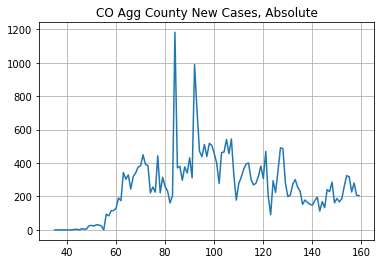

CO is kinda good


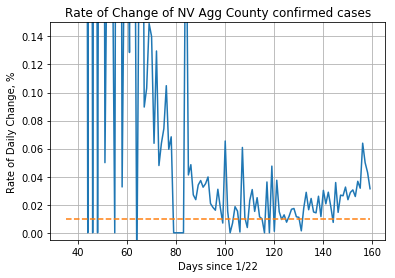

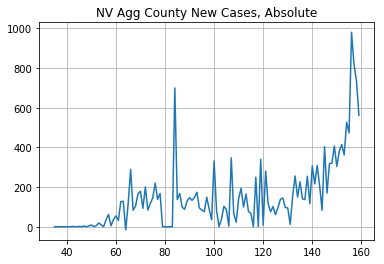

NV is a fuckup


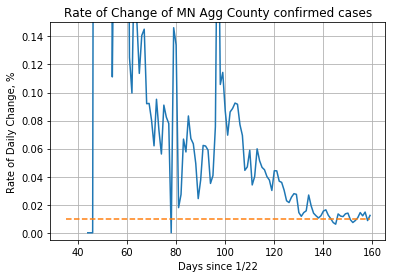

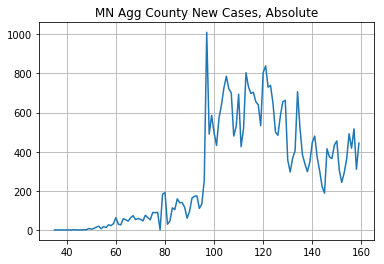

MN is kinda good


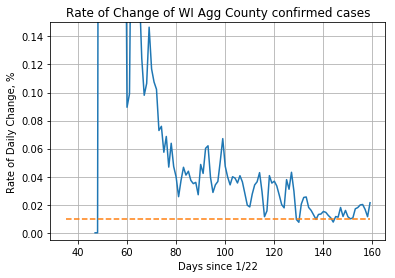

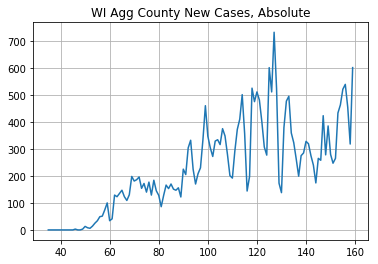

WI is kinda bad


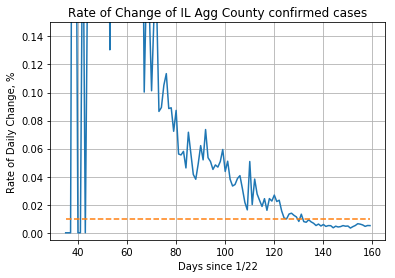

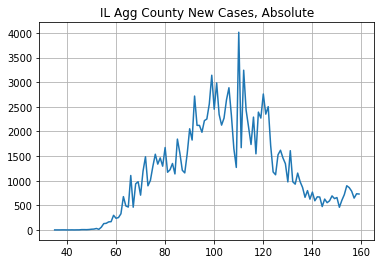

IL is a do-gooder


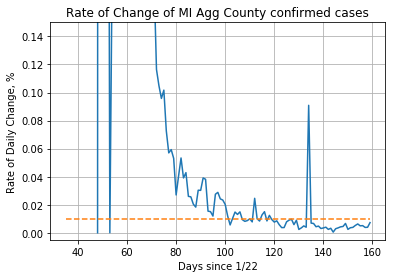

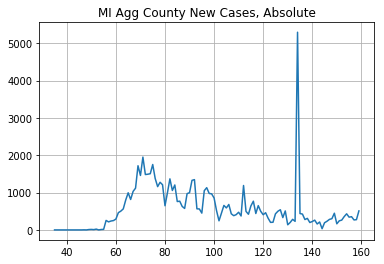

MI is a do-gooder


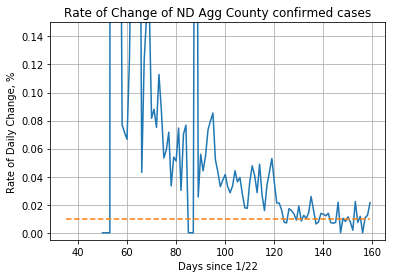

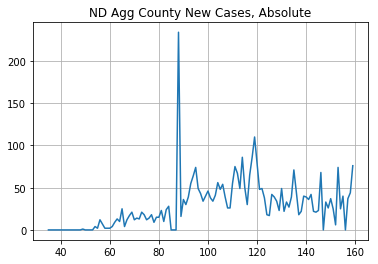

ND is kinda good


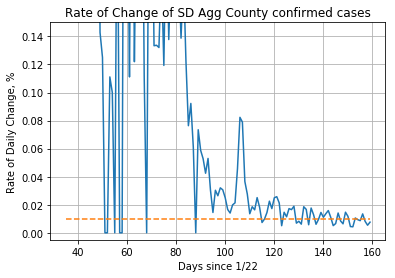

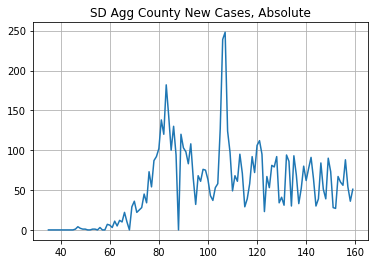

SD is kinda good


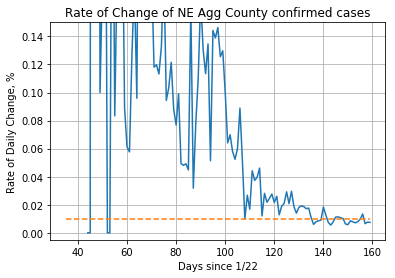

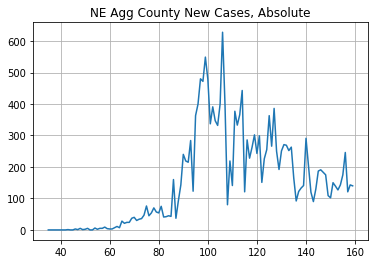

NE is kinda good


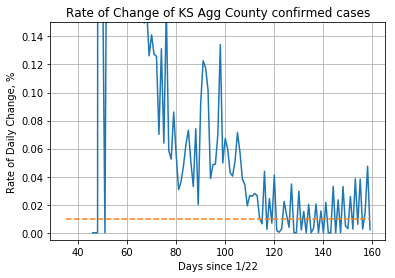

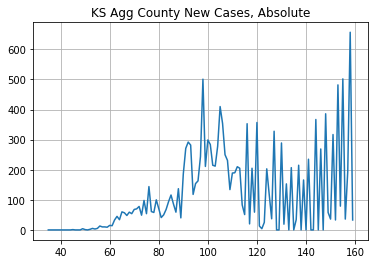

KS is kinda good


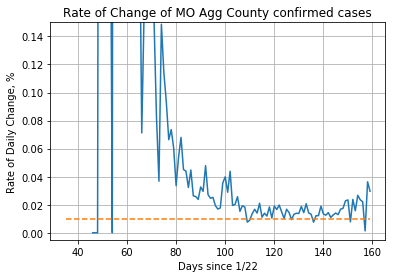

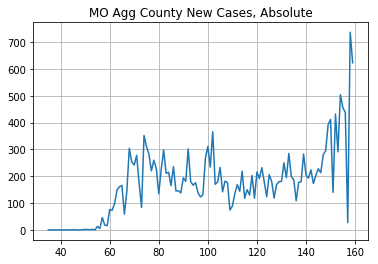

MO is kinda bad


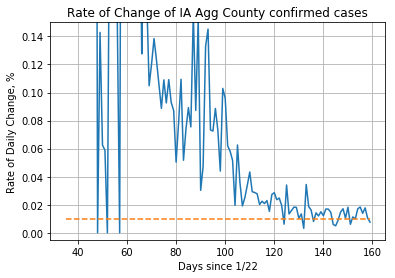

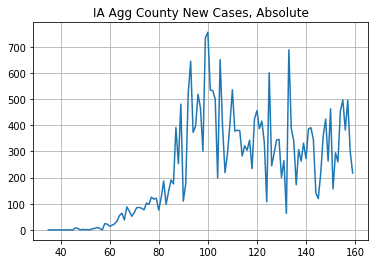

IA is kinda good


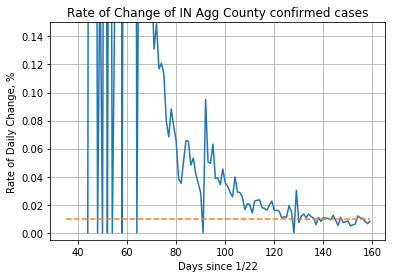

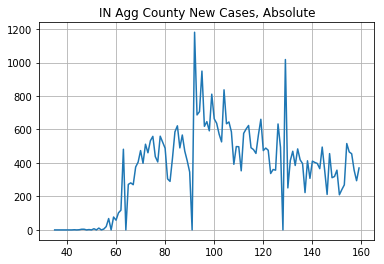

IN is kinda good


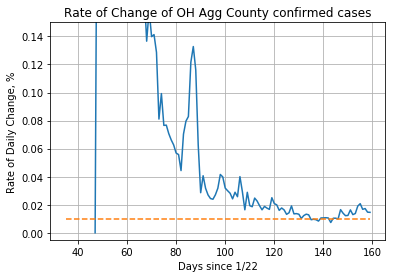

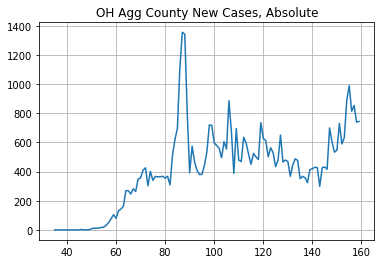

OH is neutral


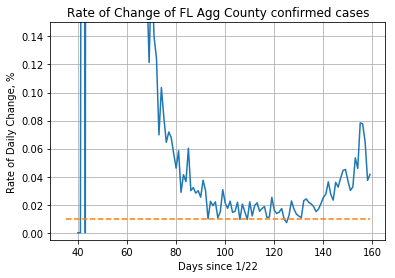

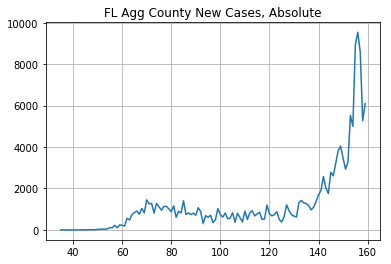

FL is a fuckup


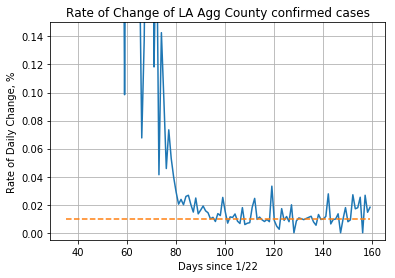

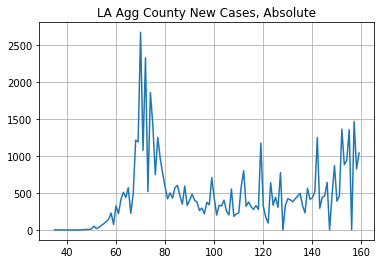

LA is kinda good


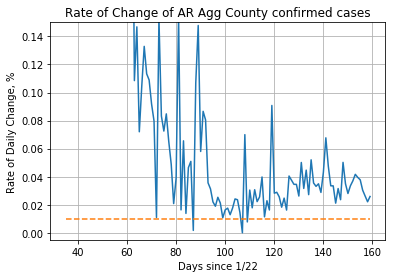

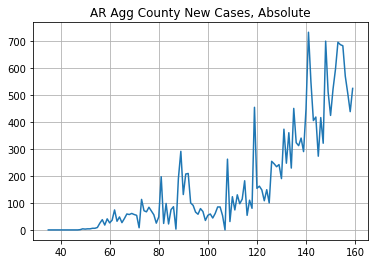

AR is a fuckup


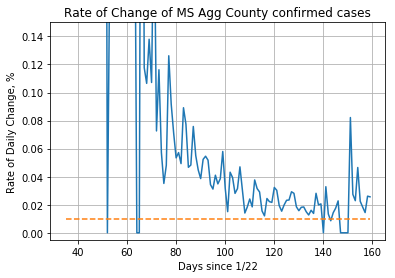

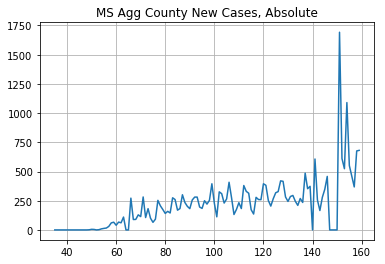

MS is kinda bad


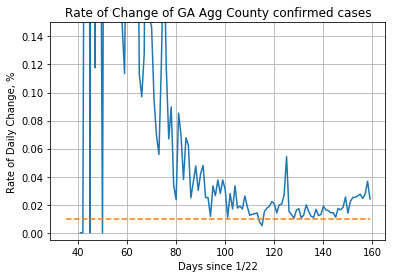

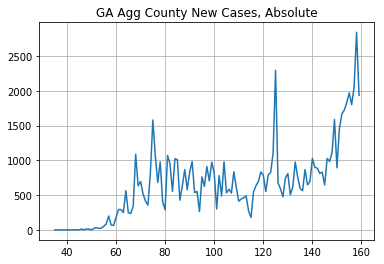

GA is kinda bad


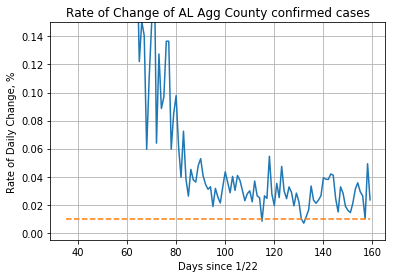

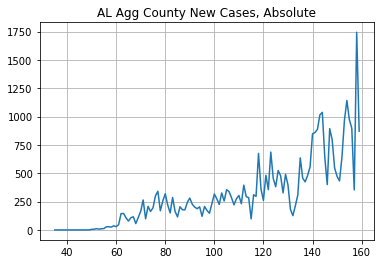

AL is a fuckup


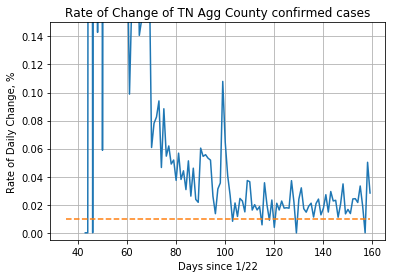

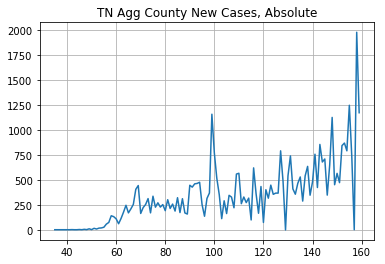

TN is kinda bad


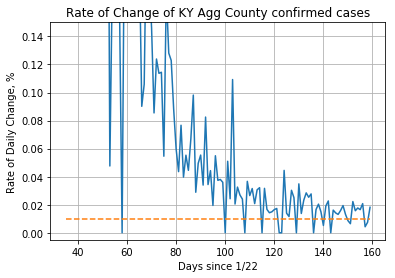

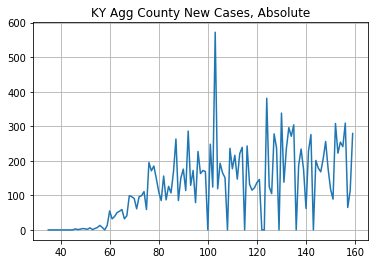

KY is neutral


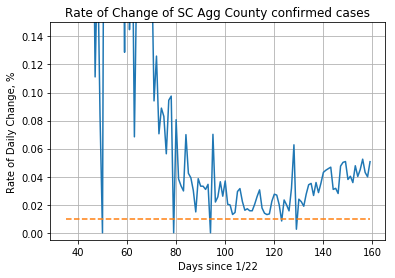

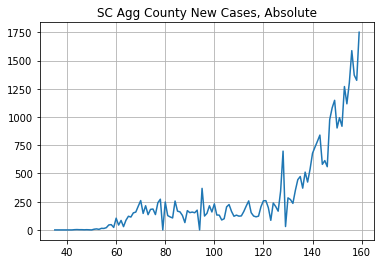

SC is a fuckup


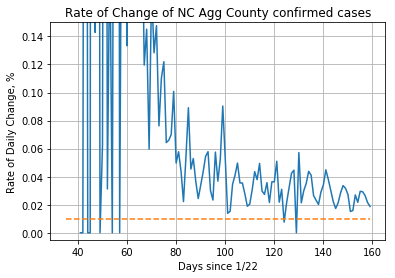

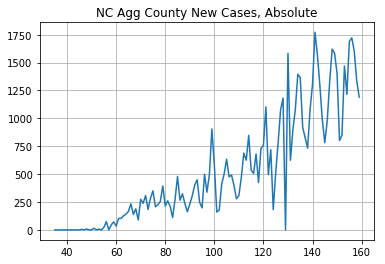

NC is a fuckup


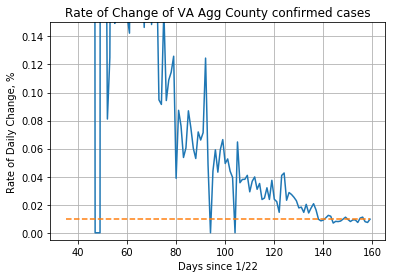

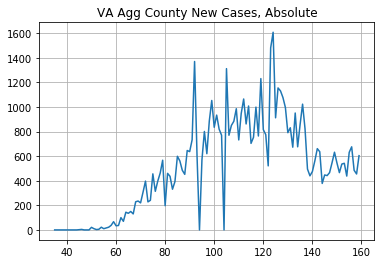

VA is neutral


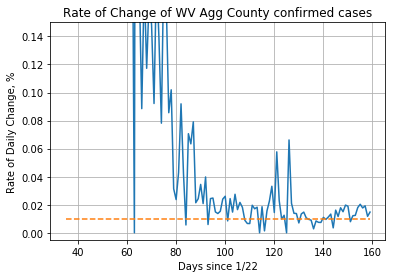

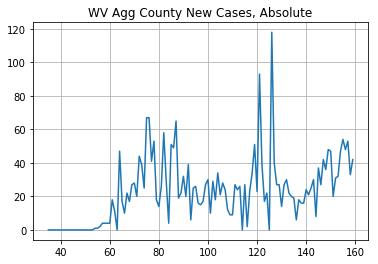

WV is kinda good


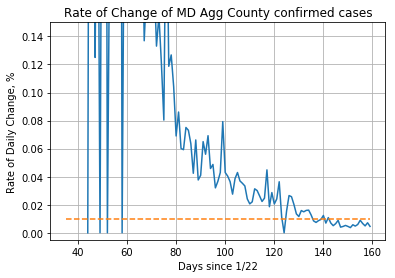

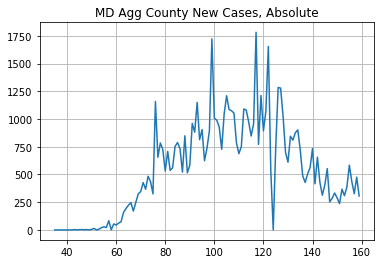

MD is kinda good


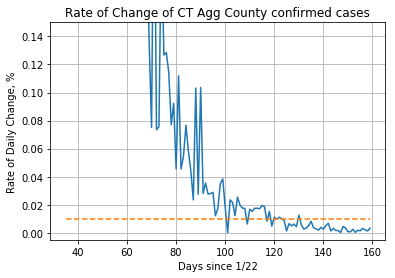

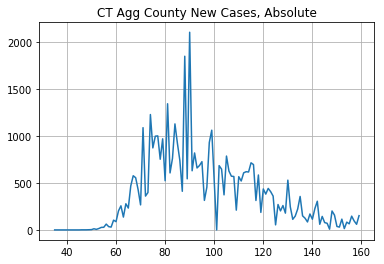

CT is a do-gooder


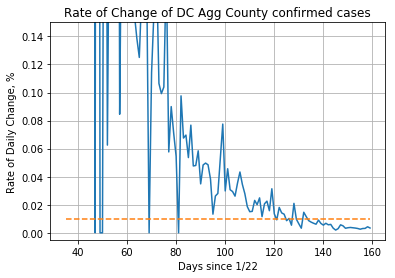

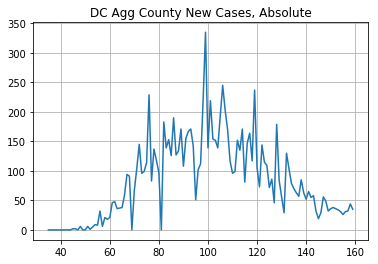

DC is a do-gooder


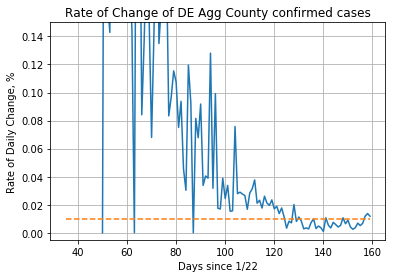

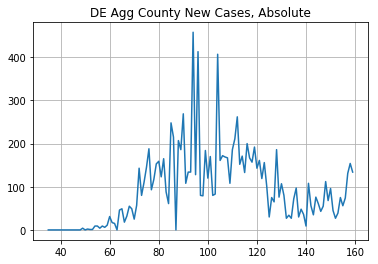

DE is a do-gooder


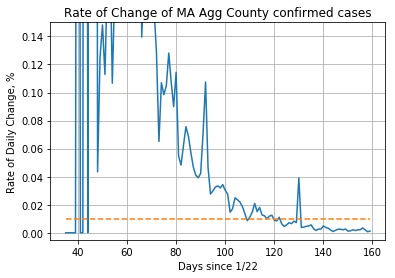

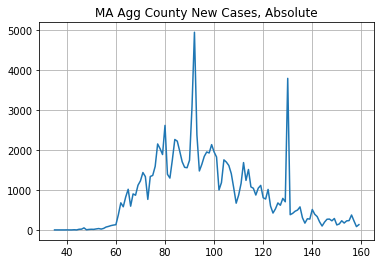

MA is a do-gooder


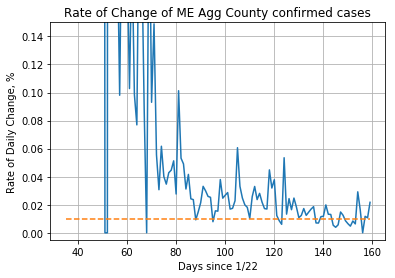

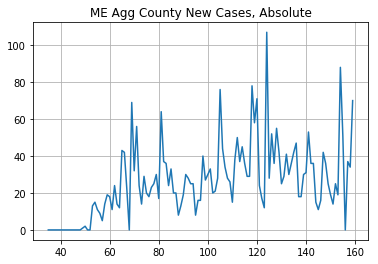

ME is kinda bad


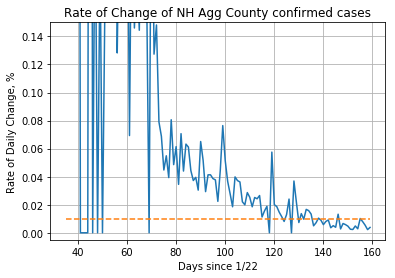

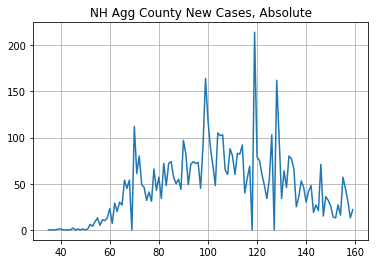

NH is kinda good


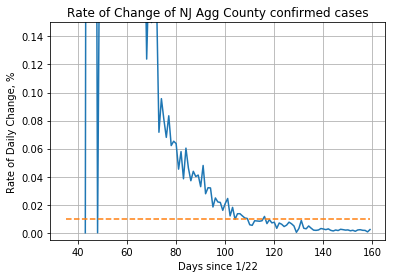

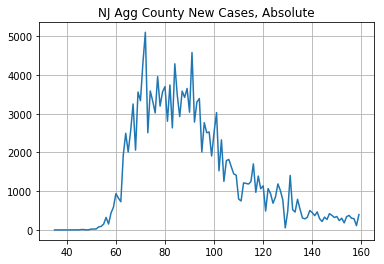

NJ is a do-gooder


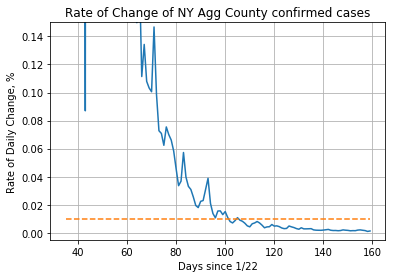

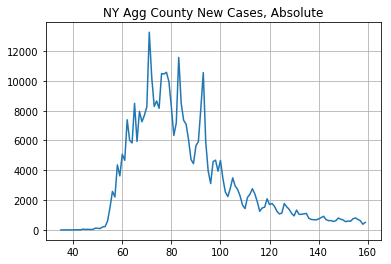

NY is a do-gooder


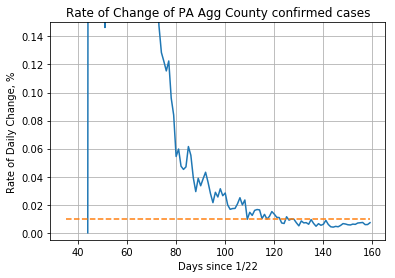

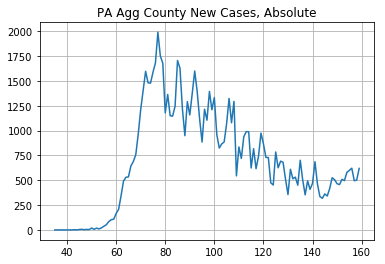

PA is a do-gooder


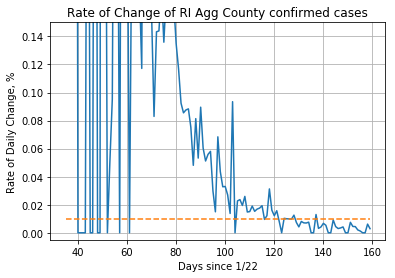

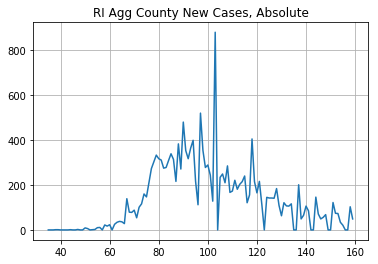

RI is a do-gooder


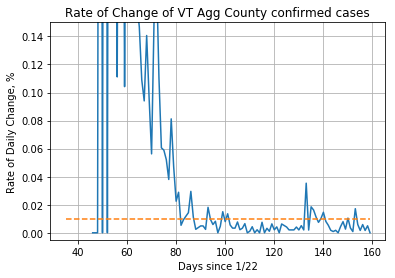

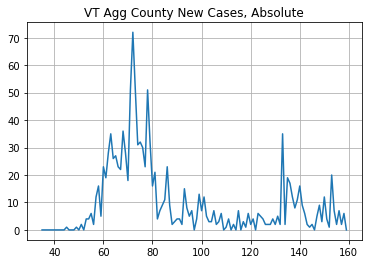

VT is a do-gooder


In [85]:

def create_classes(state_list):
    d_states = {"good": [], "bad": [], "neutral": [], "k_good": [], "k_bad": [], }


    d_ratios = {"neg_diff": [], "pos_diff": [], "neg": [], "pos": [], "neutral_diff": [], "neutral": [], }


    for state in state_list:
        y = single_state(state)
        new_col = [x[1].sum() for x in y.iterrows()]
        df['{}_agg'.format(state)] = new_col
        x = create_roc_and_new_case_numbers(df['{}_agg'.format(state)], '{} Agg'.format(state))
        first_pptn = 0.1
        thresh_date = x[0]['{}_agg'.format(state)][x[0]['{}_agg'.format(state)] > x[0]['{}_agg'.format(state)].iloc[-1] * first_pptn].index[0]
        thresh_idx = list(df.index).index(thresh_date)
        mid = thresh_idx + (df.shape[0] - thresh_idx) // 2
        lHalf = x[1][thresh_idx:mid].sum()
        rHalf = x[1][mid:].sum()

        
        if abs(rHalf - lHalf) < x[1][61:].sum() * .05:
            print("{} is neutral".format(state))
            d_states['neutral'].append(state)
            d_ratios['neutral_diff'].append(abs(lHalf - rHalf))
            if lHalf > rHalf:
                d_ratios['neutral'].append(lHalf / rHalf)
            else:
                d_ratios['neutral'].append(rHalf / lHalf.sum())
        elif rHalf > x[1][61:midpoint].sum():
            if np.percentile(np.array(all_ratios2), 50) < rHalf / lHalf:
    #         if True:
                print("{} is a fuckup".format(state))
                d_states['bad'].append(state)
                d_ratios['neg_diff'].append(rHalf - lHalf)
                d_ratios['neg'].append(rHalf / lHalf)
            else:
                print("{} is kinda bad".format(state))
                d_states['k_bad'].append(state)
                d_ratios['neg_diff'].append(rHalf - lHalf)
                d_ratios['neg'].append(rHalf / lHalf)
        else:
            if np.percentile(np.array(all_ratios2), 50) < lHalf / rHalf:
    #         if True:
                print("{} is a do-gooder".format(state))
                d_states['good'].append(state)
                d_ratios['pos_diff'].append(lHalf - rHalf)
                d_ratios['pos'].append(lHalf / rHalf)
            else:
                print("{} is kinda good".format(state))
                d_states['k_good'].append(state)
                d_ratios['pos_diff'].append(lHalf - rHalf)
                d_ratios['pos'].append(lHalf / rHalf)
    return d_states, d_ratios

d1, d2 = create_classes(state_list)

In [86]:
all_ratios2 = d2['pos']
all_ratios2.extend(d2['neg'])
all_ratios2.extend(d2['neutral'])

# states_dict = {'good': ['MN','IL',
#    'MI','NE','KS','CT','DC','DE','MA','NJ','NY','PA','RI','VT'],
#   'bad': ['AZ', 'TX', 'CA', 'UT', 'WY', 'FL', 'AR', 'AL', 'SC', 
#           'NC'],
#   'neutral': ['NM', 'WA', 'MO', 'KY', 'VA', 'WV'],
#   'k_good': ['ID', 'MT', 'CO', 'ND', 'SD', 'IA', 'IN', 'OH', 
#              'LA', 'MD', 'NH'],
#   'k_bad': ['OK', 'OR', 'NV', 'WI', 'MS', 'GA', 'TN', 'ME']}
states_dict = d1
d1, d2

({'good': ['IL', 'MI', 'CT', 'DC', 'DE', 'MA', 'NJ', 'NY', 'PA', 'RI', 'VT'],
  'bad': ['AZ',
   'TX',
   'OK',
   'CA',
   'ID',
   'UT',
   'WY',
   'NV',
   'FL',
   'AR',
   'AL',
   'SC',
   'NC'],
  'neutral': ['NM', 'WA', 'OH', 'KY', 'VA'],
  'k_good': ['CO',
   'MN',
   'ND',
   'SD',
   'NE',
   'KS',
   'IA',
   'IN',
   'LA',
   'WV',
   'MD',
   'NH'],
  'k_bad': ['OR', 'MT', 'WI', 'MO', 'MS', 'GA', 'TN', 'ME']},
 {'neg_diff': [46938,
   66210,
   4252,
   2318,
   72237,
   1950,
   8505,
   184,
   508,
   6103,
   4727,
   2156,
   73192,
   10683,
   4798,
   17809,
   13692,
   9859,
   20166,
   23126,
   346],
  'pos_diff': [7192,
   7428,
   42551,
   22649,
   650,
   1213,
   4989,
   2074,
   3244,
   6868,
   3715,
   -246,
   12533,
   23409,
   3444,
   3669,
   53486,
   902,
   99815,
   247931,
   29478,
   8187,
   531],
  'neg': [4.860667873005428,
   2.721081362100338,
   2.0579746205523763,
   1.8522058823529413,
   2.072640879055609,
   2.1149228130360

c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in longlong_scalars
  import sys
c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in longlong_scalars
  import sys


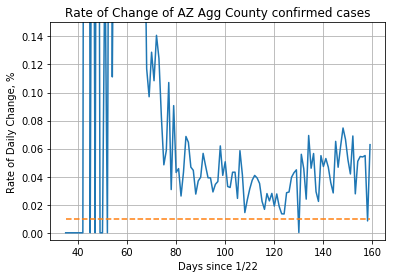

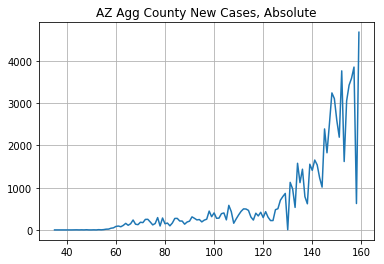

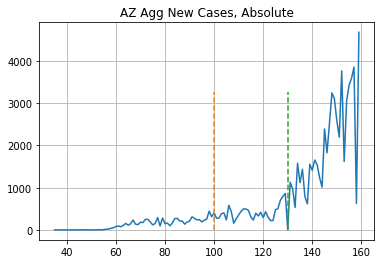

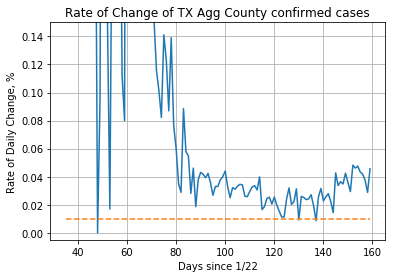

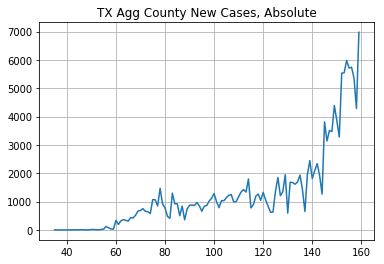

...

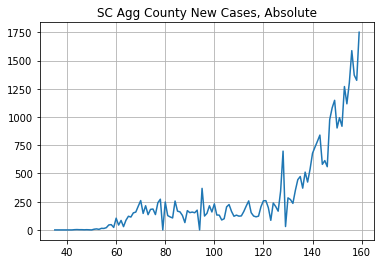

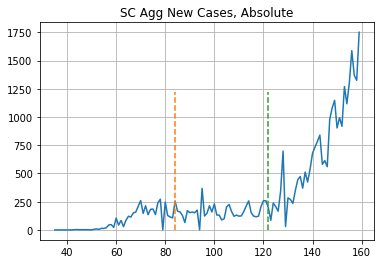

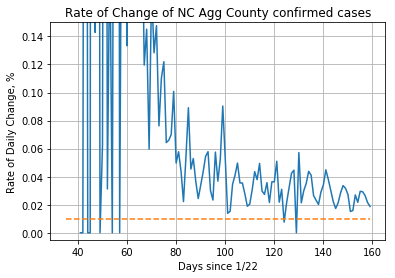

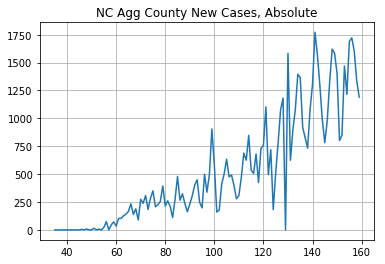

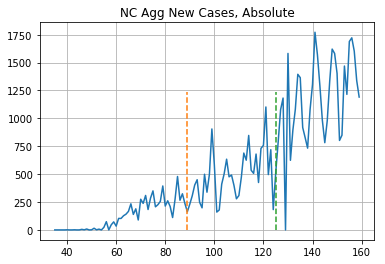

In [87]:

for state in d1['bad']:
    plt.close()
    y = single_state(state)
    new_col = [x[1].sum() for x in y.iterrows()]
    df['{}_agg'.format(state)] = new_col
    x = create_roc_and_new_case_numbers(df['{}_agg'.format(state)], '{} Agg'.format(state))
    initial_pptn = 0.1
    thresh_date = x[0]['{}_agg'.format(state)][x[0]['{}_agg'.format(state)] > x[0]['{}_agg'.format(state)].iloc[-1] * initial_pptn].index[0]
    thresh_idx = list(df.index).index(thresh_date)
    mid = thresh_idx + (df.shape[0] - thresh_idx) // 2
    mid
    lHalf = x[1][thresh_idx:mid].sum()
    rHalf = x[1][mid:].sum()
    # print(rHalf)
    # print(lHalf)
    create_new_case_graphs(df['{}_agg'.format(state)], '{} Agg'.format(state))
    plt.plot([thresh_idx, thresh_idx], [0, np.max(x[1])*.7], linestyle='dashed')
    plt.plot([mid, mid], [0, np.max(x[1])*.7], linestyle='dashed')
    plt.show()

Good: CO - hovering around 200 daily, population 5.759 M
    IL - hovering around ~700 daily, population 12.67 M
    MI - hovering around ~400 daily, population 9.987 M
    NE - hovering around 200 daily, population 1.934 M
    CT - hovering around ~200 daily, population 3.565 M
    

Exceptions: WY, not actually bad,
            MN, started late, got bad fast, looks downward trending, but somehow k_bad class
            

['IL', 'MI', 'CT', 'DC', 'DE', 'MA', 'NJ', 'NY', 'PA', 'RI', 'VT']


c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in longlong_scalars
  import sys
c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in longlong_scalars
  import sys


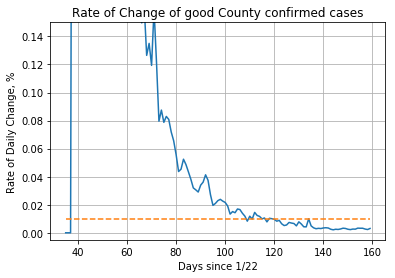

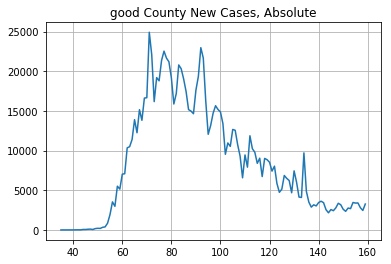


['AZ', 'TX', 'OK', 'CA', 'ID', 'UT', 'WY', 'NV', 'FL', 'AR', 'AL', 'SC', 'NC']


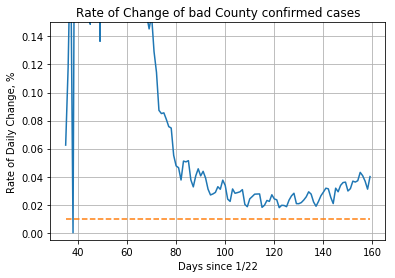

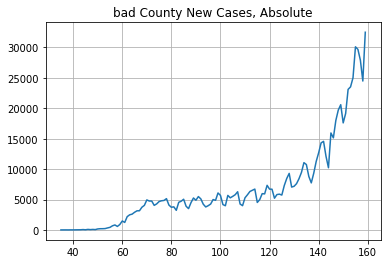


['NM', 'WA', 'OH', 'KY', 'VA']


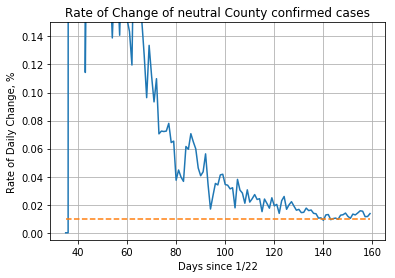

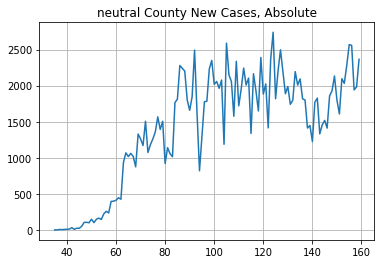


['CO', 'MN', 'ND', 'SD', 'NE', 'KS', 'IA', 'IN', 'LA', 'WV', 'MD', 'NH']


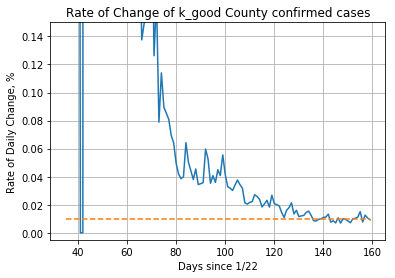

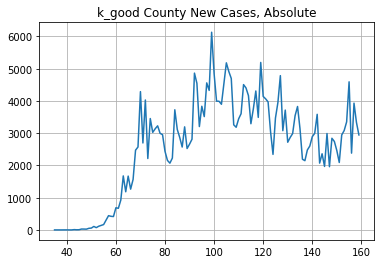


['OR', 'MT', 'WI', 'MO', 'MS', 'GA', 'TN', 'ME']


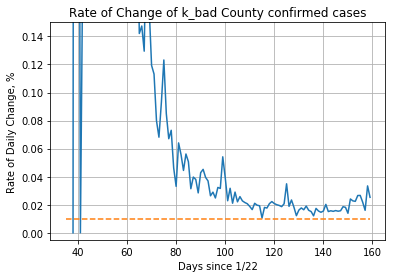

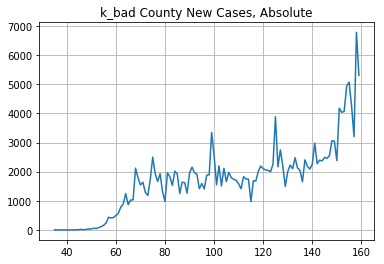

In [88]:
for i, who in enumerate(d1.keys()):
    who = d1[who]
    y = aggregate_region(who)
    new_col = [x[1].sum() for x in y.iterrows()]
    name = list(d1.keys())[i]
    df[name] = new_col
    print(who)
    create_roc_and_new_case_numbers(df[name], name)
    print()

['CA', 'NM', 'IL', 'MI', 'VA', 'MD', 'DE', 'NY', 'MA', 'RI', 'ME']


c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in longlong_scalars
  import sys
c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in longlong_scalars
  import sys


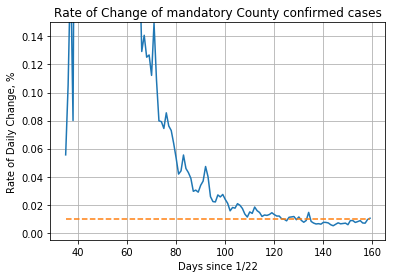

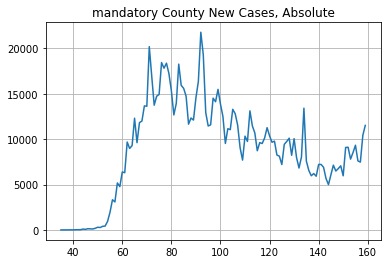


['AR', 'MS', 'TN', 'IN', 'NE', 'PA', 'NJ', 'CT', 'NH', 'WA', 'WY', 'DC']


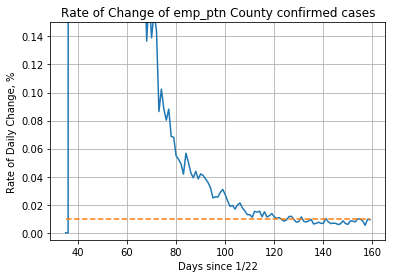

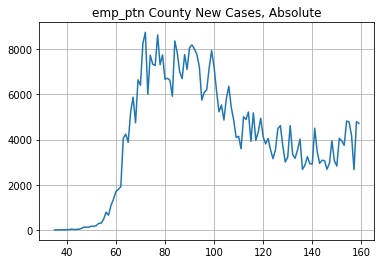


['OR', 'NV', 'CO', 'MN', 'LA', 'OH', 'KY', 'AL', 'GA', 'FL', 'VT']


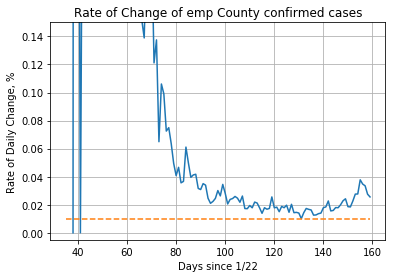

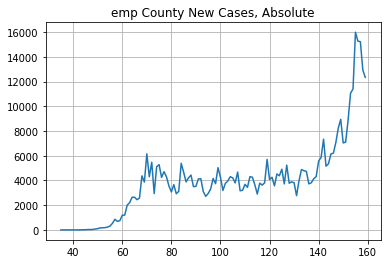


['ID', 'MT', 'UT', 'AZ', 'ND', 'SD', 'IA', 'WI', 'MO', 'KS', 'OK', 'TX', 'WV', 'NC', 'SC']


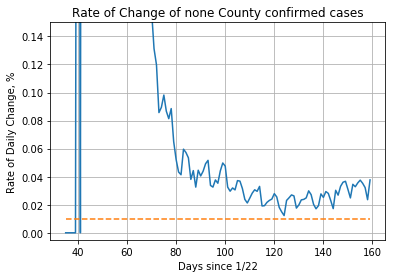

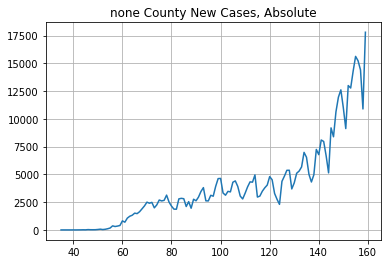

In [89]:
masks = {"mandatory": ["CA", "NM", "IL", "MI", "VA", "MD", "DE", "NY", "MA", "RI", "ME"],
    "emp_ptn": ['AR', 'MS', 'TN', 'IN', 'NE', 'PA', 'NJ', 'CT', 'NH', 'WA', 'WY', 'DC'],
    "emp": ['OR', 'NV', 'CO', 'MN', 'LA', 'OH', 'KY', 'AL', 'GA', 'FL', 'VT'],
    "none": ["ID", 'MT', 'UT', 'AZ', 'ND', 'SD', 'IA', 'WI', 'MO', 'KS', 'OK', 'TX', 'WV', 'NC', 'SC'] }

for i, who in enumerate(masks.keys()):
    who = masks[who]
    y = aggregate_region(who)
    new_col = [x[1].sum() for x in y.iterrows()]
    name = list(masks.keys())[i]
    df[name] = new_col
    print(who)
    create_roc_and_new_case_numbers(df[name], name)
    print()

In [90]:
cross_dict = {
    "good_strict": [], "bad_strict": [], "good_loose": [], "bad_loose": []
             }
# (0.11, 0.47, 0.22)

for dk in d1.keys():
    for m1 in masks.keys():
        match = False
        cross_section = set(d1[dk]) & set(masks[m1])
        if dk in ['good', 'k_good'] and m1 in ['mandatory', 'emp_ptn']:
            match = True
            cross_dict['good_strict'].extend([state for state in cross_section])
        elif dk in ['bad', 'k_bad'] and m1 in ['emp', 'none']:
            match = True
            cross_dict['bad_loose'].extend([state for state in cross_section])
        elif dk == 'neutral':
            match = True
        elif dk in ['good', 'k_good']:
            cross_dict['good_loose'].extend([state for state in cross_section])
        elif dk in ['bad', 'k_bad']:
            cross_dict['bad_strict'].extend([state for state in cross_section])
        print("Intersection:", match, dk, m1, cross_section )

print()
print(cross_dict)

Intersection: True good mandatory {'MI', 'DE', 'IL', 'MA', 'RI', 'NY'}
Intersection: True good emp_ptn {'DC', 'CT', 'NJ', 'PA'}
Intersection: False good emp {'VT'}
Intersection: False good none set()
Intersection: False bad mandatory {'CA'}
Intersection: False bad emp_ptn {'WY', 'AR'}
Intersection: True bad emp {'FL', 'AL', 'NV'}
Intersection: True bad none {'ID', 'UT', 'AZ', 'SC', 'TX', 'NC', 'OK'}
Intersection: True neutral mandatory {'NM', 'VA'}
Intersection: True neutral emp_ptn {'WA'}
Intersection: True neutral emp {'KY', 'OH'}
Intersection: True neutral none set()
Intersection: True k_good mandatory {'MD'}
Intersection: True k_good emp_ptn {'NE', 'IN', 'NH'}
Intersection: False k_good emp {'MN', 'CO', 'LA'}
Intersection: False k_good none {'IA', 'SD', 'WV', 'ND', 'KS'}
Intersection: False k_bad mandatory {'ME'}
Intersection: False k_bad emp_ptn {'MS', 'TN'}
Intersection: True k_bad emp {'OR', 'GA'}
Intersection: True k_bad none {'WI', 'MO', 'MT'}

{'good_strict': ['MI', 'DE', 'IL

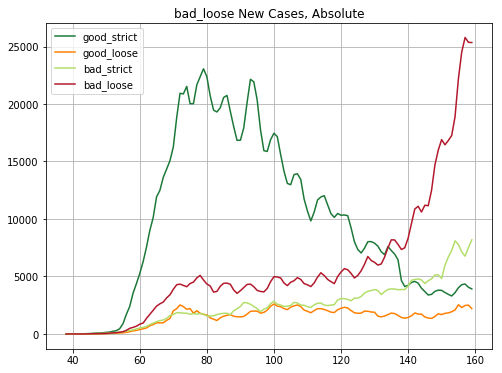

In [91]:
def normalize(data):
    return (data - np.min(data)) / (np.max(data) - np.min(data))

def create_new_case_graphs_colored(col, name, color):
    new = col
    new_new_cases = new.values[1:] - new.values[:-1]

    # print(mchenry)
    smoothing_factor = 4
#     plt.plot(np.arange(35, len(new_new_cases)), normalize(pd.Series(new_new_cases[35:]).rolling(smoothing_factor).mean()), color=color, label=name)
    plt.plot(np.arange(35, len(new_new_cases)), (pd.Series(new_new_cases[35:]).rolling(smoothing_factor).mean()), color=color, label=name)
    plt.title("{} New Cases, Absolute".format(name))
    plt.grid()

plt.figure(figsize=(8, 6))
    
y = aggregate_region(cross_dict['good_strict'])
new_col = [x[1].sum() for x in y.iterrows()]
df['good_strict'] = new_col
create_new_case_graphs_colored(df['good_strict'], 'good_strict', (0.11, 0.47, 0.22))

y = aggregate_region(cross_dict['good_loose'])
new_col = [x[1].sum() for x in y.iterrows()]
df['good_loose'] = new_col
create_new_case_graphs_colored(df['good_loose'], 'good_loose', (1.0, 0.5, 0.0))

y = aggregate_region(cross_dict['bad_strict'])
new_col = [x[1].sum() for x in y.iterrows()]
df['bad_strict'] = new_col
create_new_case_graphs_colored(df['bad_strict'], 'bad_strict', (0.7, 0.87, 0.41))

y = aggregate_region(cross_dict['bad_loose'])
new_col = [x[1].sum() for x in y.iterrows()]
df['bad_loose'] = new_col
create_new_case_graphs_colored(df['bad_loose'], 'bad_loose', (0.7, 0.09, 0.17))

plt.grid()
plt.legend(loc=2)

## Recreate graphs based on population

In [92]:
filepath = "C:\\Users\\Thalo\\Downloads\\covid_county_population_usafacts.csv"
df3 = pd.read_csv(filepath)

df3 = df3.set_index("County Name").T
df3.drop(["countyFIPS"], inplace=True)

df3.drop("Statewide Unallocated", axis=1, inplace=True)

# df / df3
# Wade Hampton Census Area
# Grand Princess Cruise Ship
# New York City Unallocated
unpopulated = ["Wade Hampton Census Area", "Grand Princess Cruise Ship", "New York City Unallocated"]
df3.drop(unpopulated, axis=1, inplace=True)

df5 = df3.T
for key in cross_dict.keys():
    df5[key] = df5['State'].isin(cross_dict[key])

# df5[df5.good_loose]
state_pops = df5.groupby('State')['population'].sum()


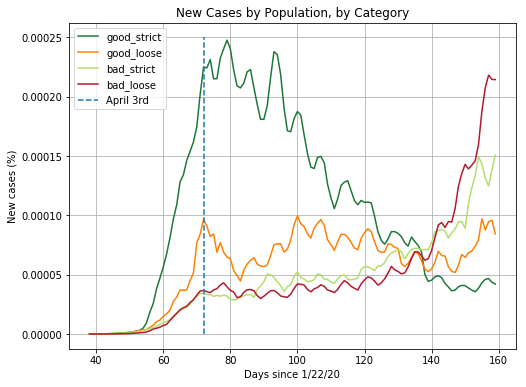

In [93]:
state_pops.loc[cross_dict['good_strict']].sum()

plt.figure(figsize=(8, 6))
    
y = aggregate_region(cross_dict['good_strict'])
new_col = [x[1].sum() / state_pops.loc[cross_dict['good_strict']].sum() for x in y.iterrows()]
df['good_strict'] = new_col
create_new_case_graphs_colored(df['good_strict'], 'good_strict', (0.11, 0.47, 0.22))

y = aggregate_region(cross_dict['good_loose'])
new_col = [x[1].sum() / state_pops.loc[cross_dict['good_loose']].sum() for x in y.iterrows()]
df['good_loose'] = new_col
create_new_case_graphs_colored(df['good_loose'], 'good_loose', (1.0, 0.5, 0.0))

y = aggregate_region(cross_dict['bad_strict'])
new_col = [x[1].sum() / state_pops.loc[cross_dict['bad_strict']].sum() for x in y.iterrows()]
df['bad_strict'] = new_col
create_new_case_graphs_colored(df['bad_strict'], 'bad_strict', (0.7, 0.87, 0.41))

y = aggregate_region(cross_dict['bad_loose'])
new_col = [x[1].sum() / state_pops.loc[cross_dict['bad_loose']].sum() for x in y.iterrows()]
df['bad_loose'] = new_col
create_new_case_graphs_colored(df['bad_loose'], 'bad_loose', (0.7, 0.09, 0.17))

plt.grid()
plt.title("New Cases by Population, by Category")
plt.xlabel("Days since 1/22/20")
plt.ylabel("New cases (%)")
plt.plot([np.where(df.index == '4/3/20')[0][0], np.where(df.index == '4/3/20')[0][0]], [0, 0.00025], \
         linestyle='dashed', label="April 3rd")
plt.legend(loc=2)


good ['IL', 'MI', 'CT', 'DC', 'DE', 'MA', 'NJ', 'NY', 'PA', 'RI', 'VT']
bad ['AZ', 'TX', 'OK', 'CA', 'ID', 'UT', 'WY', 'NV', 'FL', 'AR', 'AL', 'SC', 'NC']
neutral ['NM', 'WA', 'OH', 'KY', 'VA']
k_good ['CO', 'MN', 'ND', 'SD', 'NE', 'KS', 'IA', 'IN', 'LA', 'WV', 'MD', 'NH']
k_bad ['OR', 'MT', 'WI', 'MO', 'MS', 'GA', 'TN', 'ME']



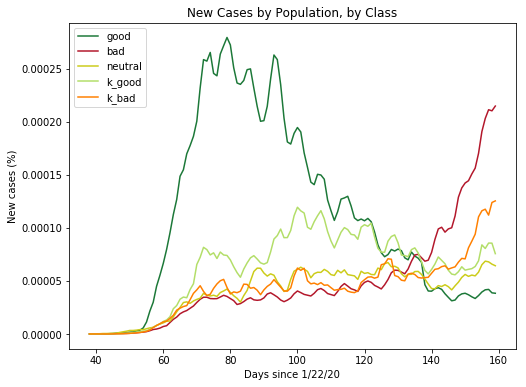

In [94]:
color_list = [(0.11, 0.47, 0.22), (0.7, 0.09, 0.17), (0.8, 0.8, 0.1), (0.7, 0.87, 0.41), (1.0, 0.5, 0.0)]
plt.figure(figsize=(8, 6))

for i, who in enumerate(d1.keys()):
    who = d1[who]
    y = aggregate_region(who)
    new_col = [x[1].sum() / state_pops.loc[who].sum() for x in y.iterrows()]
    name = list(d1.keys())[i]
    df[name] = new_col
    print(name, who)
    create_new_case_graphs_colored(df[name], name, color_list[i])
print()



plt.grid()
plt.title("New Cases by Population, by Class")
plt.xlabel("Days since 1/22/20")
plt.ylabel("New cases (%)")
# plt.plot([np.where(df.index == '4/3/2020')[0][0], np.where(df.index == '4/3/2020')[0][0]], [0, 0.00025], \
#          linestyle='dashed', label="April 3rd")
plt.legend(loc=2)


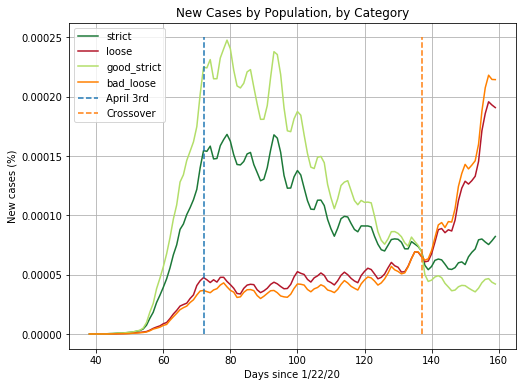

In [95]:
state_pops.loc[cross_dict['good_strict']].sum()

plt.figure(figsize=(8, 6))
    
y = aggregate_region(cross_dict['good_strict'] + cross_dict['bad_strict'])
new_col = [x[1].sum() / state_pops.loc[cross_dict['good_strict'] + cross_dict['bad_strict']].sum() for x in y.iterrows()]
df['strict'] = new_col
create_new_case_graphs_colored(df['strict'], 'strict', (0.11, 0.47, 0.22))

y = aggregate_region(cross_dict['bad_loose'] + cross_dict['good_loose'])
new_col = [x[1].sum() / state_pops.loc[cross_dict['bad_loose'] + cross_dict['good_loose']].sum() for x in y.iterrows()]
df['loose'] = new_col
create_new_case_graphs_colored(df['loose'], 'loose', (0.7, 0.09, 0.17))

y = aggregate_region(cross_dict['good_strict'])
new_col = [x[1].sum() / state_pops.loc[cross_dict['good_strict']].sum() for x in y.iterrows()]
df['good_strict'] = new_col
create_new_case_graphs_colored(df['good_strict'], 'good_strict', (0.7, 0.87, 0.41))

y = aggregate_region(cross_dict['bad_loose'])
new_col = [x[1].sum() / state_pops.loc[cross_dict['bad_loose']].sum() for x in y.iterrows()]
df['bad_loose'] = new_col
create_new_case_graphs_colored(df['bad_loose'], 'bad_loose', (1.0, 0.5, 0.0))


plt.grid()
plt.title("New Cases by Population, by Category")
plt.xlabel("Days since 1/22/20")
plt.ylabel("New cases (%)")
plt.plot([np.where(df.index == '4/3/20')[0][0], np.where(df.index == '4/3/20')[0][0]], [0, 0.00025], \
         linestyle='dashed', label="April 3rd")
plt.plot([np.where(df.index == '6/7/20')[0][0], np.where(df.index == '6/7/20')[0][0]], [0, 0.00025], \
         linestyle='dashed', label="Crossover")

plt.legend(loc=2)


In [96]:
filepath = "C:\\Users\\Thalo\\Downloads\\covid_county_population_usafacts.csv"
df3 = pd.read_csv(filepath)
df3.head()

df3 = df3.set_index("County Name").T
df3.drop(["countyFIPS"], inplace=True)

df3.drop("Statewide Unallocated", axis=1, inplace=True)
df3

# df / df3
# Wade Hampton Census Area
# Grand Princess Cruise Ship
# New York City Unallocated
unpopulated = ["Wade Hampton Census Area", "Grand Princess Cruise Ship", "New York City Unallocated"]
df3.drop(unpopulated, axis=1, inplace=True)

df4 = df.copy()
df4.drop("Statewide Unallocated", axis=1, inplace=True)
df4.drop(unpopulated[:2], axis=1, inplace=True)
df4.drop("New York City Unallocated/Probable", axis=1, inplace=True)
df4 = df4.iloc[:, :df3.shape[1]]

# for date, row in df4.iterrows():
# #     print(row.values / pd.Series(df3.values[0]))
#     df4.loc[date] /= df3.values[0]

df4

County Name,Autauga County,Baldwin County,Barbour County,Bibb County,Blount County,Bullock County,Butler County,Calhoun County,Chambers County,Cherokee County,...,Niobrara County,Park County,Platte County,Sheridan County,Sublette County,Sweetwater County,Teton County,Uinta County,Washakie County,Weston County
1/22/20,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1/23/20,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1/24/20,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1/25/20,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1/26/20,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6/26/20,488,515,312,153,184,351,594,236,559,68,...,2,25,2,24,5,80,119,166,39,1
6/27/20,498,555,317,161,188,358,600,245,561,69,...,2,31,2,24,6,81,119,167,39,1
6/28/20,503,575,317,162,189,358,602,245,561,70,...,2,37,2,26,6,82,123,168,39,1
6/29/20,527,643,322,165,199,365,605,269,585,73,...,2,40,2,26,6,86,128,174,39,2


In [97]:
df3

df5 = df3.T
for key in cross_dict.keys():
    df5[key] = df5['State'].isin(cross_dict[key])

# df5[df5.good_loose]
state_pops = df5.groupby('State')['population'].sum()


In [98]:
state_col2 = state_col.copy()
state_col2 = state_col2[state_col2.index != "Statewide Unallocated"]
state_col2 = state_col2[state_col2.index != "New York City Unallocated/Probable"]
state_col2 = state_col2[state_col2.index != "Grand Princess Cruise Ship"]


In [99]:
df3 = pd.read_csv(filepath)
df3.head()

df3 = df3.set_index("County Name").T
df3.drop(["countyFIPS"], inplace=True)

df3.drop("Statewide Unallocated", axis=1, inplace=True)
df3

# df / df3
# Wade Hampton Census Area
# Grand Princess Cruise Ship
# New York City Unallocated
unpopulated = ["Wade Hampton Census Area", "Grand Princess Cruise Ship", "New York City Unallocated"]
df3.drop(unpopulated, axis=1, inplace=True)

print(cross_dict['good_strict'])
counties_per_state = df3.T.groupby('State')['population'].count()
[[val] * counties_per_state[st] for st, val in df3.T.groupby('State')['population'].sum().loc[cross_dict['good_strict']].iteritems()]
    
# df3.T.groupby('State')['population'].count()
weights = [[val] * counties_per_state[st] for st, val in df3.T.groupby('State')['population'].sum().loc[cross_dict['good_strict']].iteritems()]
len(weights), len(x[1])
[w for weight in weights for w in weight]

['MI', 'DE', 'IL', 'MA', 'RI', 'NY', 'DC', 'CT', 'NJ', 'PA', 'MD', 'NE', 'IN', 'NH']


[9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 9986857,
 973764,
 973764,
 973764,
 12671821,
 12671821,
 12671821,
 12671821,
 12671821,
 12671821,
 12671821,
 12671821,
 12671821,
 12671821,
 12671821,
 12671821,
 12671821,


In [100]:
df3.T.groupby('State')['population'].sum().loc[cross_dict['good_strict']].values.shape

# weights = [val for st, val in df3.T.groupby('State')['population'].sum().loc[cross_dict['good_loose']].iteritems()]
# weights = [[val] * counties_per_state[st] for st, val in df3.T.groupby('State')['population'].sum().loc[cross_dict['good_loose']].iteritems()]
# weights = [w for weight in weights for w in weight]
new_col = [np.average(x[1], weights=(ls2 * 3)[:len(x[1])]) for i, x in enumerate( y.iterrows())]

print(weights)
# print(y)
# x[1], [weights[i]] * x[1].shape[0]
# [x[1] for i, x in enumerate( y.iterrows())]
len(weights), len(x[1]), len( (ls2 * len(x[1]))[:len(x[1])] )

NameError: name 'ls2' is not defined

In [ ]:
ls = []
for state in df3.T.groupby('State')['population'].sum().loc[cross_dict['good_loose']].index:
    print(state)
    ls.extend(df3.T.groupby('State')['population'].sum().loc[cross_dict['good_loose']] * counties_per_state[state])

ls2 = [thing for state in df3.T.groupby('State')['population'].sum().loc[cross_dict['good_loose']].index for thing in df3.T.groupby('State')['population'].sum().loc[cross_dict['good_loose']] * counties_per_state[state]]
# ls2 = np.array(ls2, dtype=float)
# print(df3.T.groupby('State')['population'].sum().loc[cross_dict['good_loose']])
# counties_per_state['VT']
len(ls), len(y), len(x[1]), len((ls2 * 2)[:len(y)]), ls, ls2

In [ ]:
df5 = df3.T
for key in cross_dict.keys():
    df5[key] = df5['State'].isin(cross_dict[key])

# df5[df5.good_loose]
df5.groupby('State')['population'].sum()

df4 = df.copy()
df4.drop("Statewide Unallocated", axis=1, inplace=True)
df4.drop(unpopulated[:2], axis=1, inplace=True)
df4.drop("New York City Unallocated/Probable", axis=1, inplace=True)
df4 = df4.iloc[:, :df3.shape[1]]

# for date, row in df4.iterrows():
# #     print(row.values / pd.Series(df3.values[0]))
#     df4.loc[date] /= df3.loc['population'][0]

# print(df3)



date = df4.index[0]

# df_temp = pd.DataFrame(df4.loc[date][np.where( df3.T == state_list[0] )[0]] / df5.iloc[ np.where( df3.T == state_list[0])[0] ].population.sum()).T
# for date, row in df4.iloc[1:].iterrows():
#     df_temp = pd.concat([df_temp, pd.DataFrame(df4.loc[date][np.where( df3.T == state_list[0] )[0]] / df5.iloc[ np.where( df3.T == state_list[0])[0] ].population.sum()).T])

# for state in state_list[1:]:
#     date = df4.index[0]
#     df_temp2 = pd.DataFrame(df4.loc[date][np.where( df3.T == state )[0]] / df5.iloc[ np.where( df3.T == state)[0] ].population.sum()).T
#     for date, row in df4.iloc[1:].iterrows():
#         df_temp2 = pd.concat([df_temp, pd.DataFrame(df4.loc[date][np.where( df3.T == state )[0]] / df5.iloc[ np.where( df3.T == state)[0] ].population.sum()).T])
#     df_temp = pd.merge(df_temp, df_temp2)
#     np.where( df3.T == state )[0]
df_temp

In [ ]:
def aggregate_region(state_list, data):
    counties_data = []
    for state in state_list:
        for county in state_col2[state_col2 == state].index:
            if type(data[county]) != pd.core.series.Series:
                x = data[county].iloc[:, np.where(state_col[county] == state)[0][0]]
            else:
                x = data[county]
            counties_data.append(x)
    y = pd.concat(counties_data, axis=1)
    return y

def create_new_case_graphs_colored(col, name, color, type_='Absolute'):
    new = col
    new_new_cases = new.values[1:] - new.values[:-1]

    # print(mchenry)
    smoothing_factor = 4
#     plt.plot(np.arange(35, len(new_new_cases)), normalize(pd.Series(new_new_cases[35:]).rolling(smoothing_factor).mean()), color=color, label=name)
    plt.plot(np.arange(35, len(new_new_cases)), (pd.Series(new_new_cases[35:]).rolling(smoothing_factor).mean()), color=color, label=name)
    plt.title("{} New Cases, {}".format(name, type_))
    plt.grid()
    
plt.figure(figsize=(8, 6))

y = aggregate_region(cross_dict['good_strict'], df4)
new_col = [x[1].sum() for x in y.iterrows()]
# weights = [[val] * counties_per_state[st] for st, val in df3.T.groupby('State')['population'].sum().loc[cross_dict['good_strict']].iteritems()]
# weights = [w for weight in weights for w in weight]
# new_col = [np.average(x[1], weights=weights) for x in y.iterrows()]
df4['good_strict'] = new_col
create_new_case_graphs_colored(df4['good_strict'], 'good_strict', (0.11, 0.47, 0.22), "by Population")

y = aggregate_region(cross_dict['good_loose'], df4)
new_col = [x[1].sum() for x in y.iterrows()]
# weights = [[val] * counties_per_state[st] for st, val in df3.T.groupby('State')['population'].sum().loc[cross_dict['good_loose']].iteritems()]
# weights = [w for weight in weights for w in weight]
# new_col = [np.average(x[1], weights=weights) for x in y.iterrows()]
df4['good_loose'] = new_col
create_new_case_graphs_colored(df4['good_loose'], 'good_loose', (1.0, 0.5, 0.0), "by Population")

y = aggregate_region(cross_dict['bad_strict'], df4)
new_col = [x[1].sum() for x in y.iterrows()]
# weights = [[val] * counties_per_state[st] for st, val in df3.T.groupby('State')['population'].sum().loc[cross_dict['bad_strict']].iteritems()]
# weights = [w for weight in weights for w in weight]
# new_col = [np.average(x[1], weights=weights) for x in y.iterrows()]
df4['bad_strict'] = new_col
create_new_case_graphs_colored(df4['bad_strict'], 'bad_strict', (0.7, 0.87, 0.41), "by Population")

y = aggregate_region(cross_dict['bad_loose'], df4)
new_col = [x[1].sum() for x in y.iterrows()]
# weights = [[val] * counties_per_state[st] for st, val in df3.T.groupby('State')['population'].sum().loc[cross_dict['bad_loose']].iteritems()]
# weights = [w for weight in weights for w in weight]
# new_col = [np.average(x[1], weights=weights) for x in y.iterrows()]
df4['bad_loose'] = new_col
create_new_case_graphs_colored(df4['bad_loose'], 'bad_loose', (0.7, 0.09, 0.17), "by Population")

plt.title("New Cases by Population, by Category")
plt.xlabel("Days since 1/22/20")
plt.ylabel("New cases (%)")
plt.grid()
plt.plot([np.where(df4.index == '4/3/20')[0][0], np.where(df4.index == '4/3/20')[0][0]], [0, 0.0], \
         linestyle='dashed', label="April 3rd (official CDC )")
plt.legend(loc=2)


In [ ]:
np.where(df.index == '4/3/20')[0][0], np.where(df.index == '2/19/20')[0][0]

In [ ]:
### Find intersection of strict states and loose states

strict = df['strict'].values[1:] - df['strict'].values[:-1]
loose = df['loose'].values[1:] - df['loose'].values[:-1]

# print(strict)
# print()
# print(loose)

df.iloc[ (strict < loose).argmax() ]
(strict < loose).argmax()

# new_col = [x[1].sum() / state_pops.loc[cross_dict['good_strict'] + cross_dict['bad_strict']].sum() for x in y.iterrows()]
# df['strict'] = new_col
# create_new_case_graphs_colored(df['strict'], 'strict', (0.11, 0.47, 0.22))

# y = aggregate_region(cross_dict['bad_loose'] + cross_dict['good_loose'])
# new_col = [x[1].sum() / state_pops.loc[cross_dict['bad_loose'] + cross_dict['good_loose']].sum() for x in y.iterrows()]


In [ ]:
import requests

In [ ]:
response = requests.get("https://www.ncei.noaa.gov/access/services/data/v1?dataset=daily-summaries&stations=USC00042214&startDate=2020-01-22&endDate=2020-06-22&format=json")
if response.status_code == 200:
    df_temp = pd.read_json(response.content)
df_temp

In [ ]:
response = requests.get("https://www.ncei.noaa.gov/access/services/data/v1?dataset=daily-summaries&stations=USC00110442&startDate=2020-01-22&endDate=2020-06-22&format=json")
if response.status_code == 200:
    df_temp2 = pd.read_json(response.content)
df_temp2